In [1]:
#from time import time

from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

from my_fun import read_feature
from my_fun import run_model
from my_fun import summary_result
from my_fun import plot_result_mergecv

brain_feature_list, subject_info_merge = read_feature()

result_dir = 'result/PTSD2/'
# remove samples with Med_rating higher than 1:
# subject_info_merge = subject_info_merge.loc[subject_info_merge["Med_Rating"]<2]
    
# subject_info_merge.to_csv("subject_info_merge.csv", sep = ",")


(165, 4)
(8719, 6)
cat_vbm:
(856, 143)
label fa:
(856, 50)
tract fa:
(856, 20)
tract md:
(856, 20)
label md:
(856, 50)
alff
(856, 246)
falff
(856, 246)
reho
(856, 246)


In [2]:
print("participants:")
print("number of subjects: %d" % subject_info_merge.shape[0])
print("meam  and std of age: %.2f %.2f" % (subject_info_merge["age_at_cnb"].mean(),\
                                           subject_info_merge["age_at_cnb"].std()))
print("range of age: %d - %d" % (subject_info_merge["age_at_cnb"].max(),\
                                 subject_info_merge["age_at_cnb"].min()))

print("number of females: %d" % subject_info_merge.loc[subject_info_merge['Sex_x']==0,:].shape[0])
print("number of males: %d" % subject_info_merge.loc[subject_info_merge['Sex_x']==1,:].shape[0])



participants:
number of subjects: 839
meam  and std of age: 14.37 3.37
range of age: 21 - 8
number of females: 451
number of males: 388


In [3]:
from sklearn.model_selection import KFold
# from sklearn.model_selection import StratifiedKFold

subject_info_hc = subject_info_merge.loc[subject_info_merge["ptsd"]==0]
subject_info_ptsd = subject_info_merge.loc[subject_info_merge["ptsd"]==2]
subject_info_trauma = subject_info_merge.loc[subject_info_merge["ptsd"]==1]

# count number of subjects in each group: (with brain imaging data:)
print(len(subject_info_hc.index))
print(len(subject_info_ptsd.index))
print(len(subject_info_trauma.index))

# tune model in 3-fold CV:
# n fold CV on hc data:
nfold = 10
seed = 111
kf = KFold(n_splits=nfold, shuffle = True, random_state=seed)
# kf = StratifiedKFold(n_splits=nfold, shuffle = True, random_state=seed)


60
70
35


In [4]:
############################################# DNN (pytorch) #######################################
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau

# from skorch import NeuralNetClassifier
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
import matplotlib.pyplot as plt
from collections import OrderedDict

torch.manual_seed(999)    # reproducible
# https://discuss.pytorch.org/t/size-mismatch-beginner-troubles/16789
# model setup

def smooth(y, box_pts):
    box = np.ones(box_pts)/box_pts
    y_smooth = np.convolve(y, box, mode='same')
    return y_smooth


def weights_init(m):
    if isinstance(m, nn.Linear):
        print('initialize weight...')
        nn.init.xavier_uniform_(m.weight.data) 

def create_plot():
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111)
    plt.ion() #Turn the interactive mode on.
    fig.show()
    fig.canvas.draw()
    return(fig)
    
    
def update_plot(fig, plot_list, loss_info):
    
    ax = plt.gca()
    plt.ion() #Turn the interactive mode on.
    ax.clear()
    
    color = [['r--', 'b--'], ['g--', 'y--']]
    
    for i in range(len(plot_list)):
        i_list = plot_list[i]
        i_list_s = smooth(i_list, box_pts = 100)
        epoch = len(i_list)
        ax.plot(range(epoch), i_list, color[i][0], i_list_s, color[i][1])
    
    plt.ylim(0, 30) 
    plt.text(10, 30 , loss_info, fontsize=10)
    fig.canvas.draw()
    
def end_plot(fig, plot_list, loss_info, opt_loss_info, opt_epochs):
    plt.ion() #Turn the interactive mode on.
    ax = plt.gca()
    ax.clear()
    color = [['r--', 'b--'], ['g--', 'y--']]
    
    for i in range(len(plot_list)):
        i_list = plot_list[i]
        i_list_s = smooth(i_list, box_pts = 100)
        epoch = len(i_list)
        ax.plot(range(epoch), i_list, color[i][0], i_list_s, color[i][1])
        
    plt.ylim(0, 30) 
    plt.text(10, 30 , loss_info, fontsize=10)
    plt.text(10, 20 , opt_loss_info, fontsize=10)
    ax.axvline(opt_epochs)
    fig.canvas.draw()
    

def transform_variable(X, y):
    
    X_train_torch = Variable(torch.from_numpy(X))
    y_train_torch = Variable(torch.from_numpy(y))
    
    X_train_torch = X_train_torch.float()
    y_train_torch = y_train_torch.float()

    labels = y_train_torch.view(y.shape[0],1)
    
    return (X_train_torch, labels)


class Model(nn.Module): 
    
    def __init__(self, min_loss = .5, l_rate = .001, max_epochs = 10000):
        
        super(Model, self).__init__() 
        self.min_loss = min_loss
        self.l_rate = l_rate
        self.max_epochs = max_epochs
    
        
    def build_layer(self, input_dim):
        
        if input_dim<100:
            n_units = [input_dim, 100, 50, 20, 1]
        elif input_dim<200:
            #n_units = [input_dim, 100, 100, 50, 20, 1] 
            n_units = [input_dim, 200, 100, 50, 20, 5, 1]
        elif input_dim<300:
            n_units = [input_dim, 200, 100, 50, 20, 1]      
        else:
            n_units = [input_dim, 400, 150, 50, 30, 5, 1]
        
        
        self.sigmoid = torch.nn.Sigmoid()
        self.n_layers = len(n_units)-1
        
        layers = OrderedDict()
        for i in range(self.n_layers):
            n_hidden = n_units[i]
            n_hidden2 = n_units[i+1]
            
            layers[str(i)] = nn.Linear(n_hidden, n_hidden2)
            
        self.layers = nn.Sequential(layers)  
        print("build layer:")
        print(self)
        
        self.optimizer = torch.optim.SGD(self.parameters(), 
                                    lr = self.l_rate, 
                                    weight_decay=1e-3, 
                                    momentum=0.9, 
                                    dampening = 0,
                                    nesterov=True) #Stochastic Gradient Descent 
        
        #self.scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=500, gamma=.8)
        self.scheduler = torch.optim.lr_scheduler.MultiStepLR(self.optimizer, 
                                                              milestones=[500, 1000, 1500, 3000, 6000], 
                                                              gamma=0.5)
        
#         optimizer = torch.optim.Adagrad(self.parameters(), 
#                                         lr = self.l_rate, 
#                                         lr_decay = 1e-9,
#                                         weight_decay=1e-9,
#                                        )

        self.criterion = nn.MSELoss()# Mean Squared Loss
    
    def forward (self, x, **kwargs):

        for i in range(self.n_layers):
            #layer = eval('self.layer' + str(i+1))
            layer = self.layers[i]
            
            if i==0:
                # the 1st layer:
                out = F.relu(layer(x))
                #out = self.dropout(out)
            elif i<self.n_layers-2:
                # the middle layers use sigmoid.
                out = self.sigmoid(layer(out))
                #out = self.dropout(out)
            elif i==self.n_layers-2:
                out = F.relu(layer(out))
                #out = self.dropout(out)
            else:
                y_pred = layer(out) # linear output
            
        return y_pred
    
    
    def grad_decent(self, X_train_torch, labels):
        self.scheduler.step()
        #clear grads 
        self.optimizer.zero_grad()
        #forward to get predicted values
        outputs = self(X_train_torch) # model predict,  outputs = net.forward(inputs)

        loss = self.criterion(outputs, labels)
        loss.backward()# back props
        self.optimizer.step()# update the parameters 
        self.loss = loss
    
    
    def fit (self, X, y, ):
        """
        Fit model with all the input samples. It is recommended to first use fit_cv to determined the 
        optimized value of min_loss.
        """
        min_loss = self.min_loss
        max_epochs = self.max_epochs
        
        #torch.manual_seed(999)    # reproducible
        self.build_layer(input_dim = X.shape[1])

        torch.manual_seed(999) 
        self.apply(weights_init)
        print('training with all training data:')
        opt_loss_mean = -9999

        X_train_torch, labels = transform_variable(X, y)

        loss_list = []
        epoch = 0
        fig = create_plot()
        
        while True:            
            #increase the number of epochs by 1 every time
            epoch +=1

            self.grad_decent(X_train_torch, labels)
            loss = self.loss.item()
            loss_list = np.append(loss_list, loss)

            if epoch % 10 == 0:
                loss_info = 'epoch %d, loss %.4f' % (epoch, loss)
                update_plot(fig, [loss_list], loss_info)
                fig.canvas.draw()

            # define the mean loss to prevent overfitting.
            if loss<min_loss or epoch>max_epochs:
                print('stop with loss:', loss)
                break
    
    
    def fit_cv (self, X_train, y_train, X_test, y_test):
        """
        Use test data to compute validation accuracy.
        """
        
        min_loss = self.min_loss
        max_epochs = self.max_epochs
        
        #torch.manual_seed(999)    # reproducible
        self.build_layer(input_dim = X.shape[1])
        X_train_torch, labels = transform_variable(X_train, y_train)

        # Collect errors to evaluate performance
        loss_list = []
        corr_list = []

        torch.manual_seed(999)
        #self.apply(weights_init)

        epoch = 0
        fig = create_plot()
        while True:

            #increase the number of epochs by 1 every time
            epoch +=1

            self.grad_decent(X_train_torch, labels)
            loss = self.loss.item()

            y_prediction = self.predict(X_test)

            corr = np.corrcoef(y_prediction, y_test)[0,1]
            corr_list = np.append(corr_list, corr) 
            loss_list = np.append(loss_list, loss)

            max_corr = np.amax(corr_list)

            if epoch % 10 == 0:
                loss_info = 'epoch %d, loss %.4f, test cor %.4f' % (epoch, loss, corr)
                update_plot(fig, [loss_list, corr_list*10], loss_info)

            if epoch>max_epochs or loss< min_loss:
                break

        corr_list_s = smooth(corr_list, box_pts = 100)
        opt_epochs = corr_list_s.argmax()
        opt_loss = loss_list[opt_epochs]

        print('max coor at epochs: %d, loss %.4f, with test cor: %.4f' % 
              (opt_epochs, opt_loss, corr_list[opt_epochs]))

        loss_info = 'epoch %d, loss %.4f, test cor %.4f' % (epoch, loss, corr)

        opt_loss_info = 'opt_epoch %d, opt_loss %.4f, test cor %.4f' % \
            (opt_epochs, opt_loss, corr_list[opt_epochs])

        update_plot(fig, [loss_list, corr_list*10], loss_info)
        end_plot(fig, [loss_list, corr_list*10], loss_info, opt_loss_info, opt_epochs)

        
        return(opt_loss)

    
    def predict(self, X_test):
        
        X_test_torch = Variable(torch.from_numpy(X_test))
        X_test_torch = X_test_torch.float()
        
        y_prediction = self(X_test_torch)
        y_prediction = y_prediction.detach().numpy().flatten()
        
        return y_prediction

processing on: %s -------------------------- GMV
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


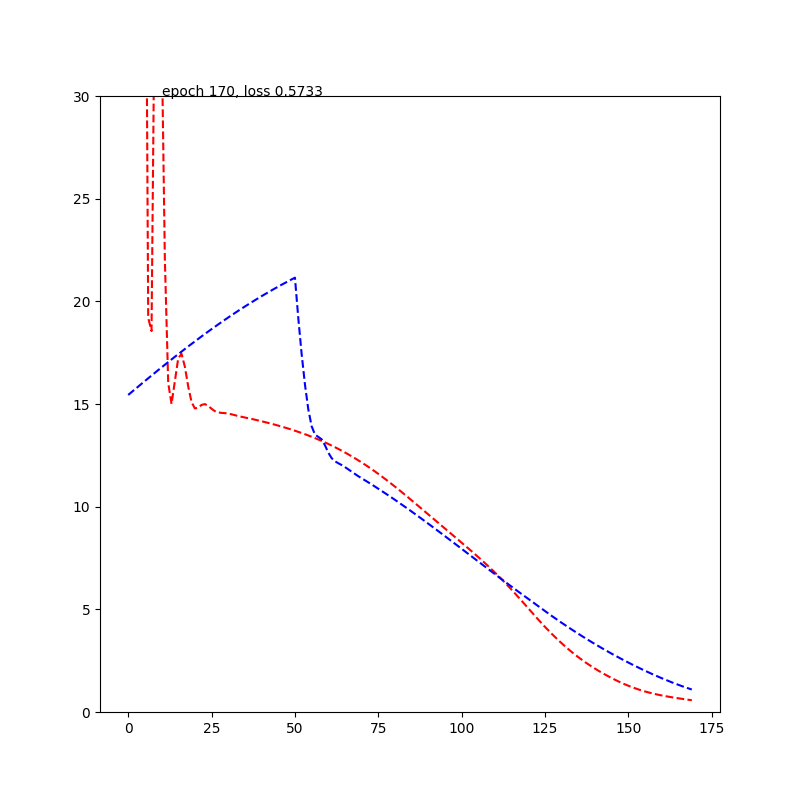

stop with loss: 0.49321994185447693
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


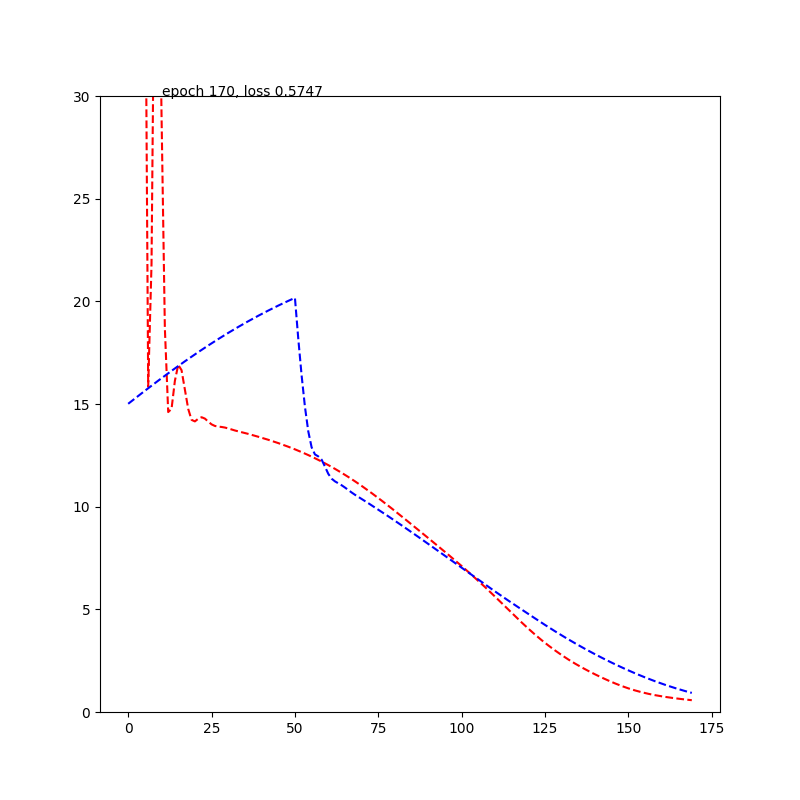

stop with loss: 0.4990769326686859
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


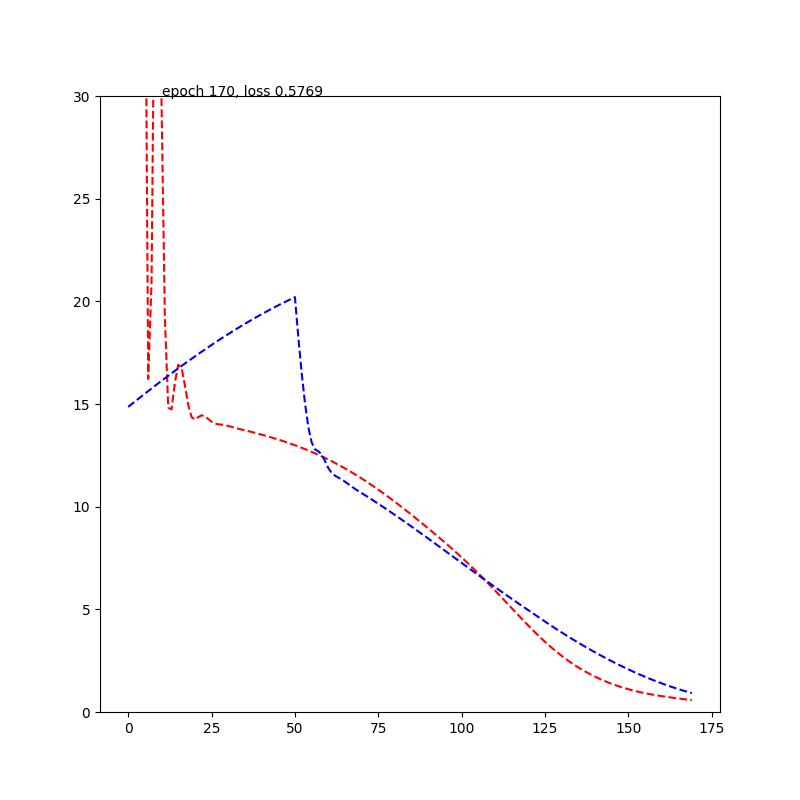

stop with loss: 0.48793885111808777
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


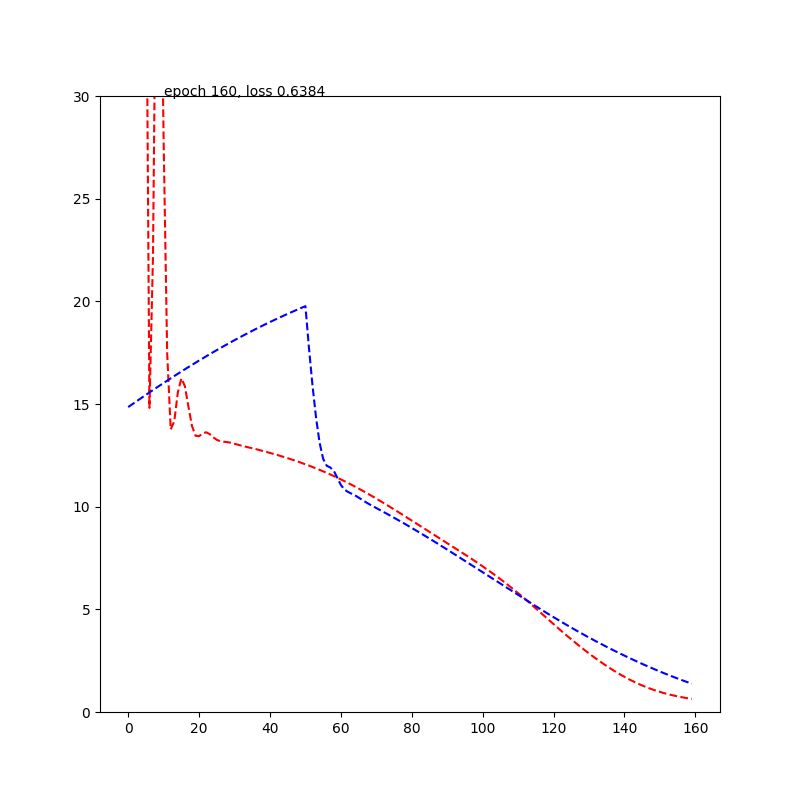

stop with loss: 0.49442145228385925
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


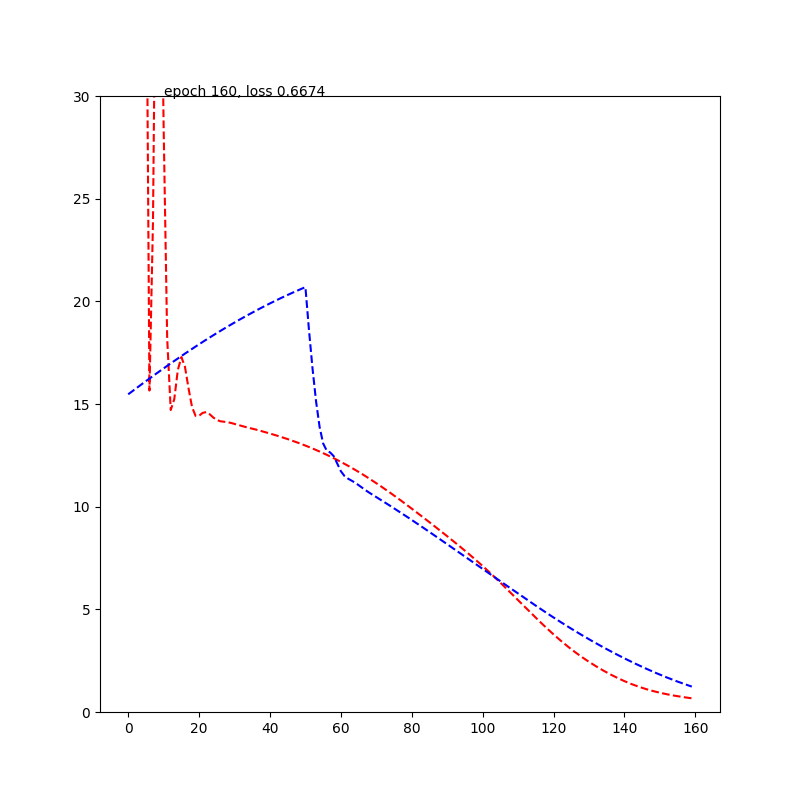

stop with loss: 0.49521034955978394
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


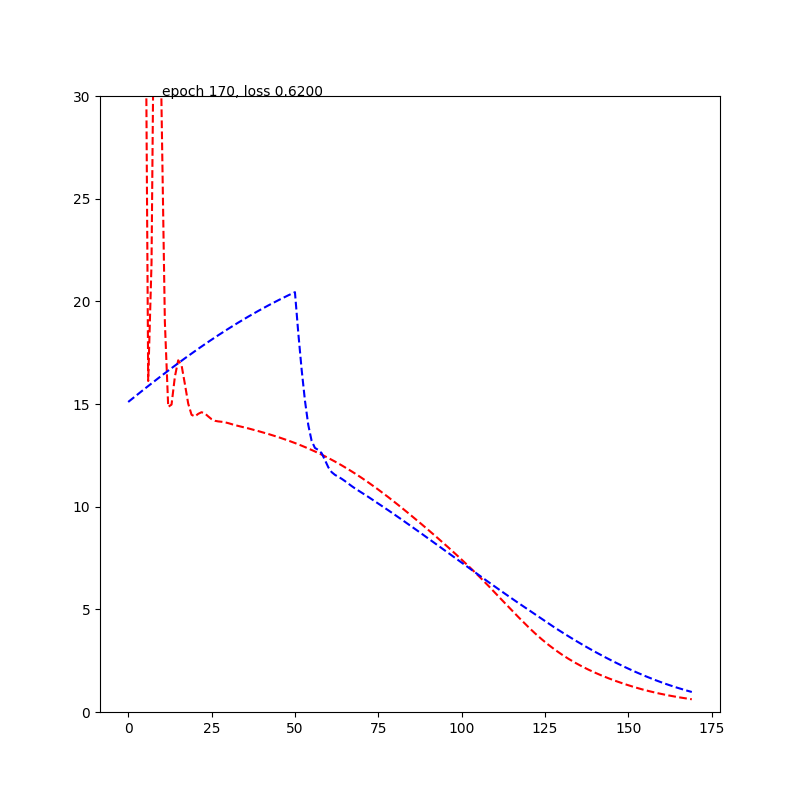

stop with loss: 0.4988808035850525
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


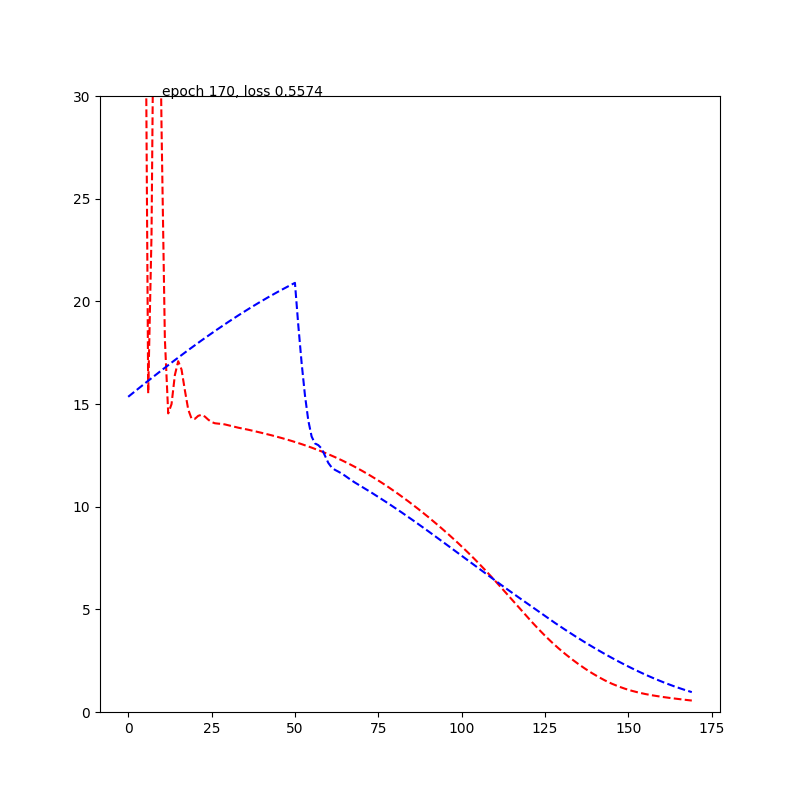

stop with loss: 0.49106499552726746
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


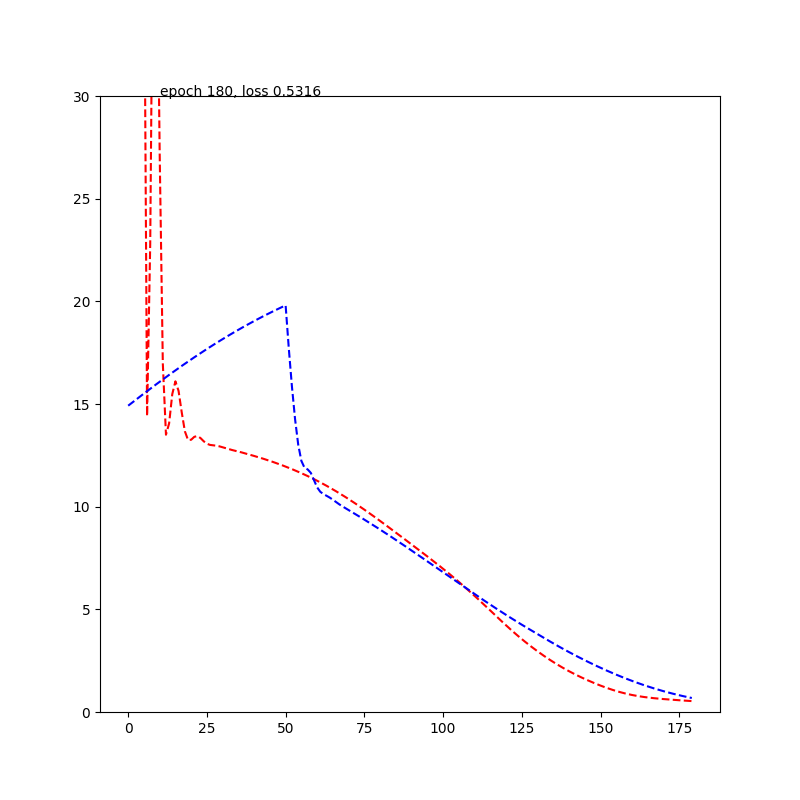

stop with loss: 0.4919838011264801
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


/home/xin/environments/lib/python3.6/site-packages/scipy/optimize/minpack.py:794: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


<IPython.core.display.Javascript object>


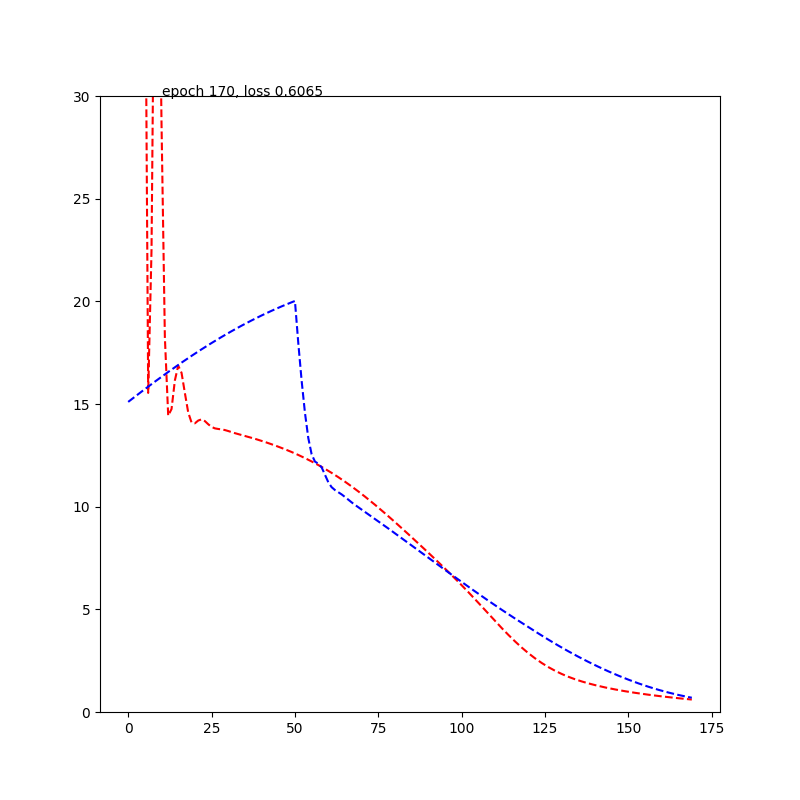

stop with loss: 0.49360227584838867
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=140, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


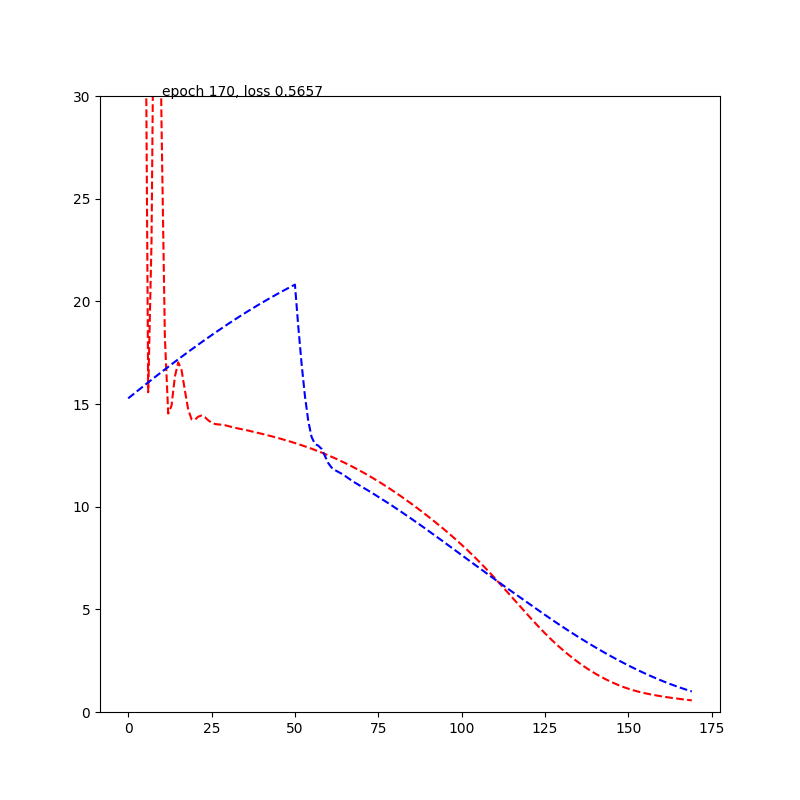

stop with loss: 0.4974225163459778
processing on: %s -------------------------- ReHo
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


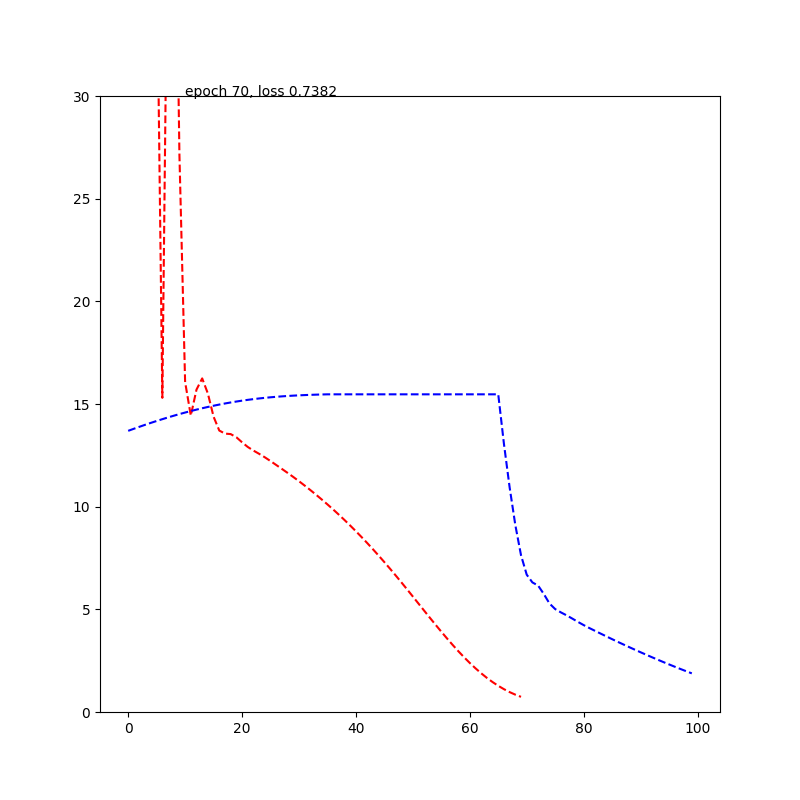

stop with loss: 0.4592876732349396
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


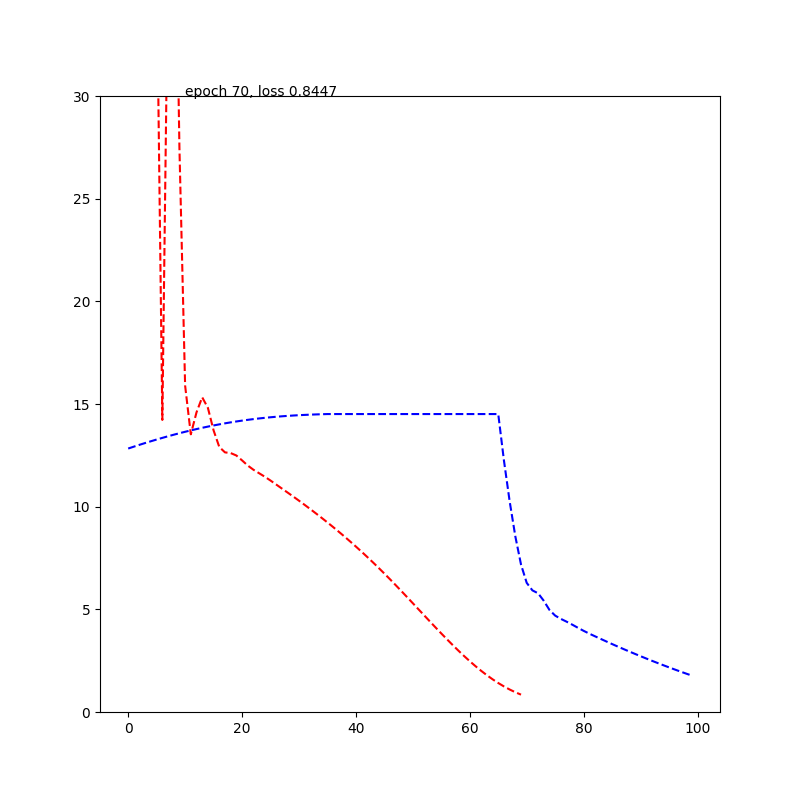

stop with loss: 0.45826512575149536
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


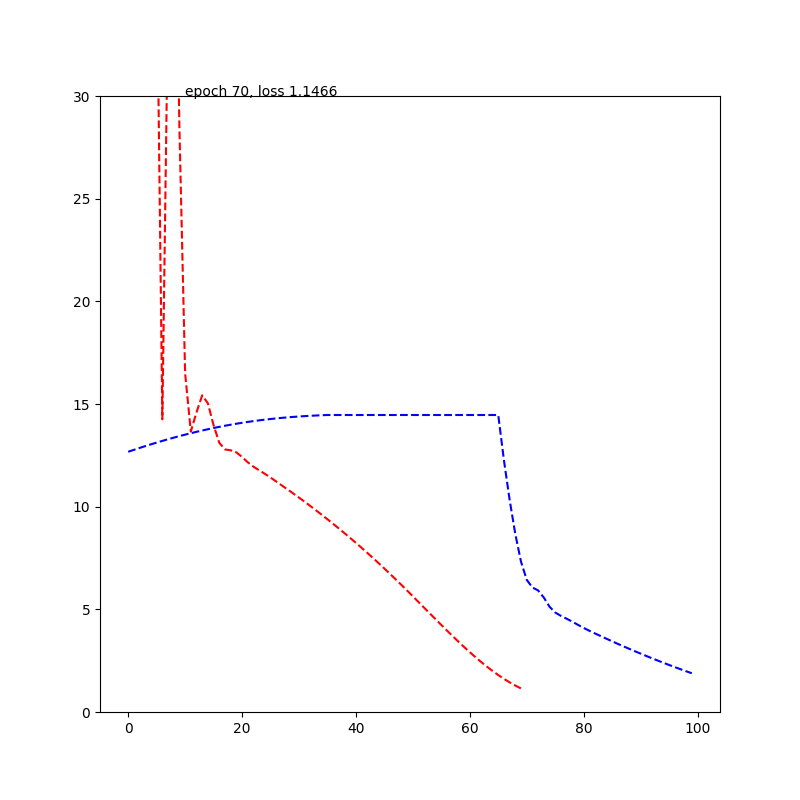

stop with loss: 0.45544183254241943
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


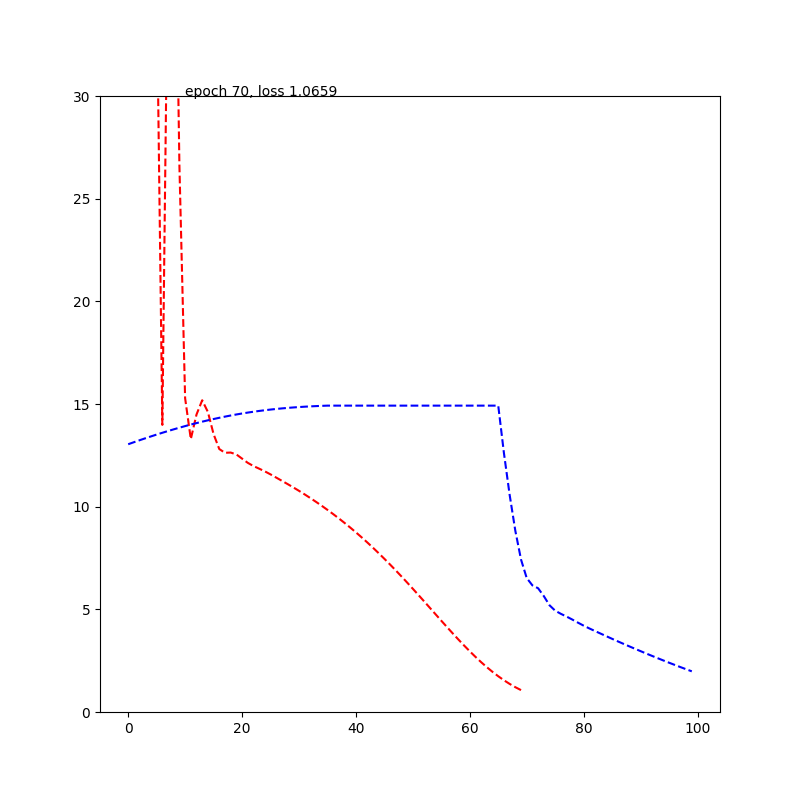

stop with loss: 0.4819630980491638
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


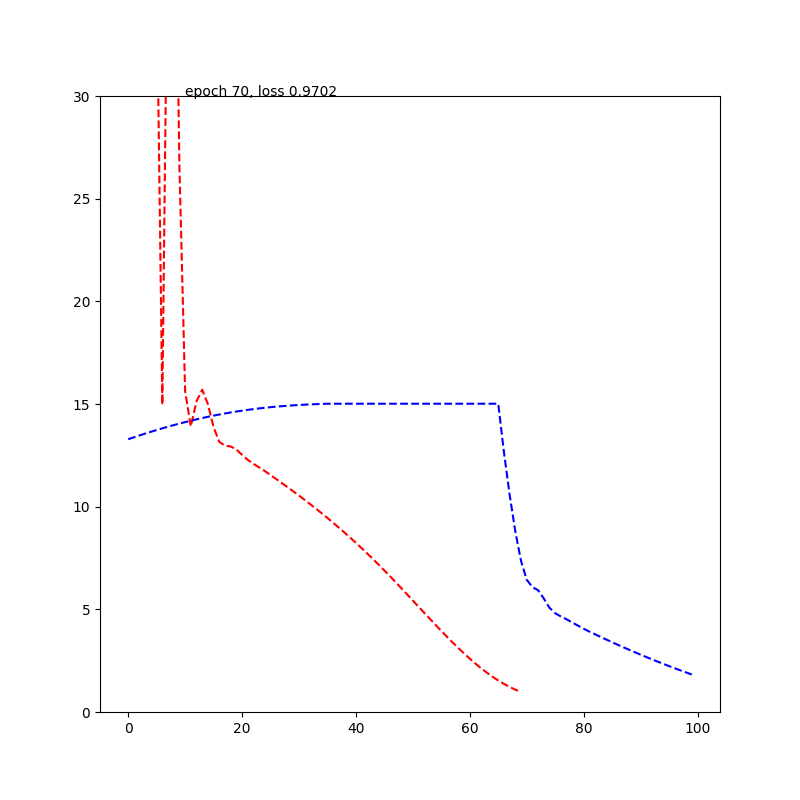

stop with loss: 0.4910012483596802
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


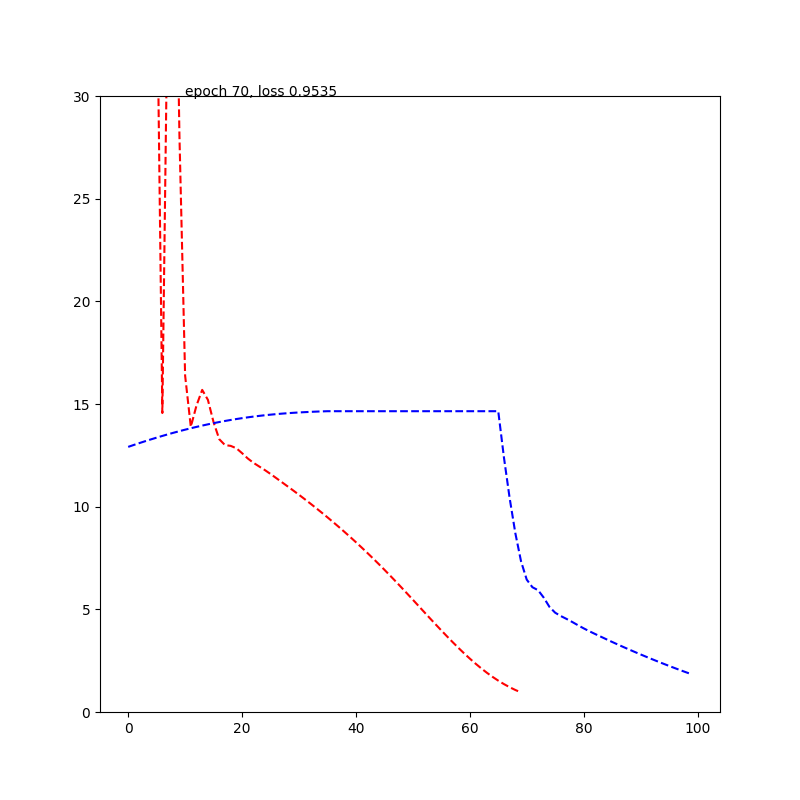

stop with loss: 0.47792956233024597
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


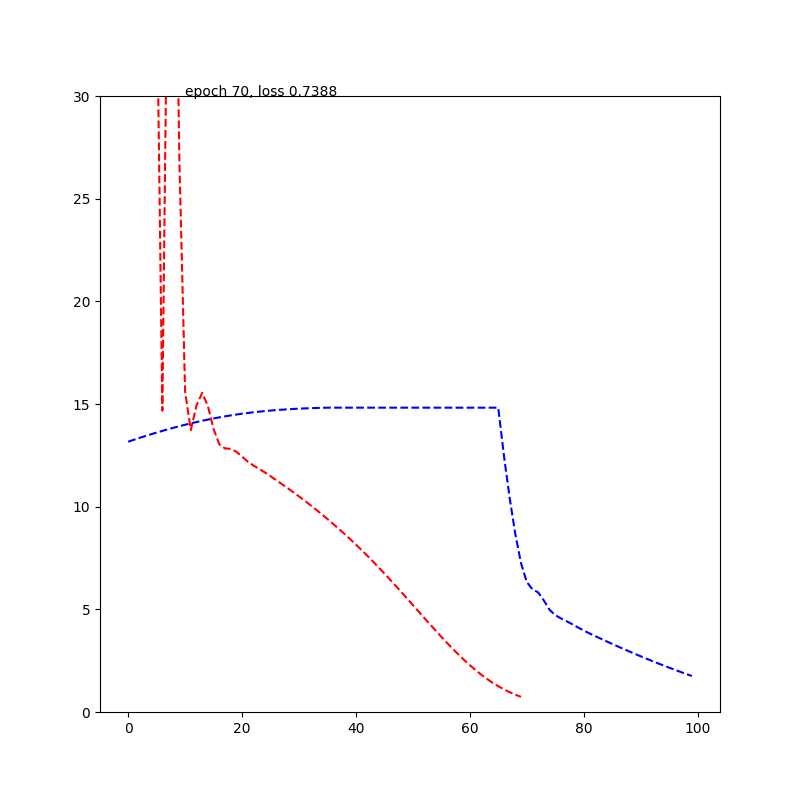

stop with loss: 0.45260077714920044
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


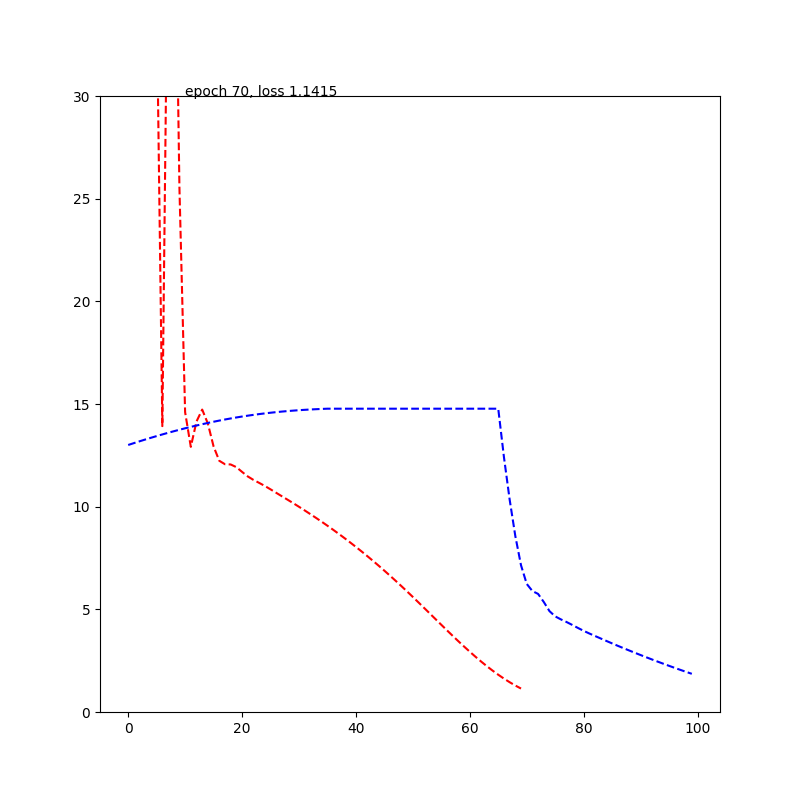

stop with loss: 0.4757165014743805
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


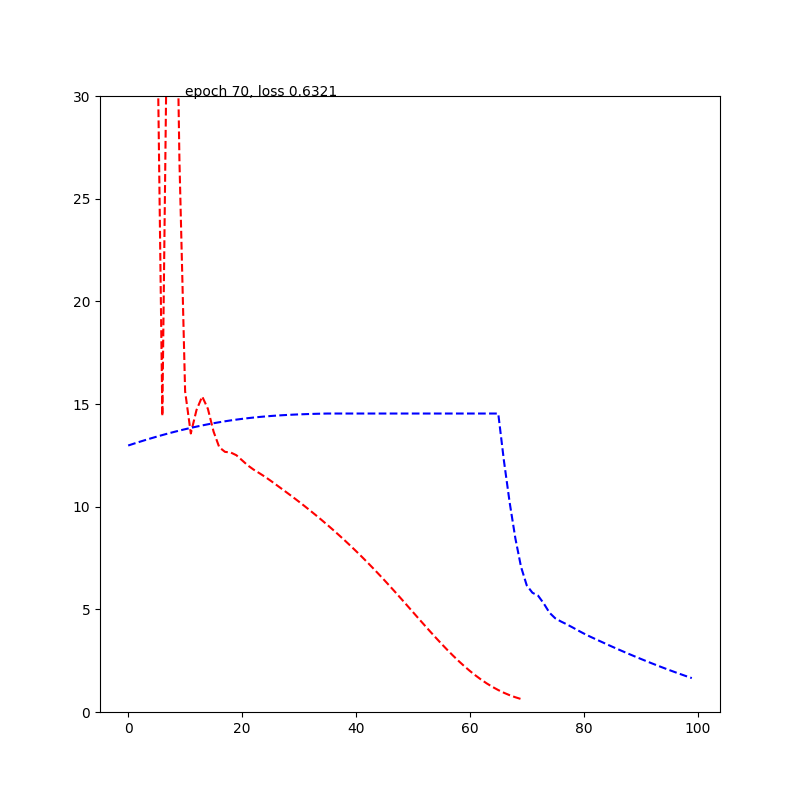

stop with loss: 0.49855828285217285
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


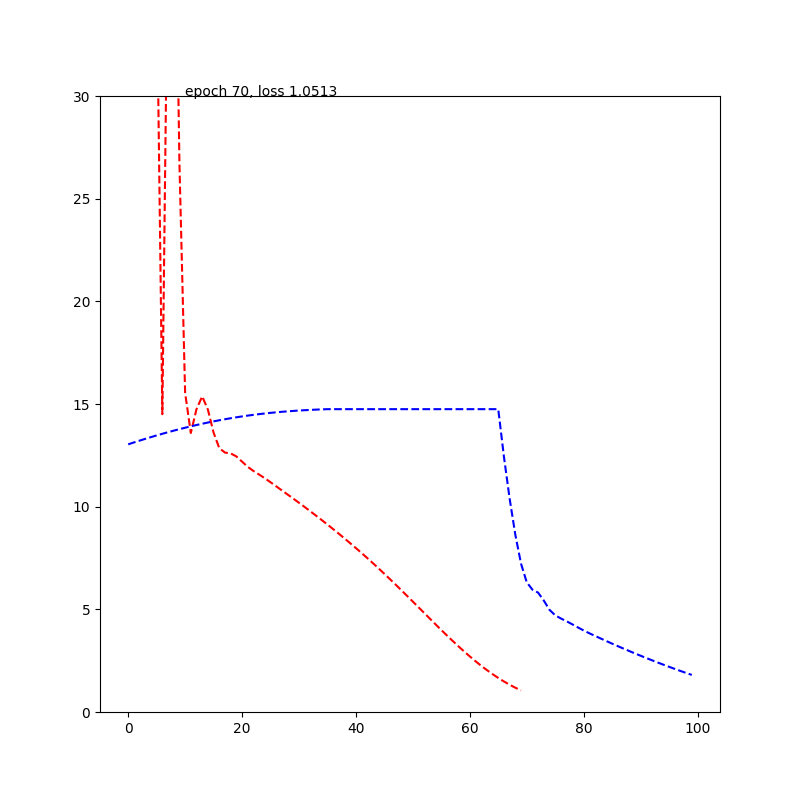

stop with loss: 0.468706876039505
processing on: %s -------------------------- ALFF
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


/home/xin/environments/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


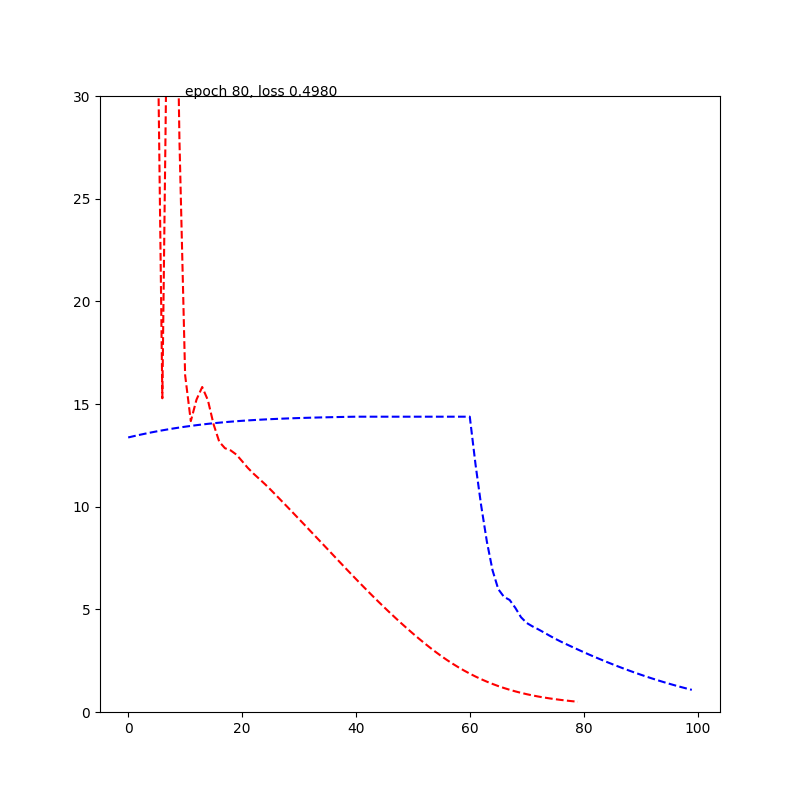

stop with loss: 0.4980194568634033
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


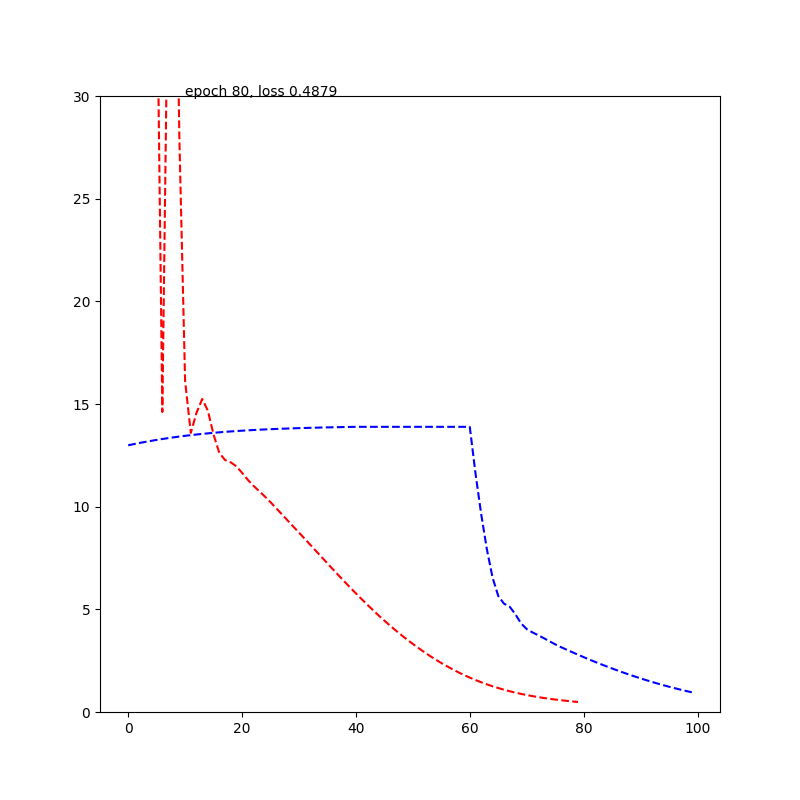

stop with loss: 0.4878542721271515
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


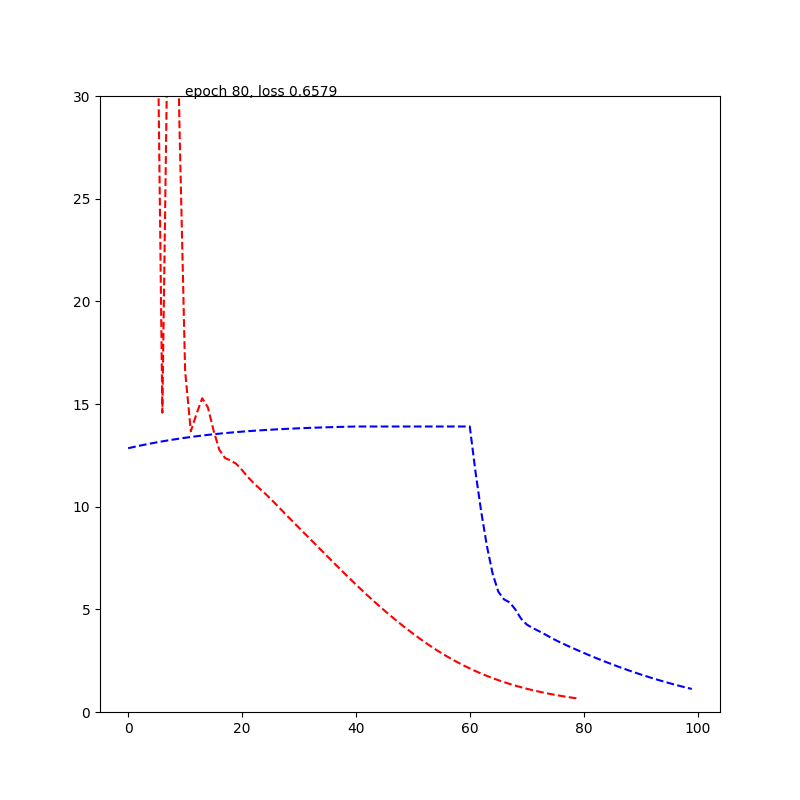

stop with loss: 0.49704551696777344
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


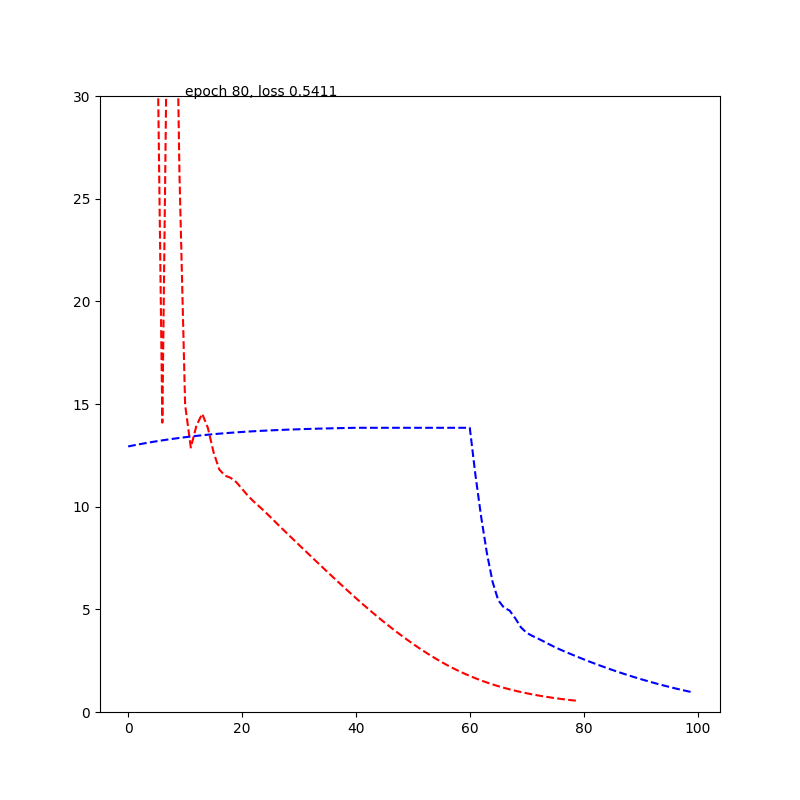

stop with loss: 0.48885369300842285
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


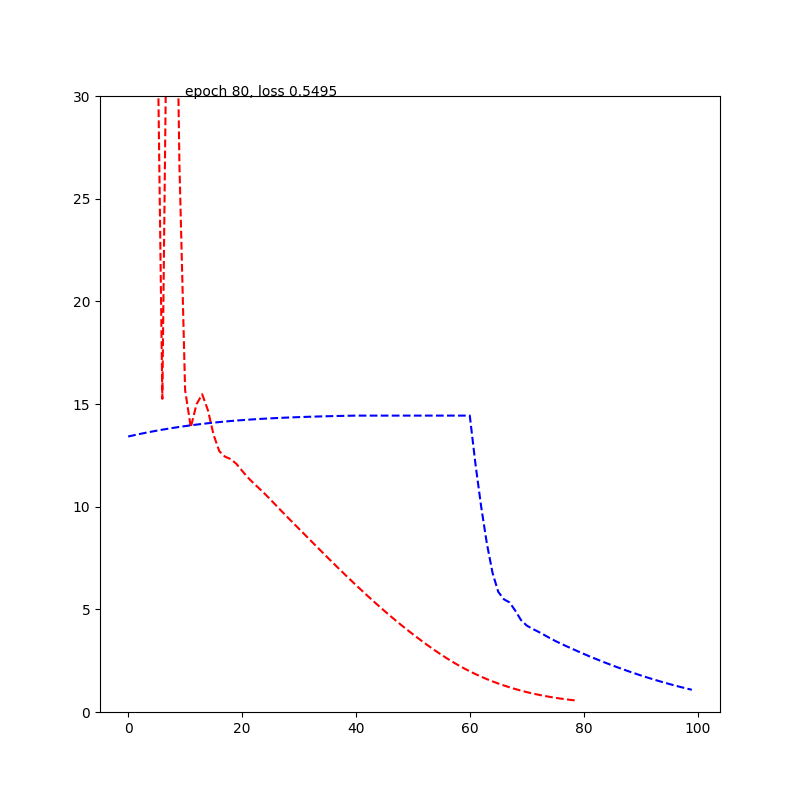

stop with loss: 0.49682289361953735
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


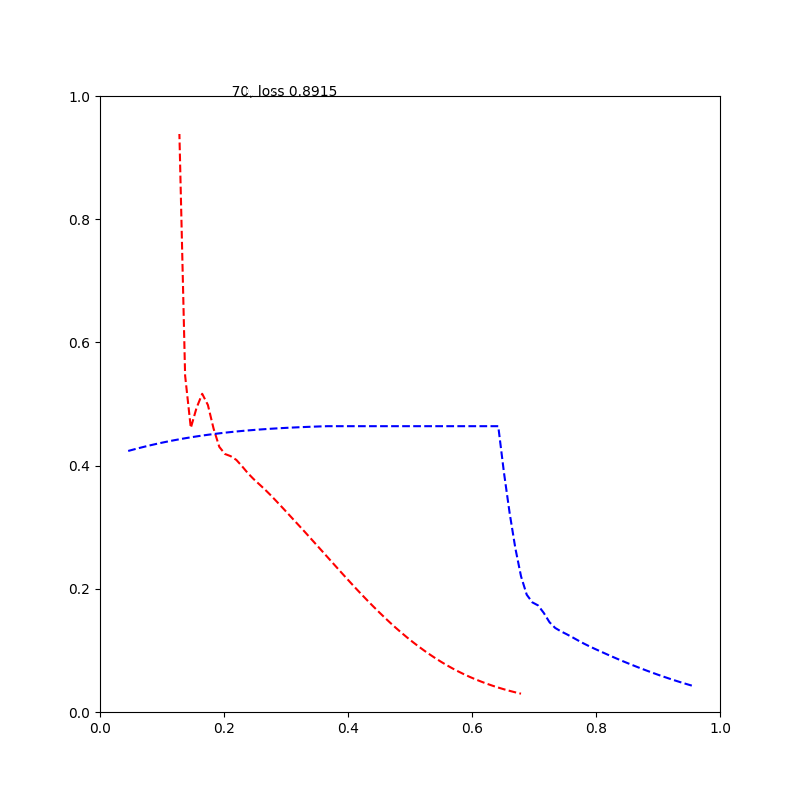

stop with loss: 0.4948538839817047
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


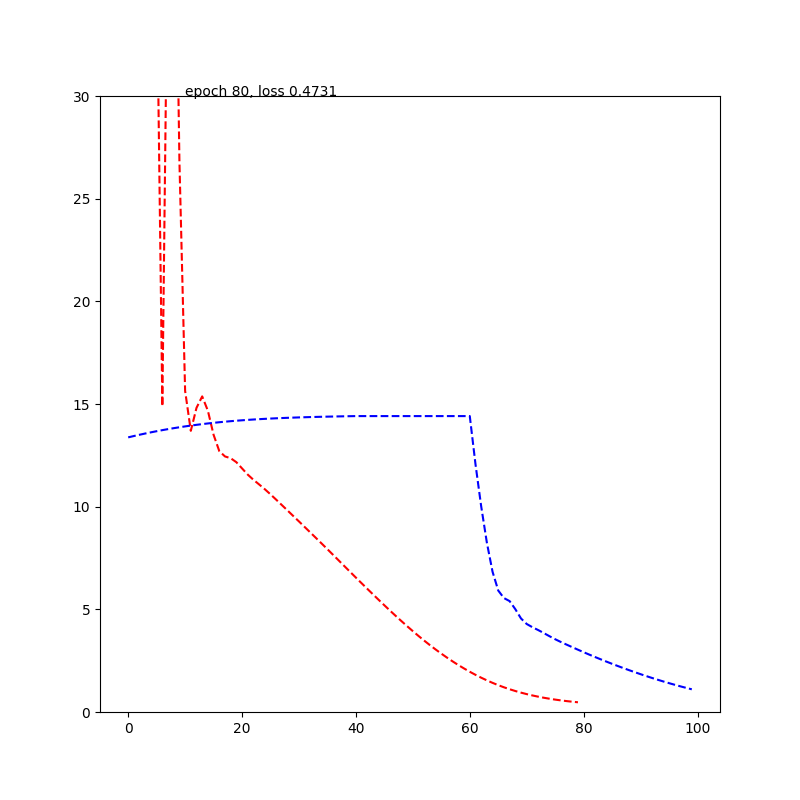

stop with loss: 0.47310906648635864
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


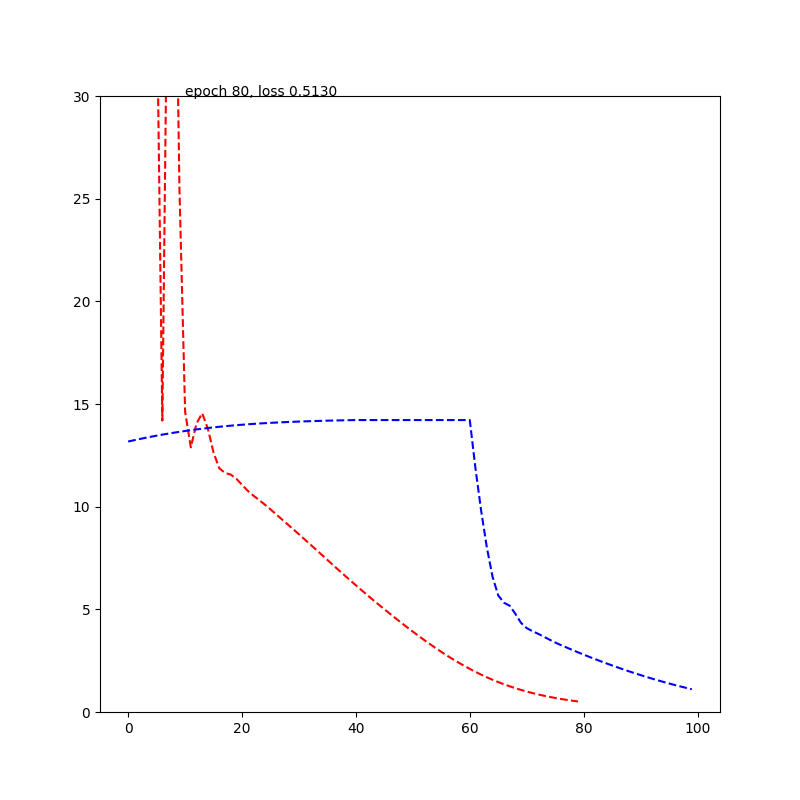

stop with loss: 0.4791249930858612
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


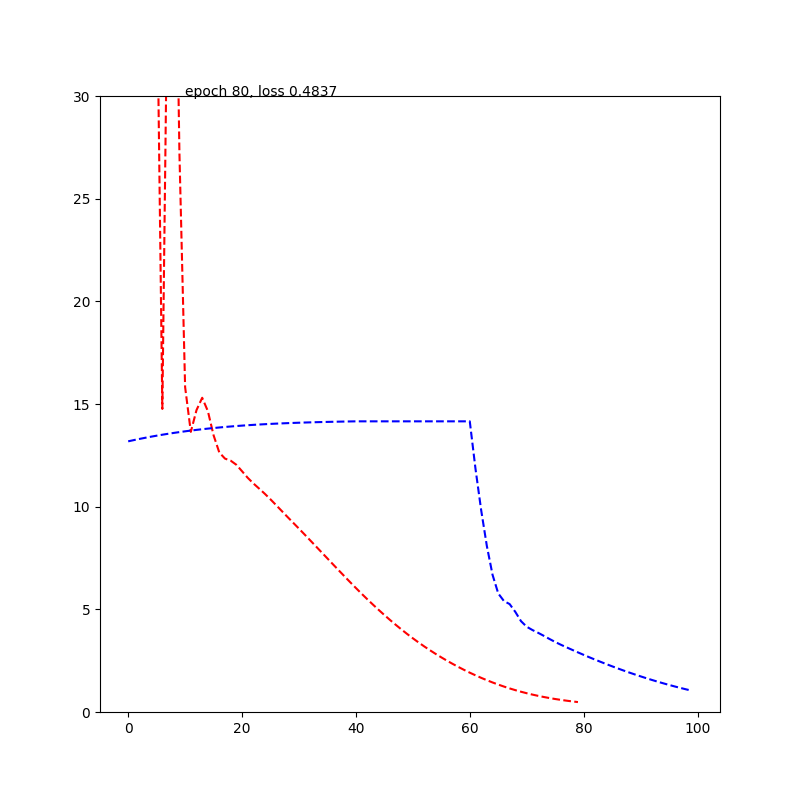

stop with loss: 0.48369404673576355
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=246, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


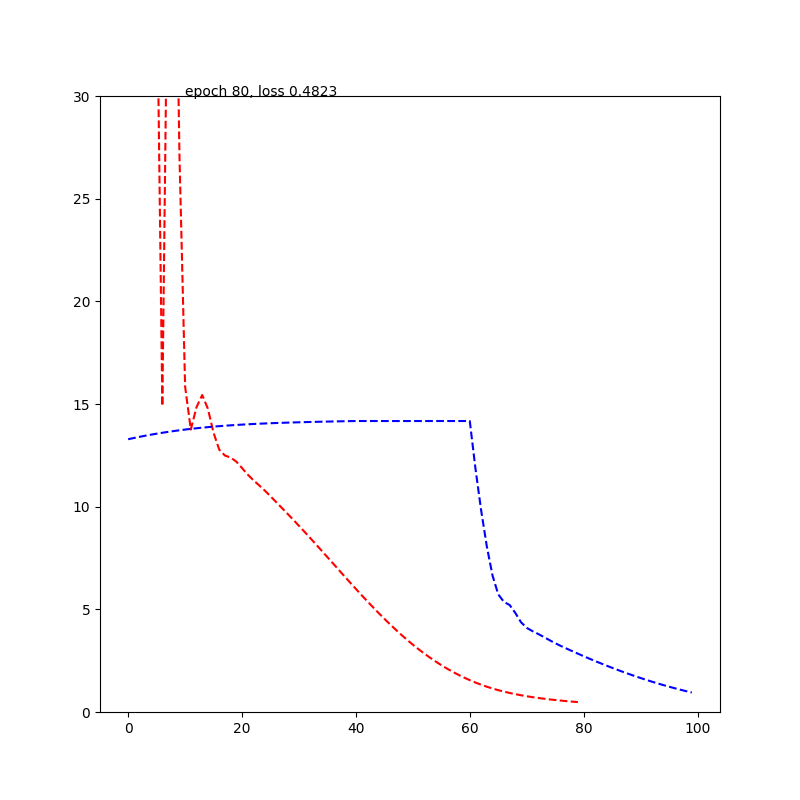

stop with loss: 0.48229551315307617
processing on: %s -------------------------- FA
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


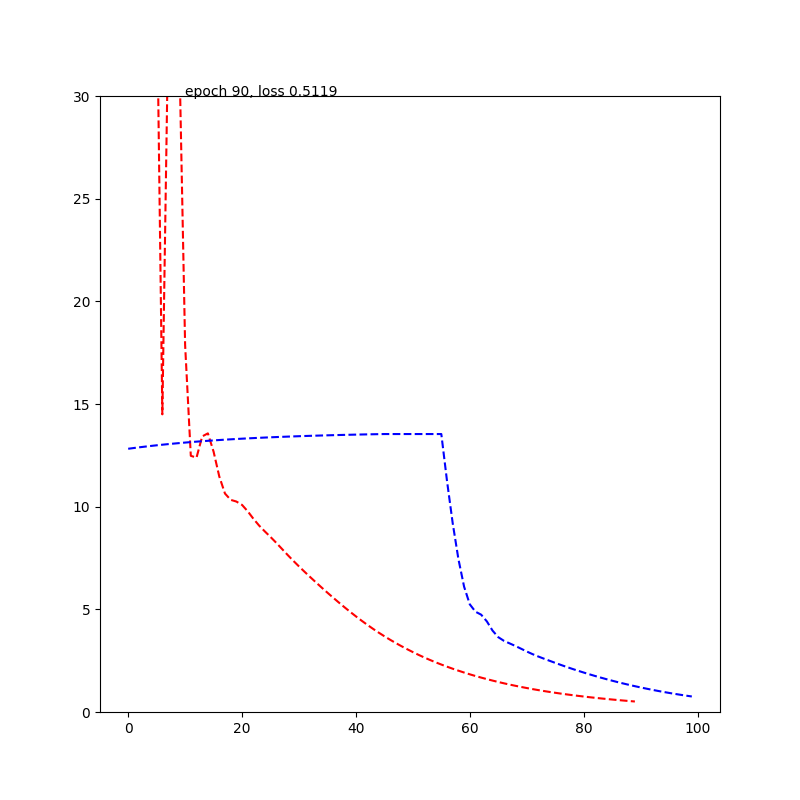

stop with loss: 0.4902995228767395
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


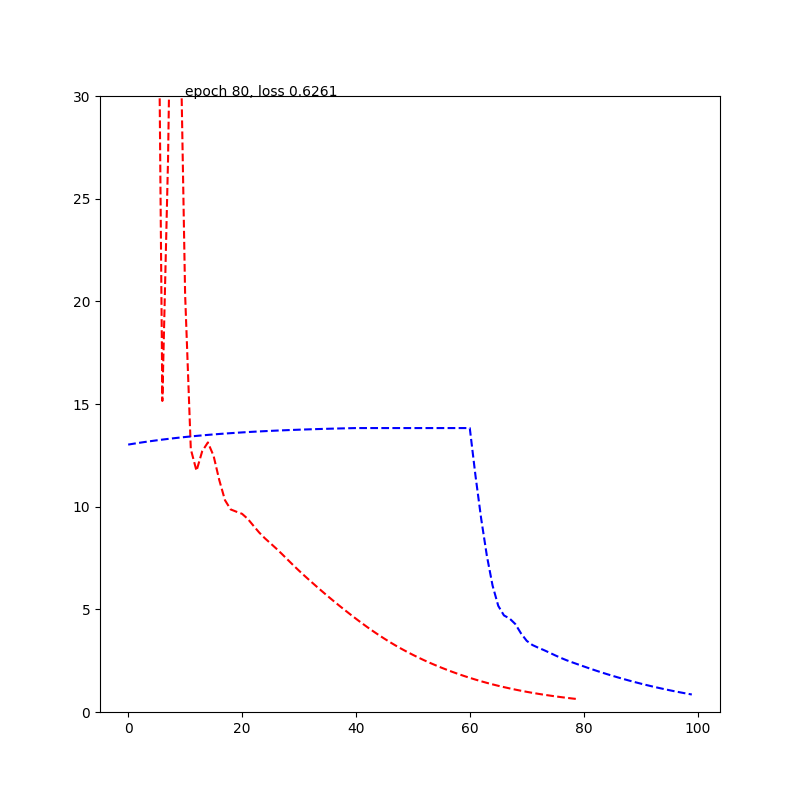

stop with loss: 0.4939359724521637
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


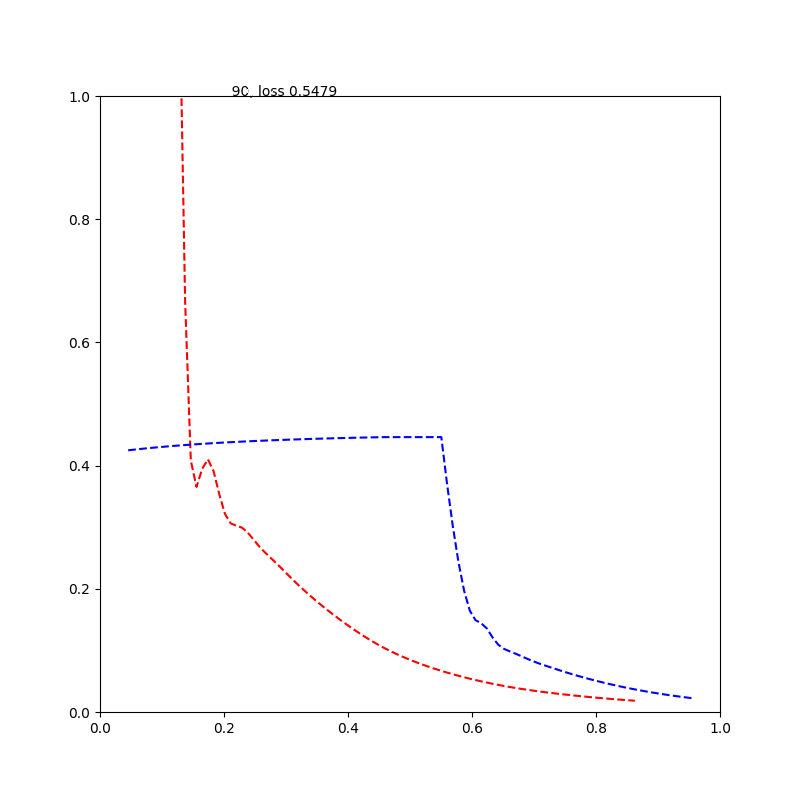

stop with loss: 0.4925094246864319
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


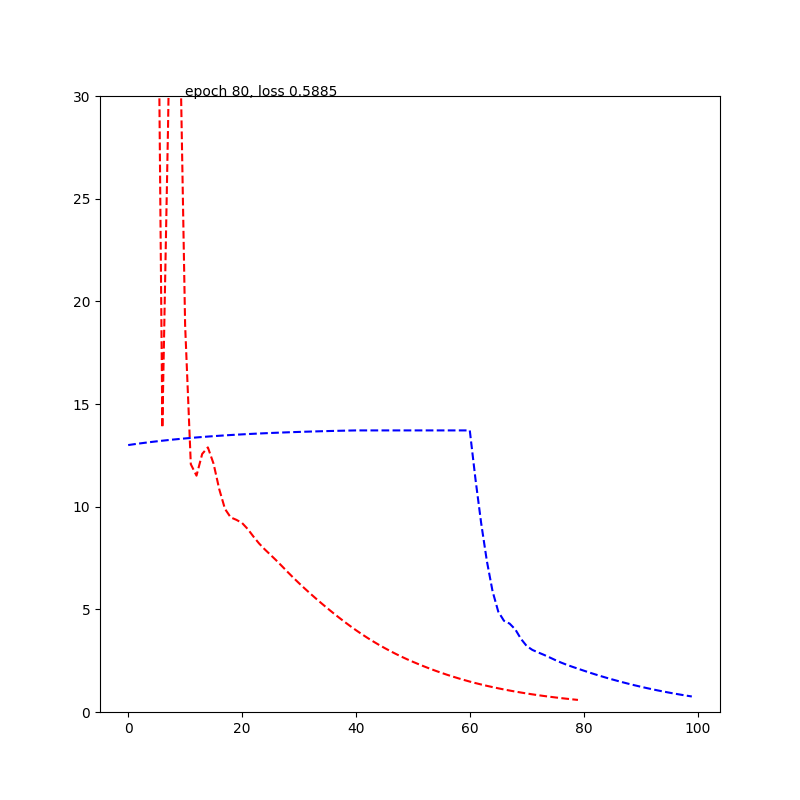

stop with loss: 0.4878442883491516
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


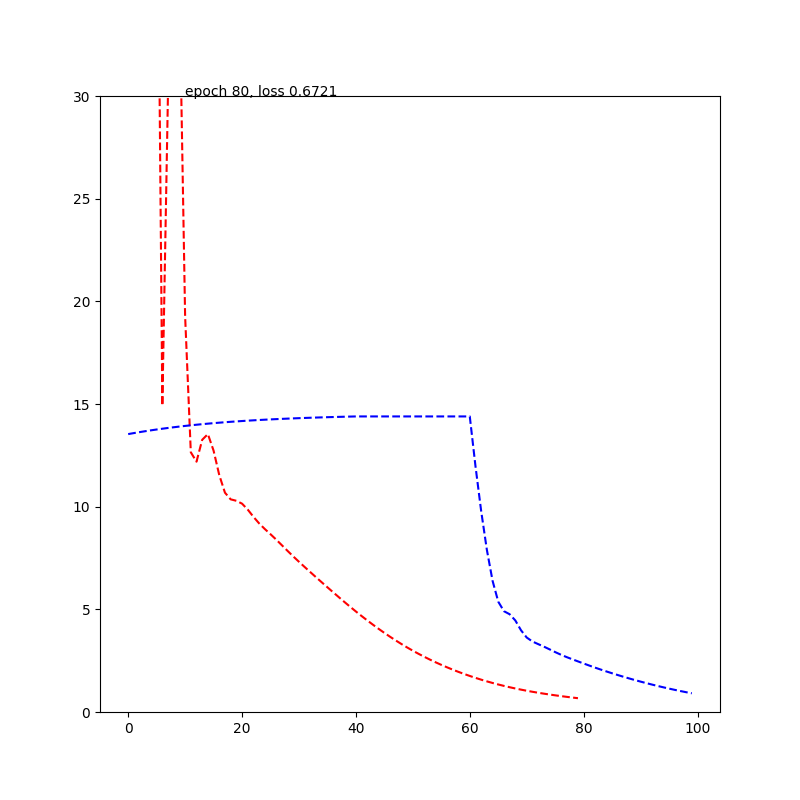

stop with loss: 0.48562753200531006
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


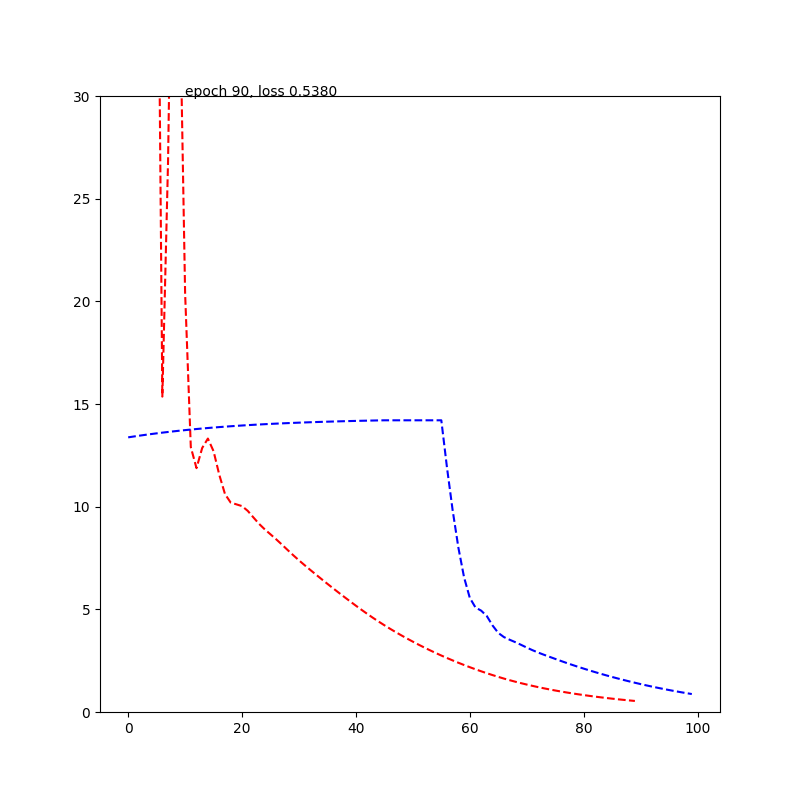

stop with loss: 0.48995906114578247
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


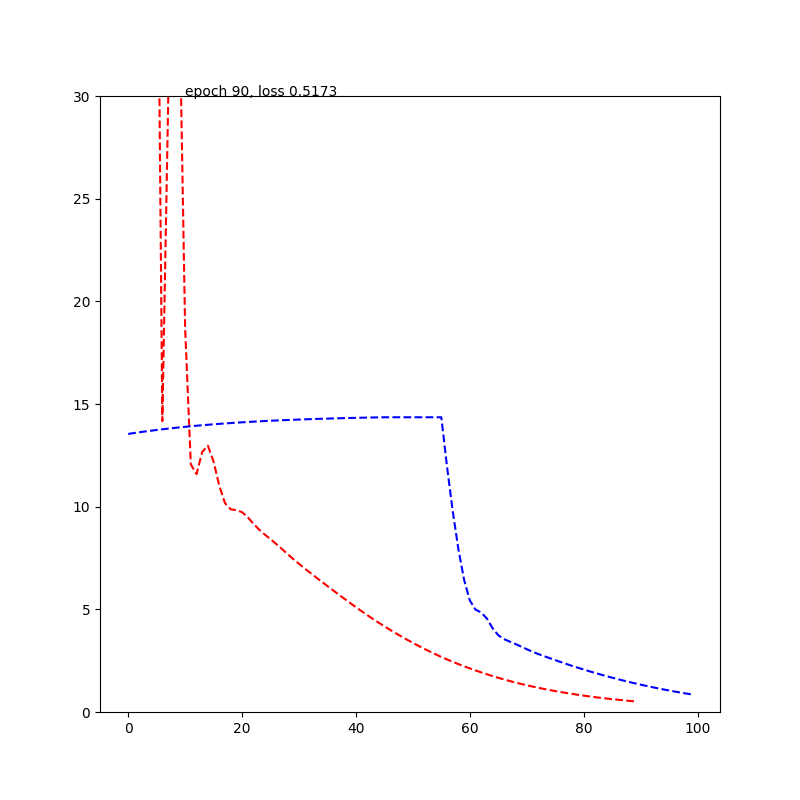

stop with loss: 0.4931281507015228
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


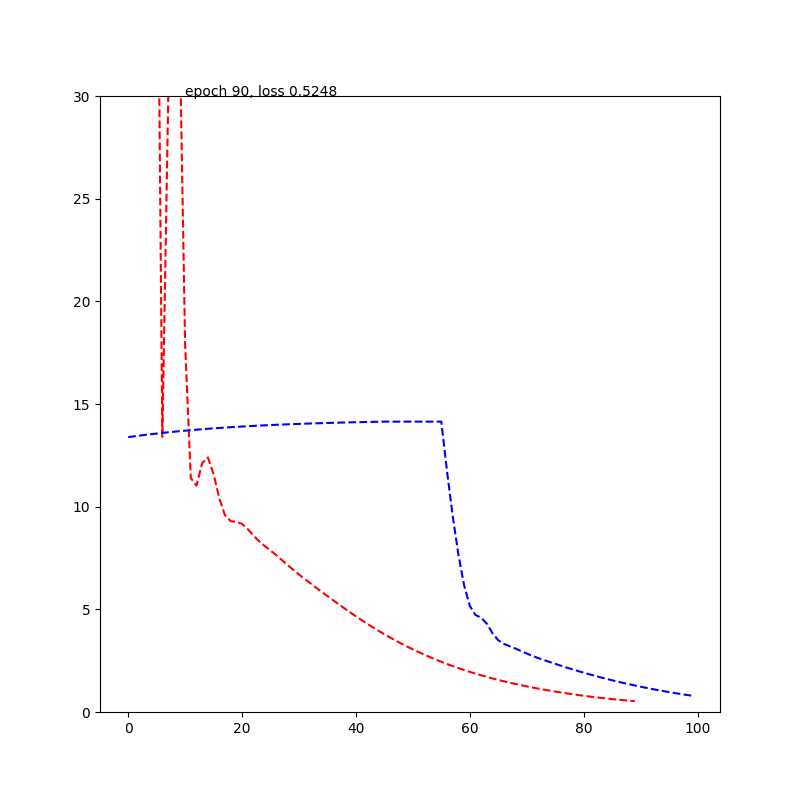

stop with loss: 0.4796527028083801
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


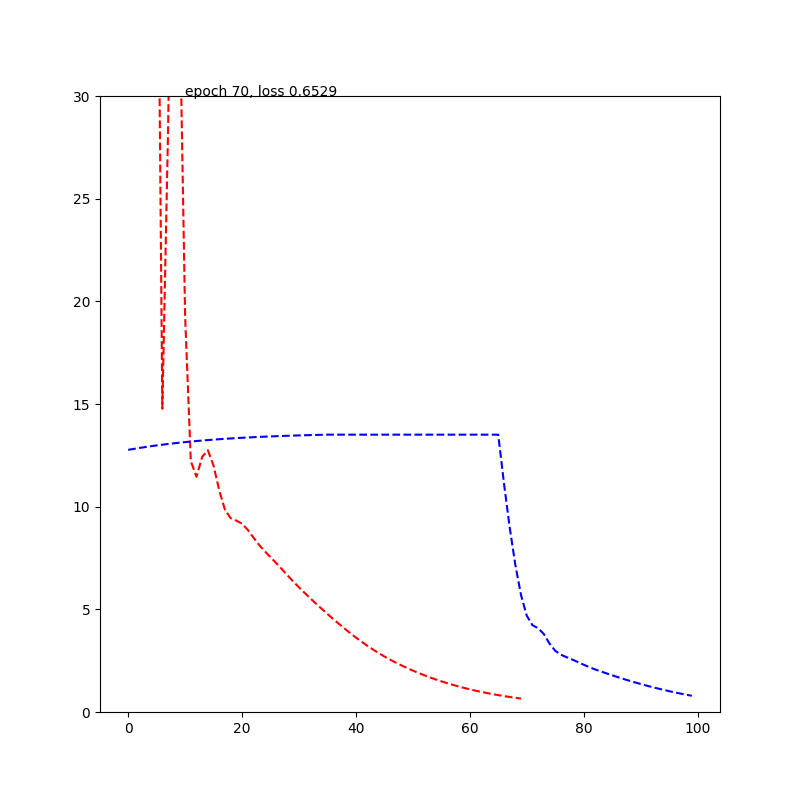

stop with loss: 0.49576690793037415
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


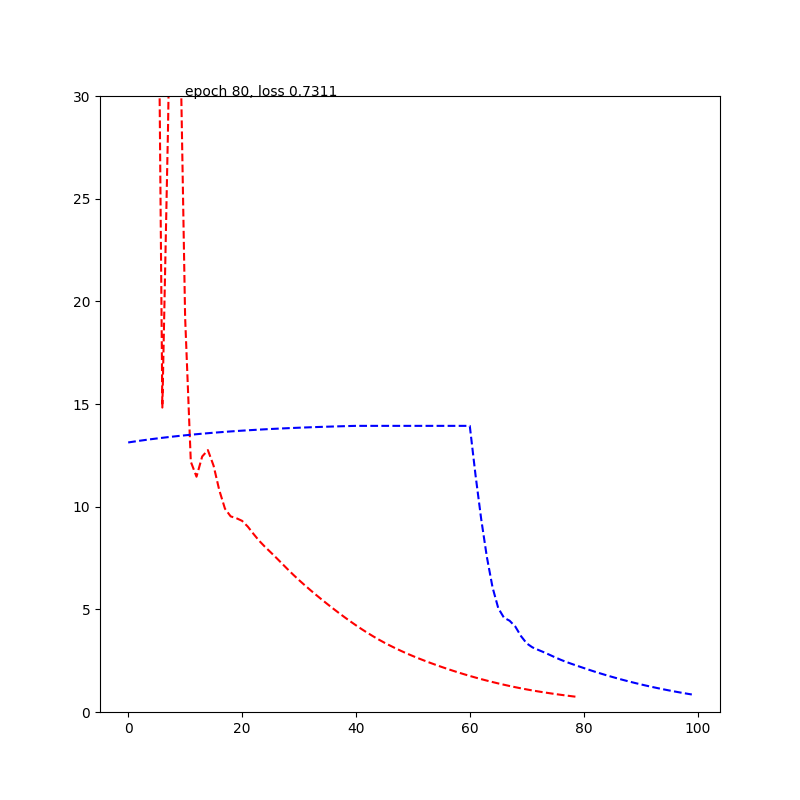

stop with loss: 0.49125030636787415
processing on: %s -------------------------- MD
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


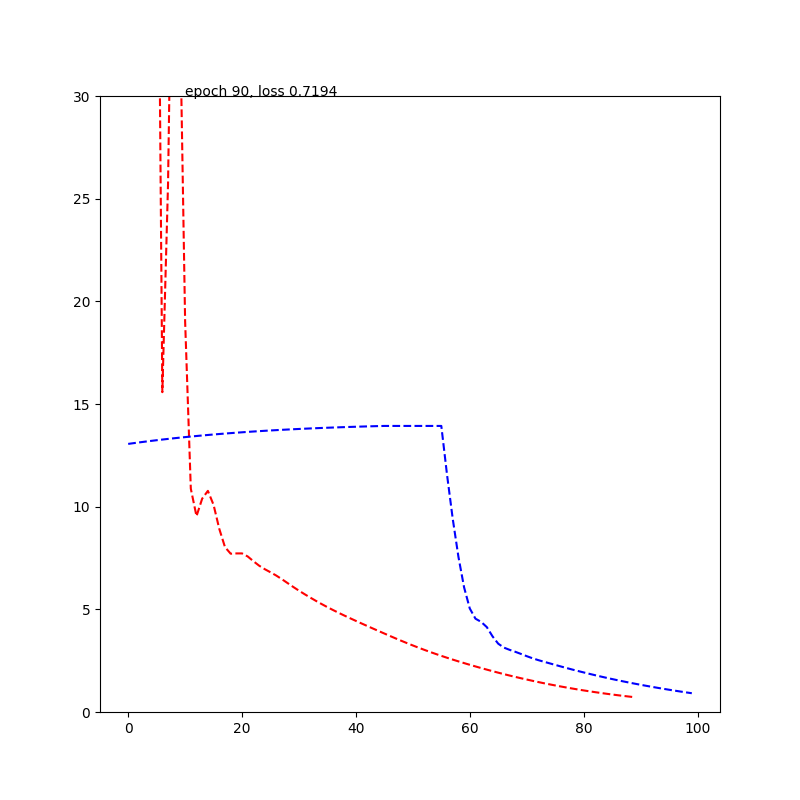

stop with loss: 0.4928431510925293
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


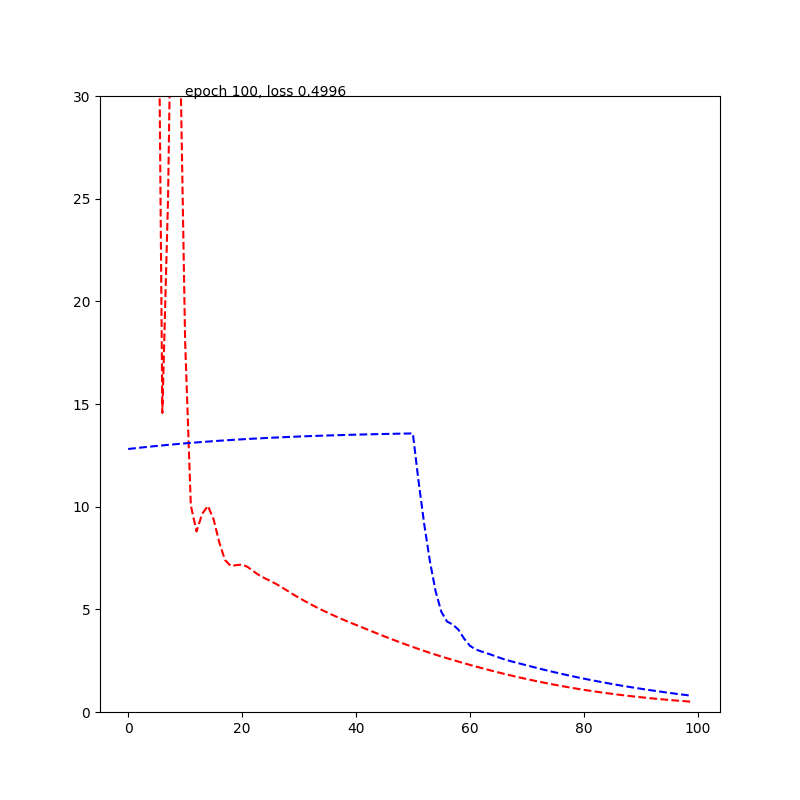

stop with loss: 0.4995754361152649
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


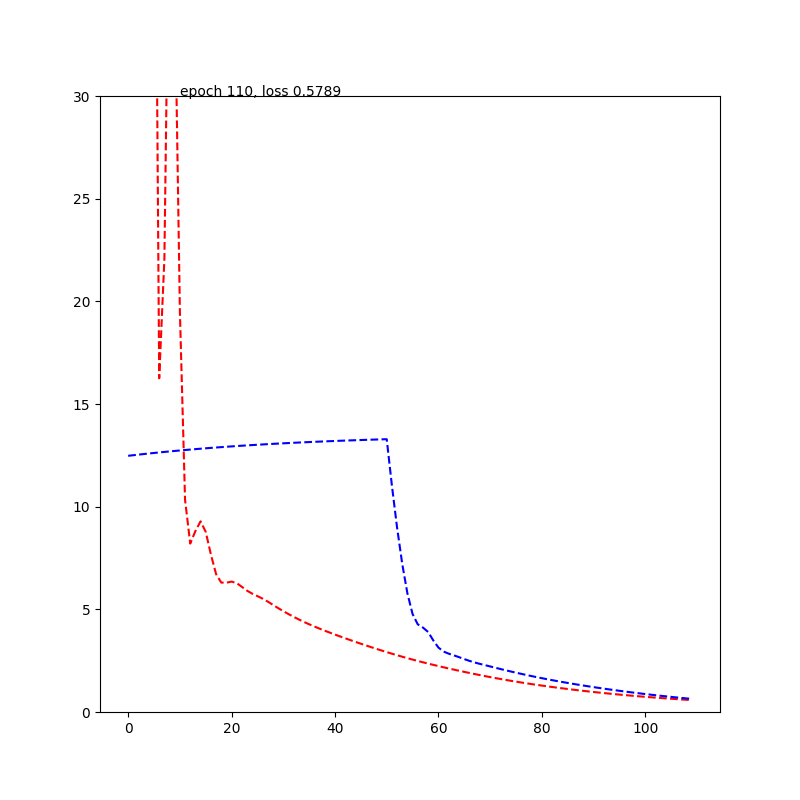

stop with loss: 0.4932374060153961
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


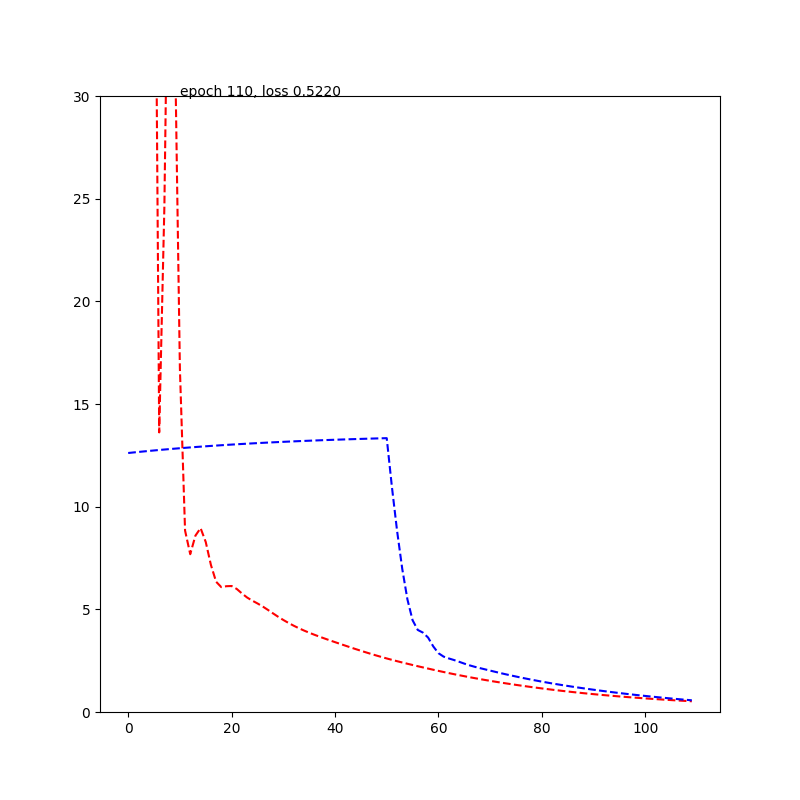

stop with loss: 0.49554431438446045
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


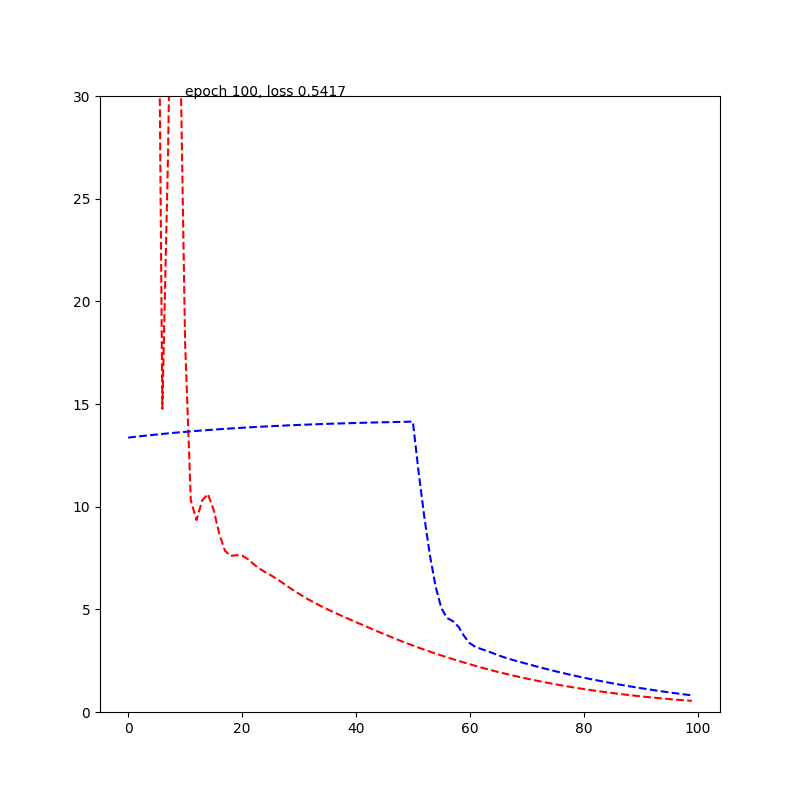

stop with loss: 0.48343440890312195
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


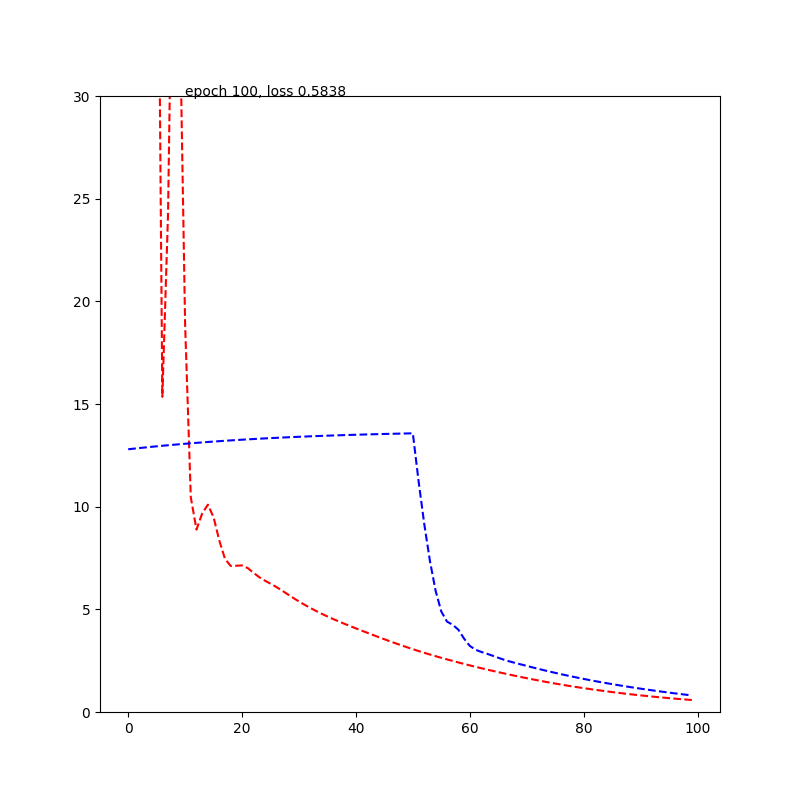

stop with loss: 0.48786282539367676
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


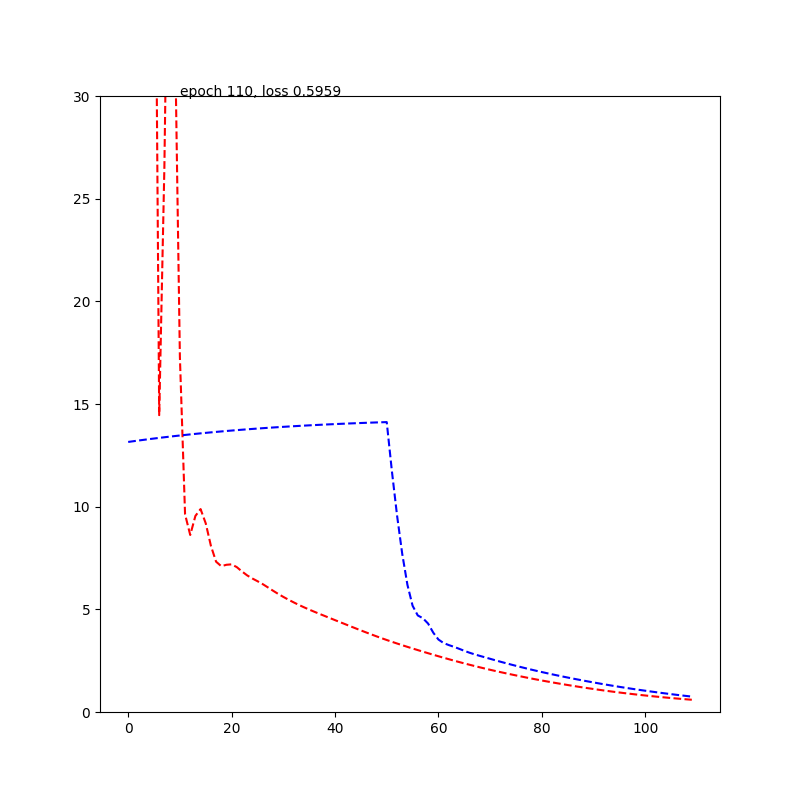

stop with loss: 0.48818790912628174
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


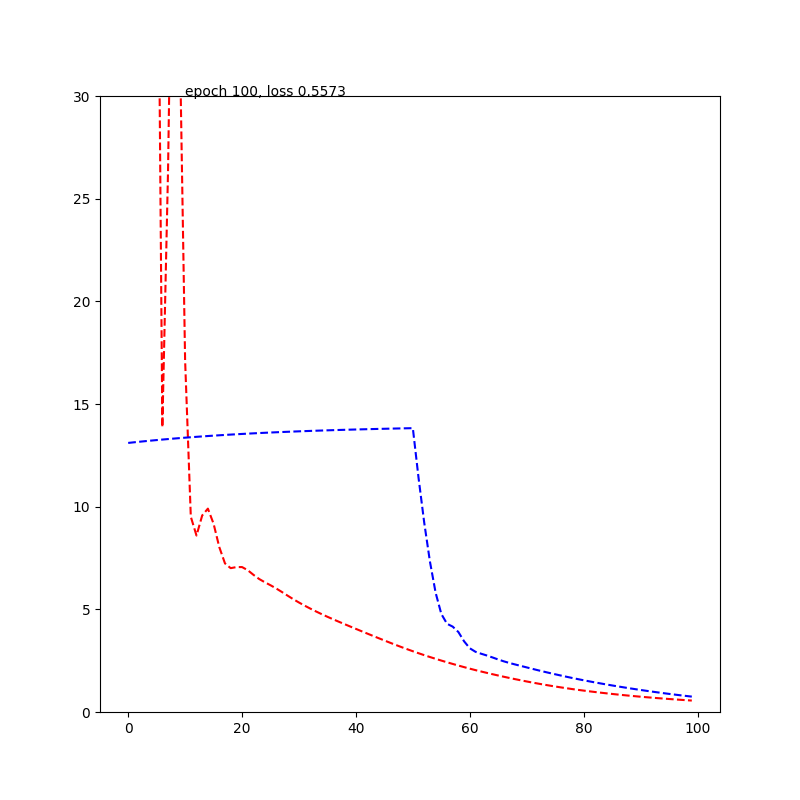

stop with loss: 0.4909745752811432
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


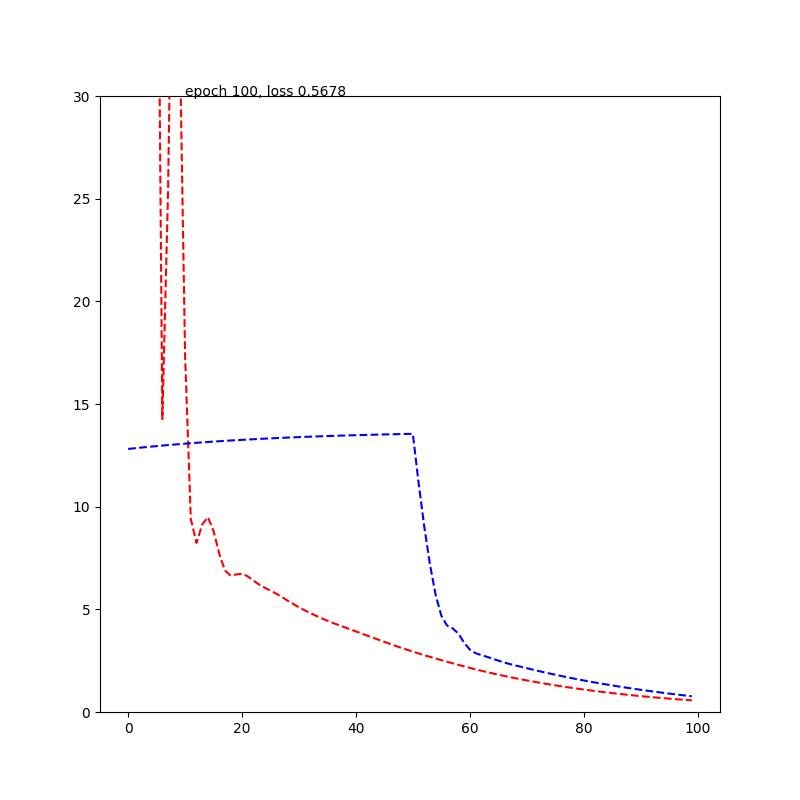

stop with loss: 0.4960628151893616
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=70, out_features=100, bias=True)
    (1): Linear(in_features=100, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=20, bias=True)
    (3): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


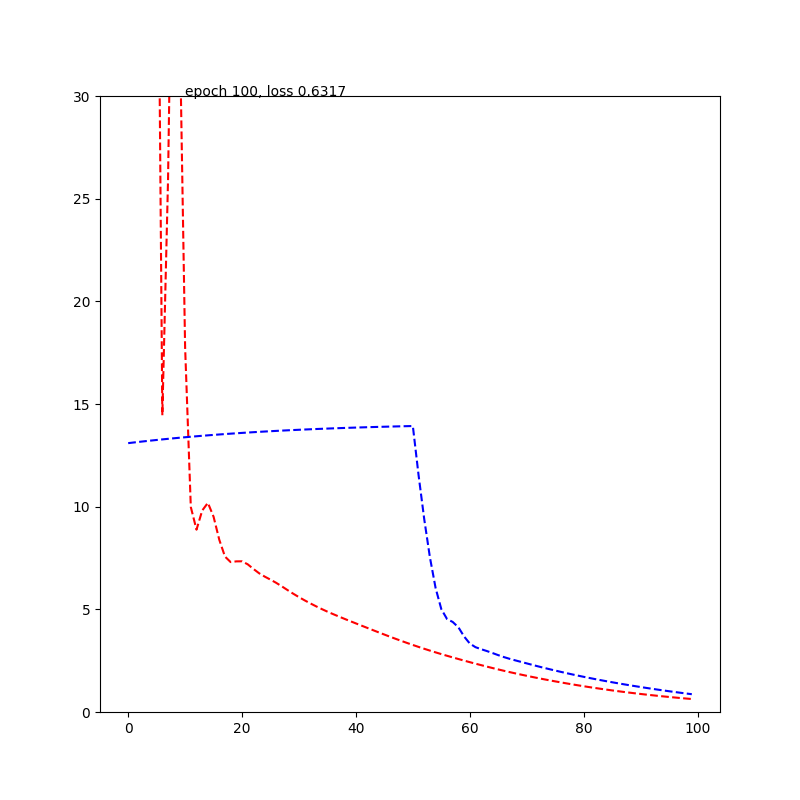

stop with loss: 0.48619410395622253
processing on: %s -------------------------- GMV&DTI
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


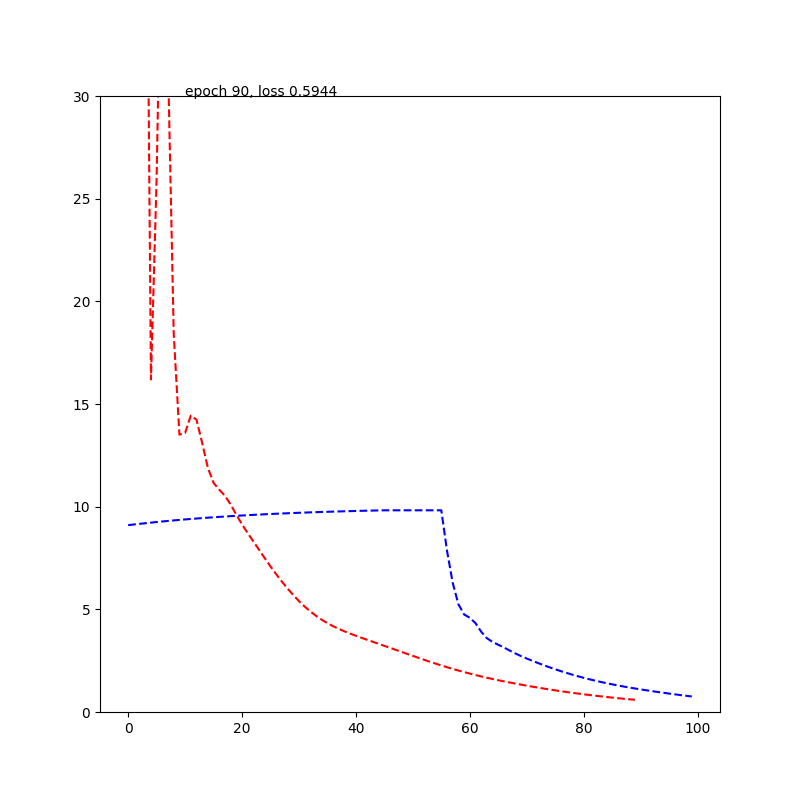

stop with loss: 0.4812493622303009
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


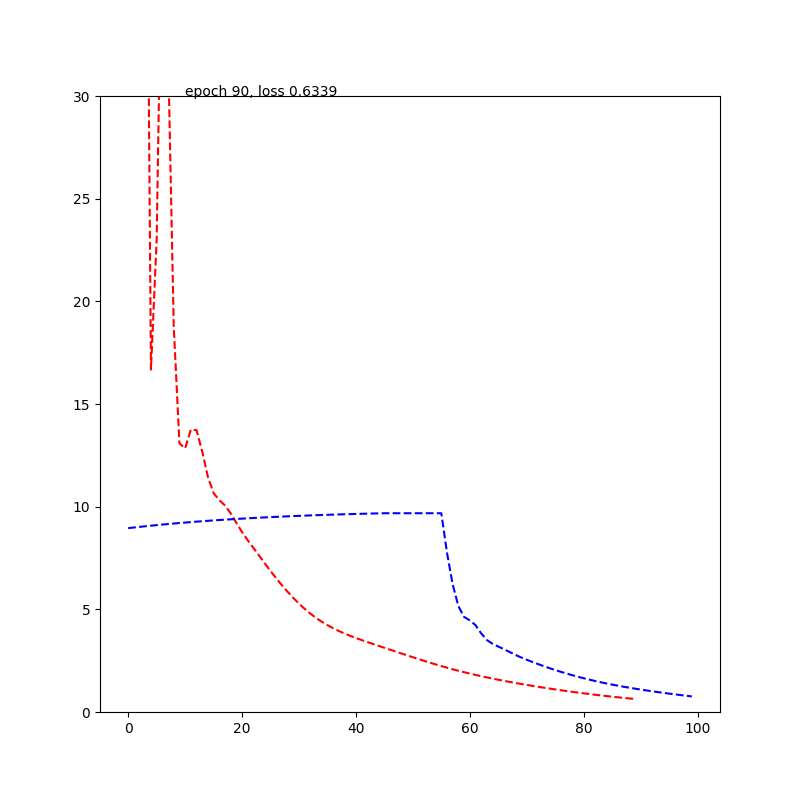

stop with loss: 0.4959297478199005
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


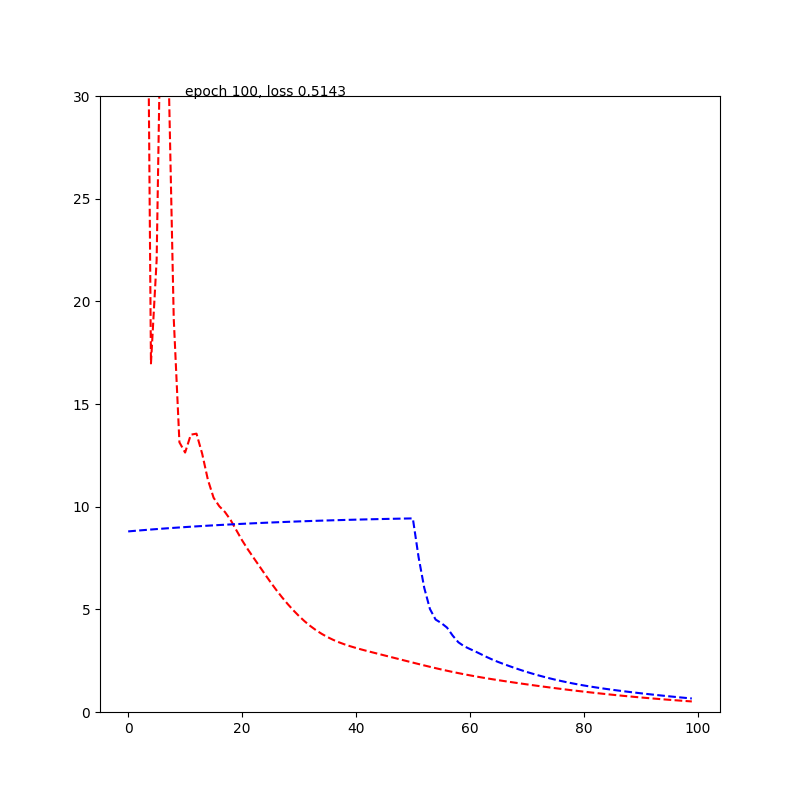

stop with loss: 0.4955674409866333
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


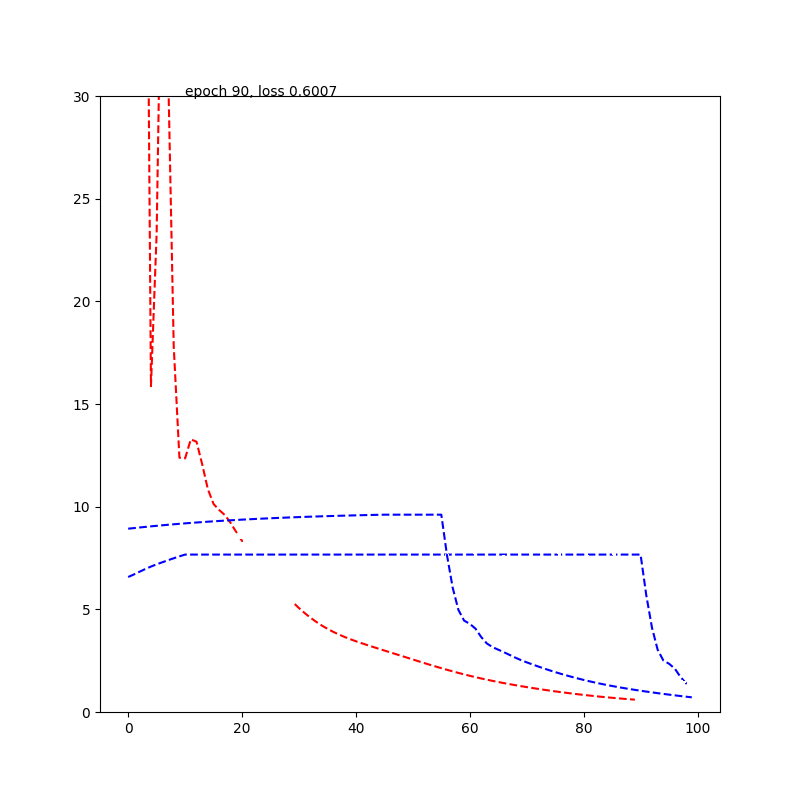

stop with loss: 0.4896470010280609
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


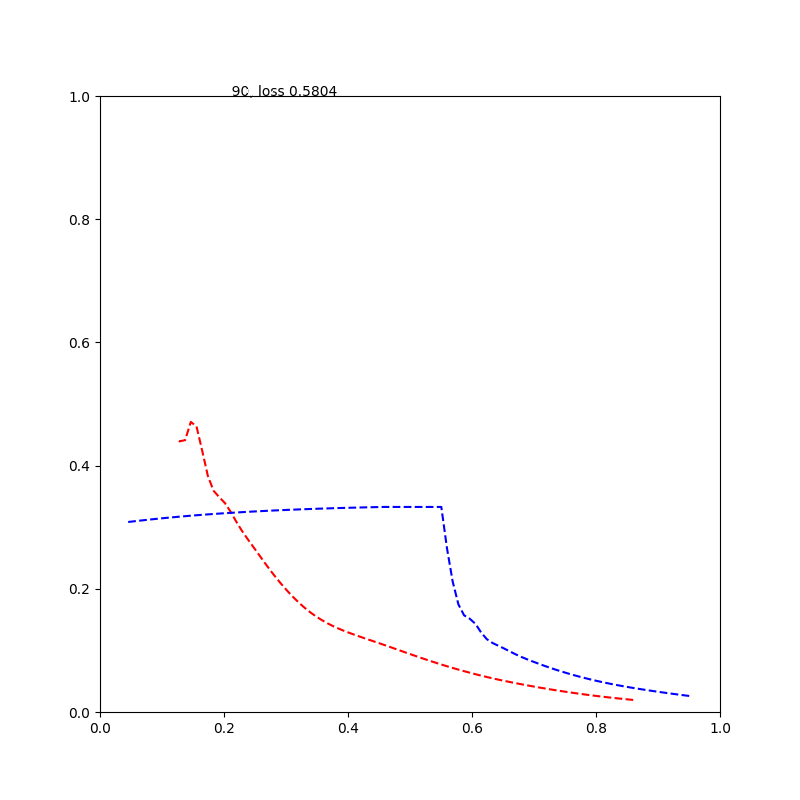

stop with loss: 0.48563018441200256
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


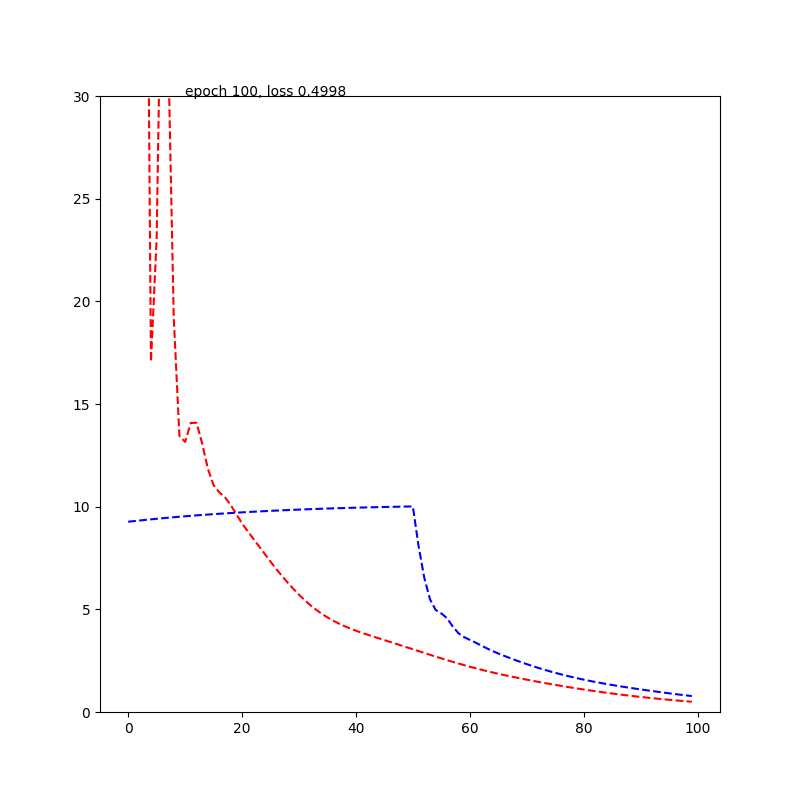

stop with loss: 0.4998299181461334
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


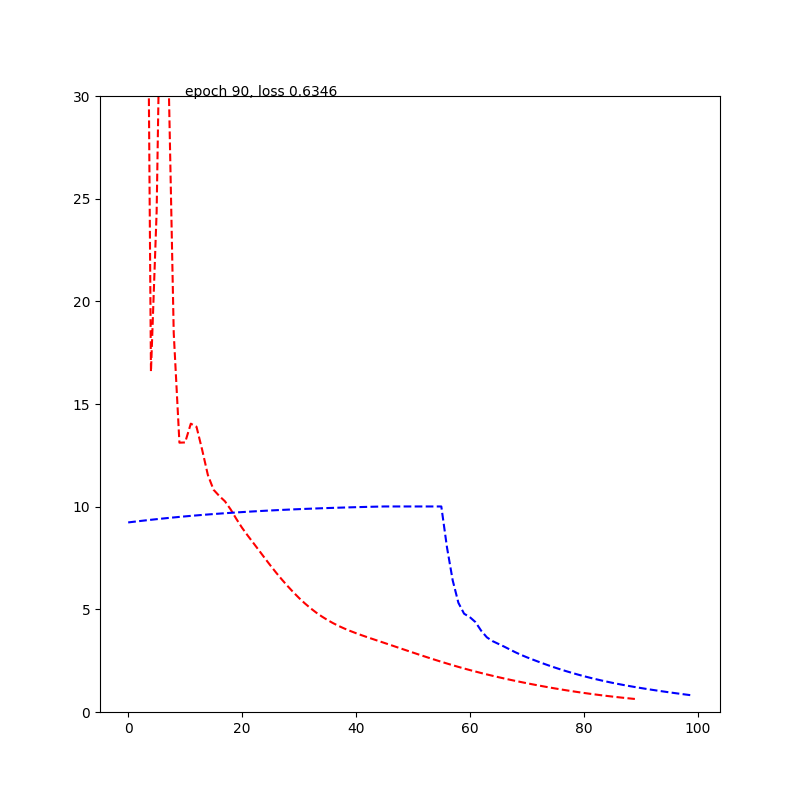

stop with loss: 0.49188652634620667
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


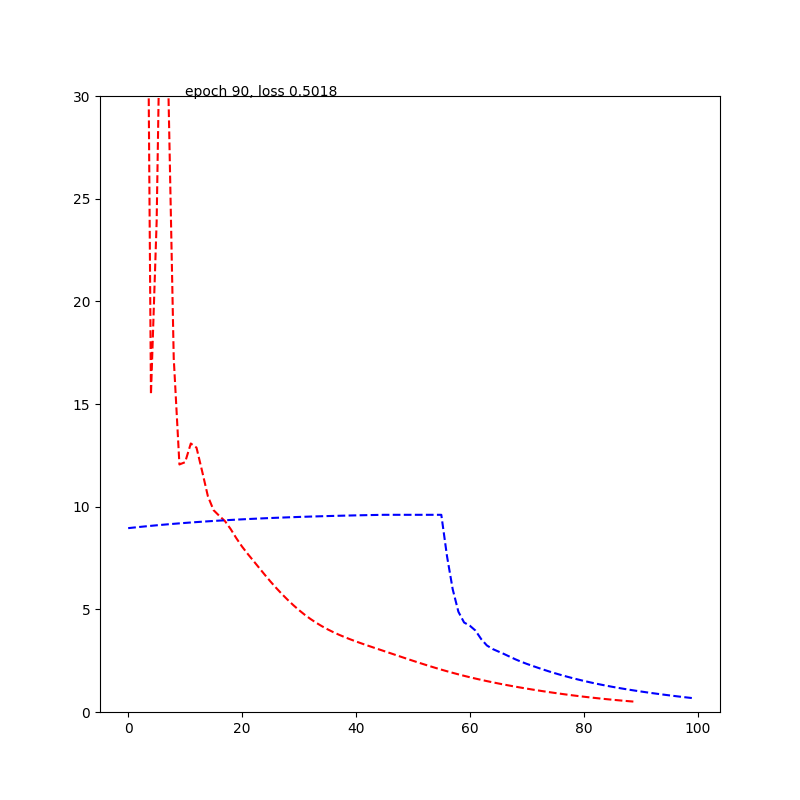

stop with loss: 0.48021844029426575
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


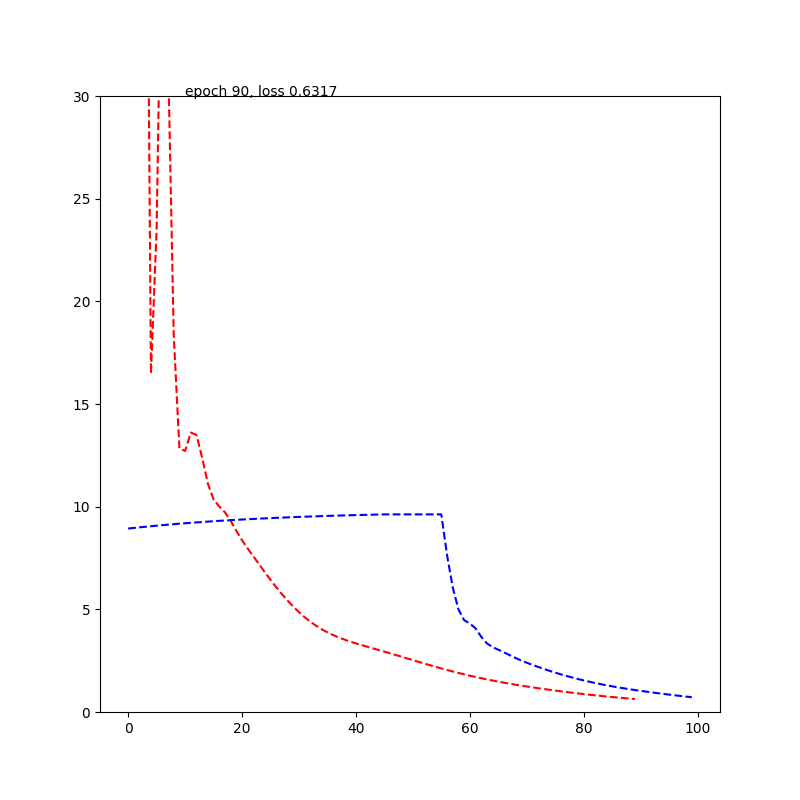

stop with loss: 0.4948253333568573
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=280, out_features=200, bias=True)
    (1): Linear(in_features=200, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=20, bias=True)
    (4): Linear(in_features=20, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


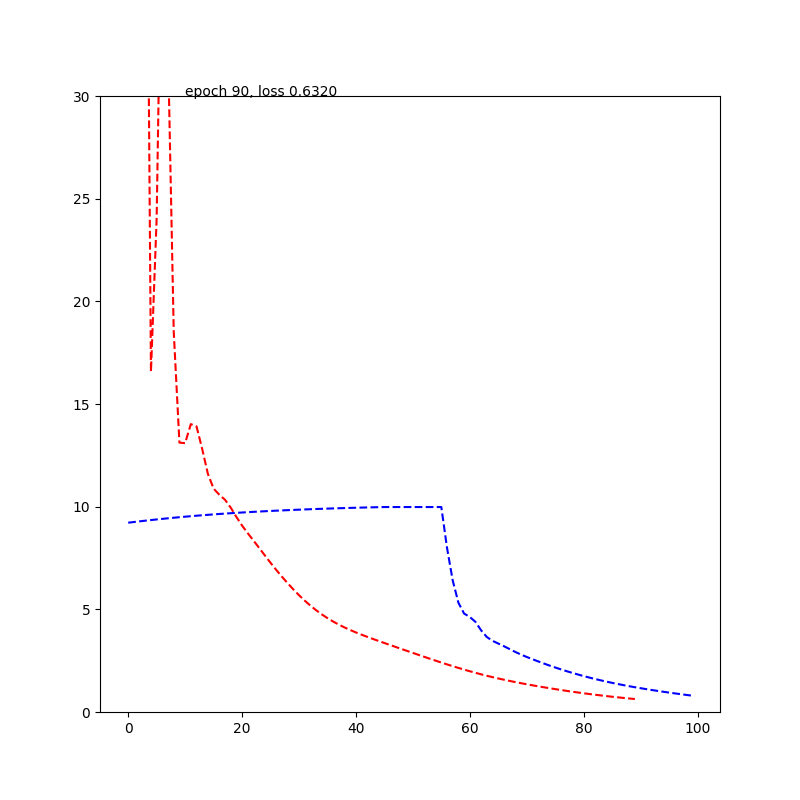

stop with loss: 0.4933122396469116
processing on: %s -------------------------- GMV&rsfMRI
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


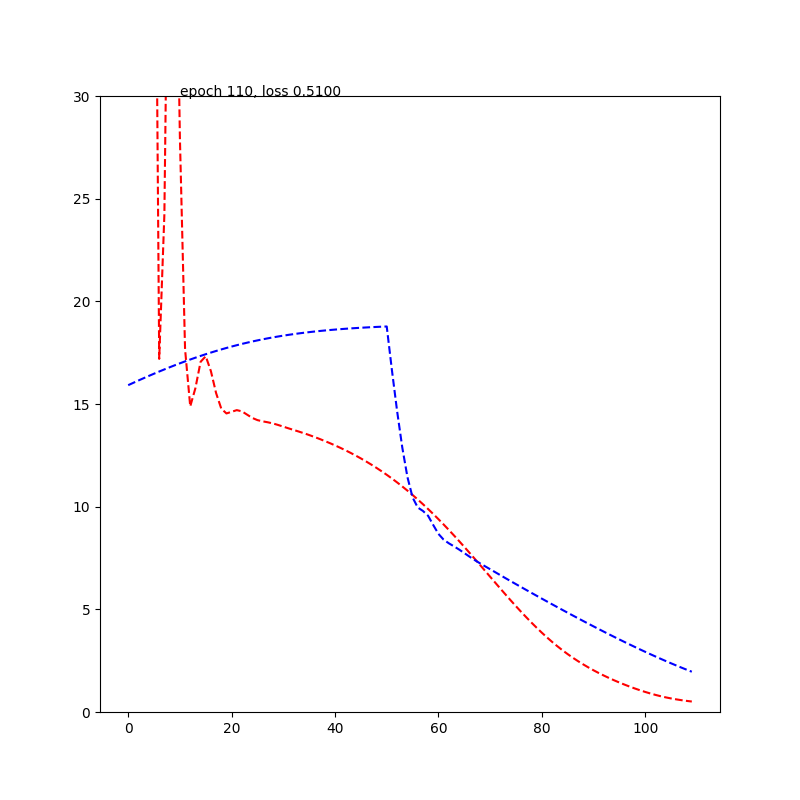

stop with loss: 0.4831711947917938
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


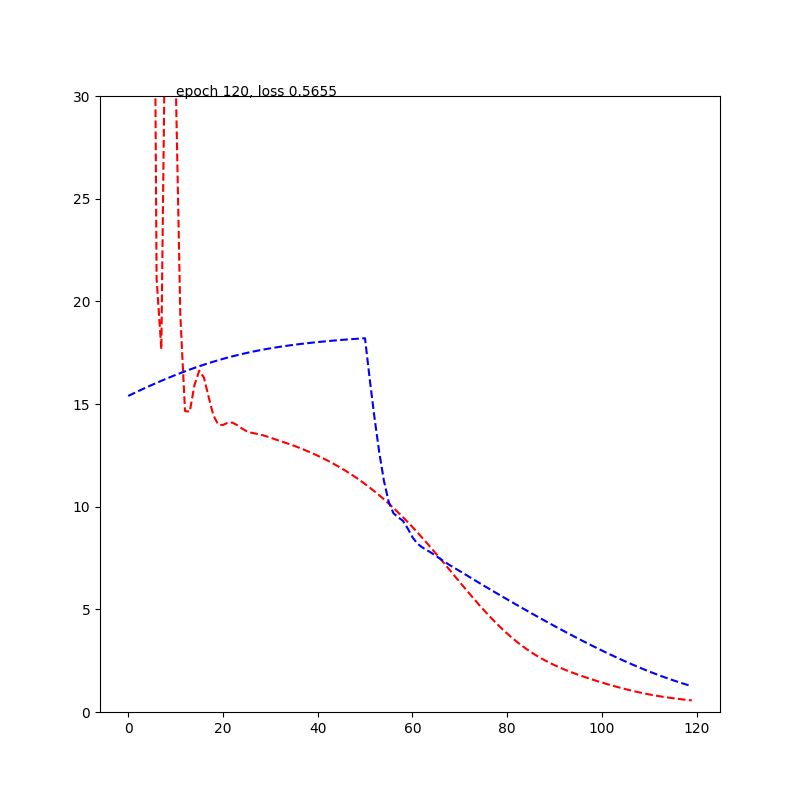

stop with loss: 0.4857860803604126
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


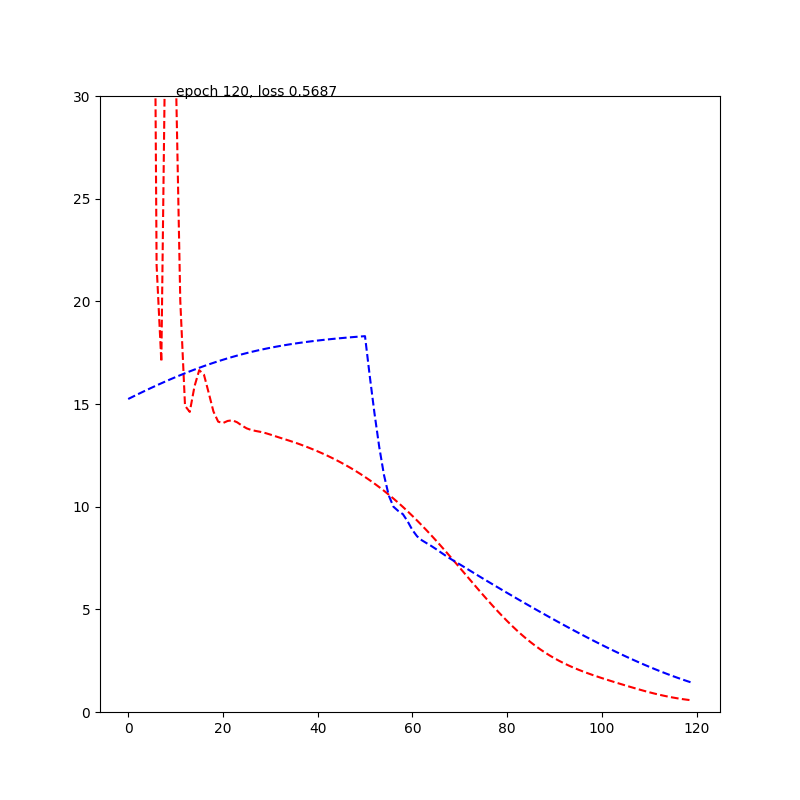

stop with loss: 0.4841139018535614
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


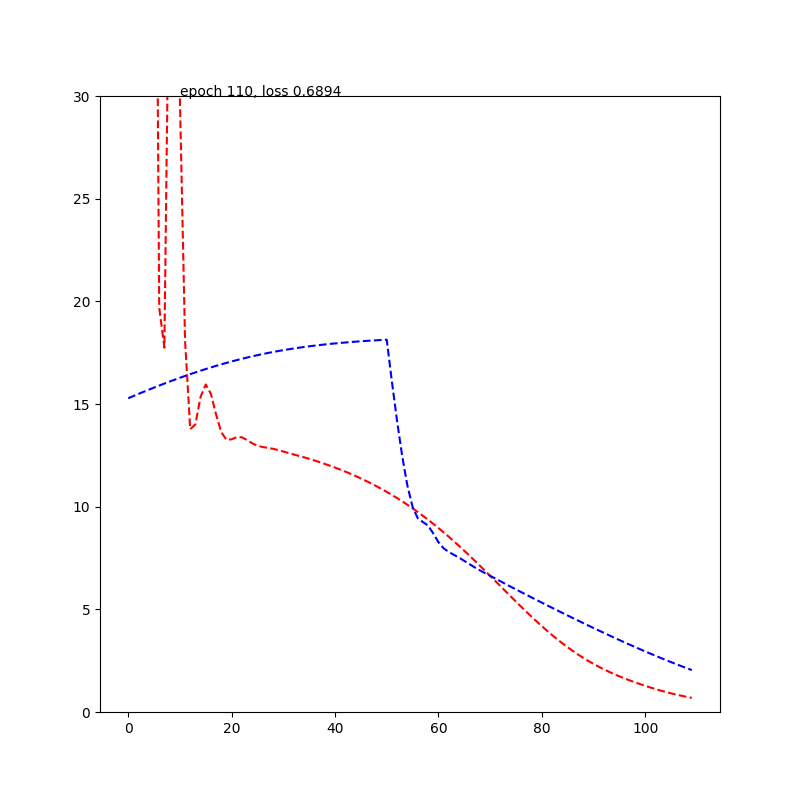

stop with loss: 0.4800284206867218
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


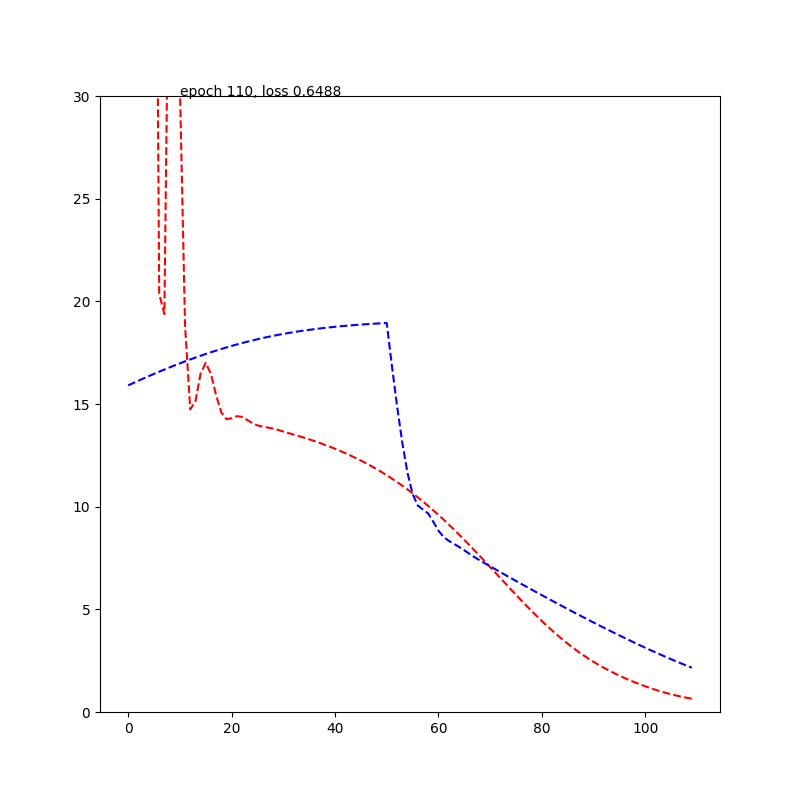

stop with loss: 0.48774126172065735
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


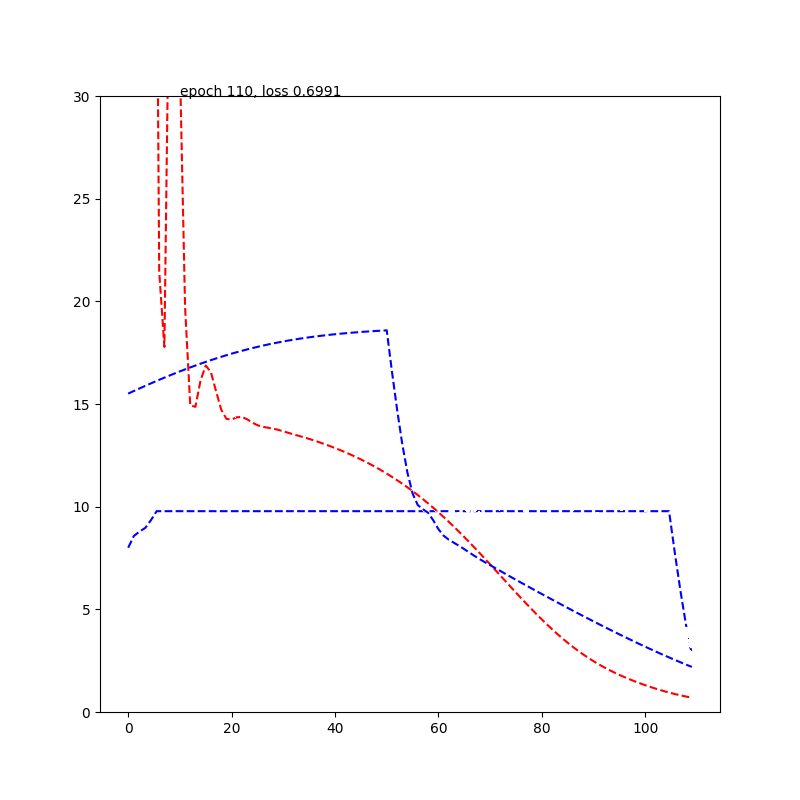

stop with loss: 0.4791167080402374
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


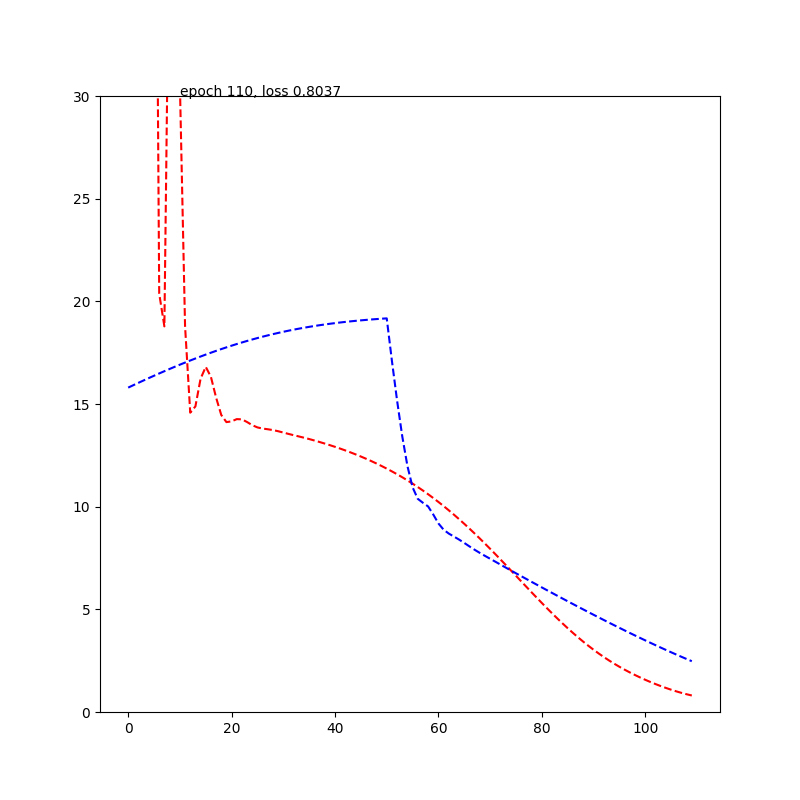

stop with loss: 0.49122530221939087
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


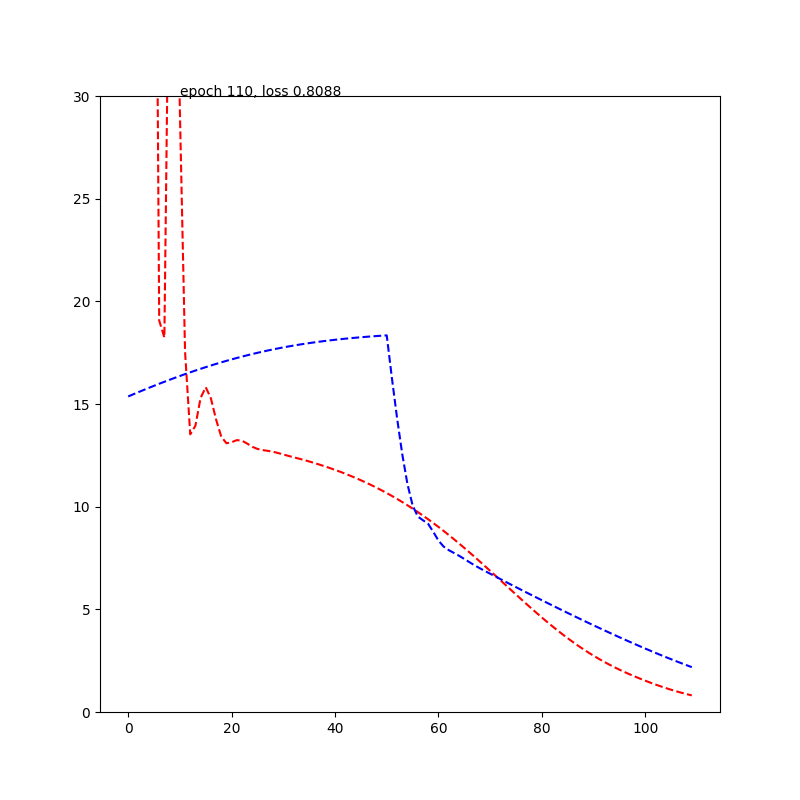

stop with loss: 0.48282939195632935
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


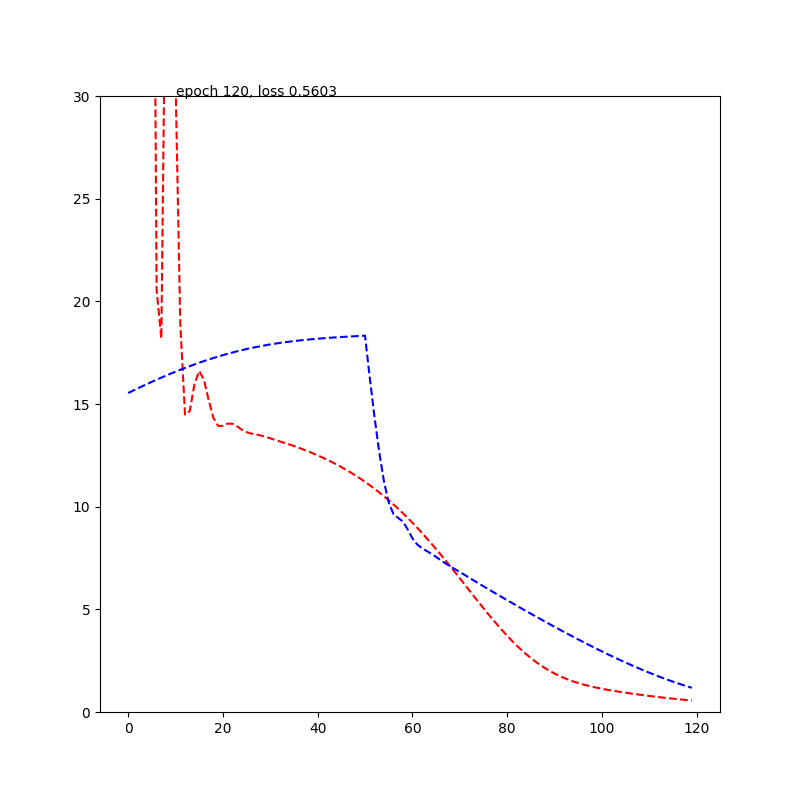

stop with loss: 0.48914870619773865
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


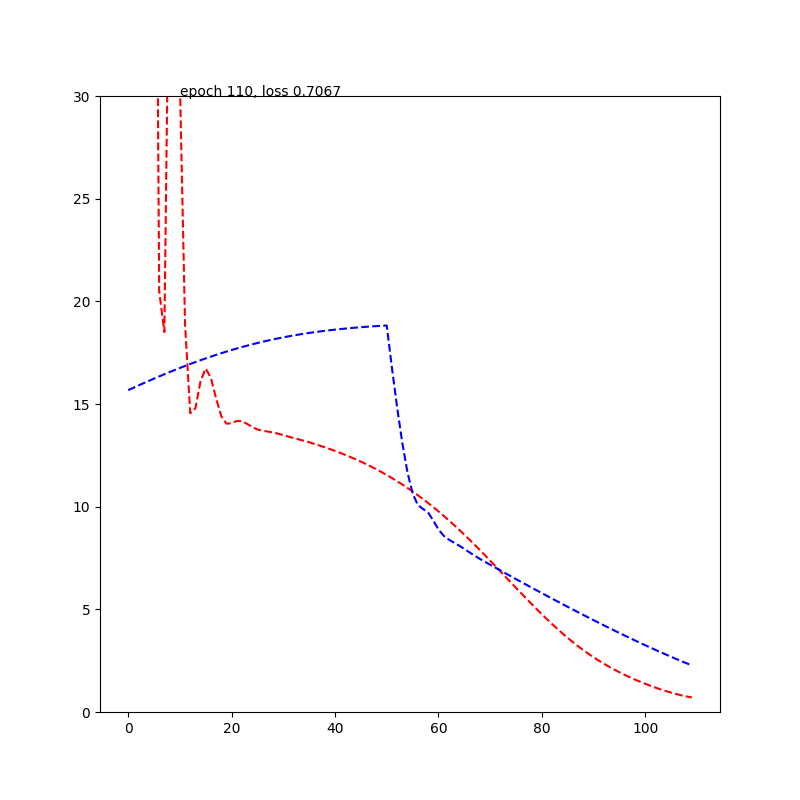

stop with loss: 0.49931007623672485
processing on: %s -------------------------- DTI&rsfMRI
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


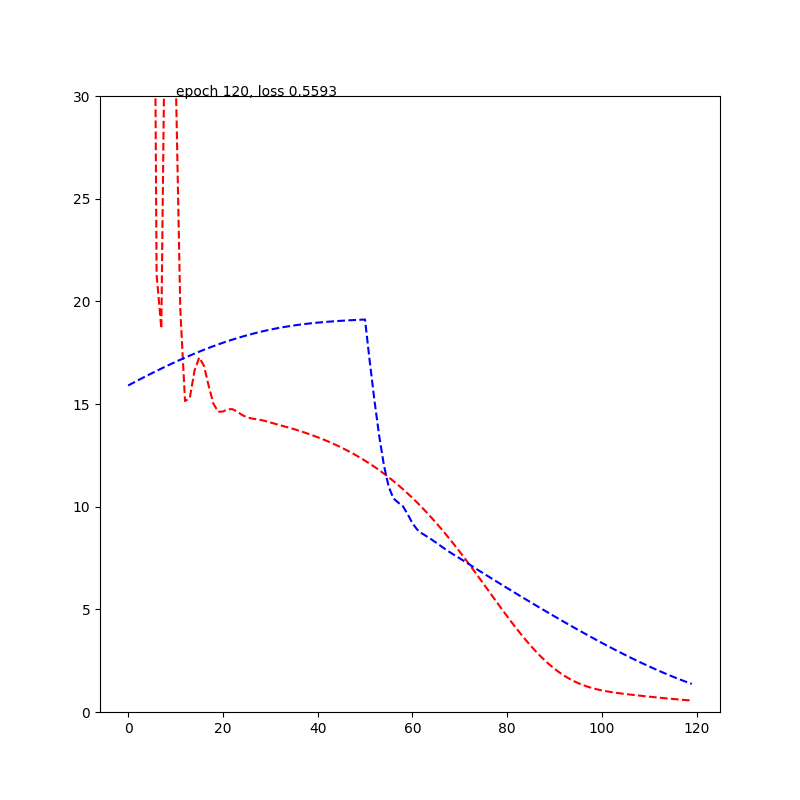

stop with loss: 0.49085596203804016
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


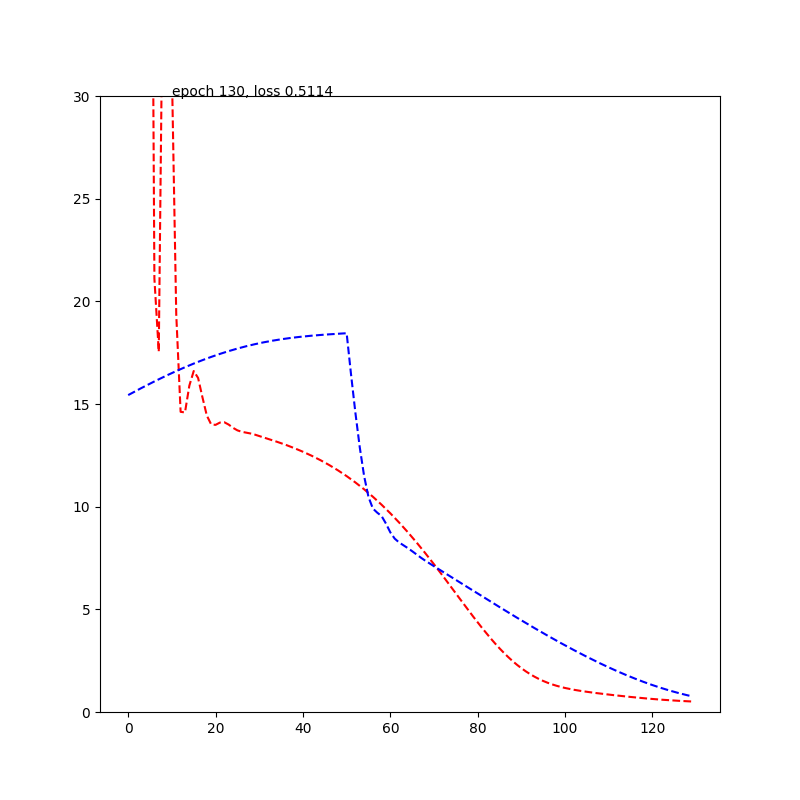

stop with loss: 0.4917027950286865
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


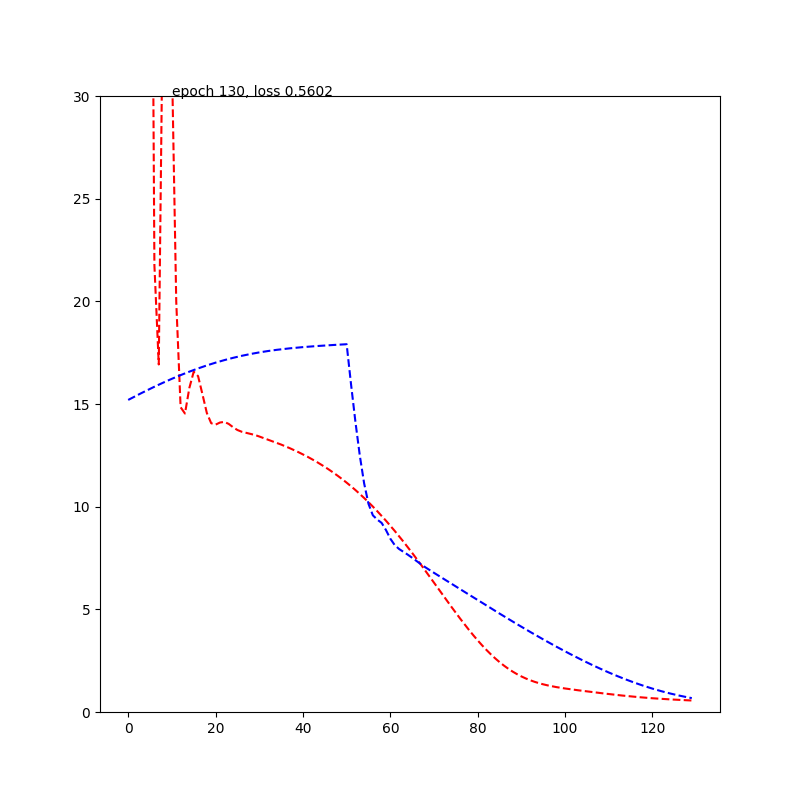

stop with loss: 0.49405577778816223
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


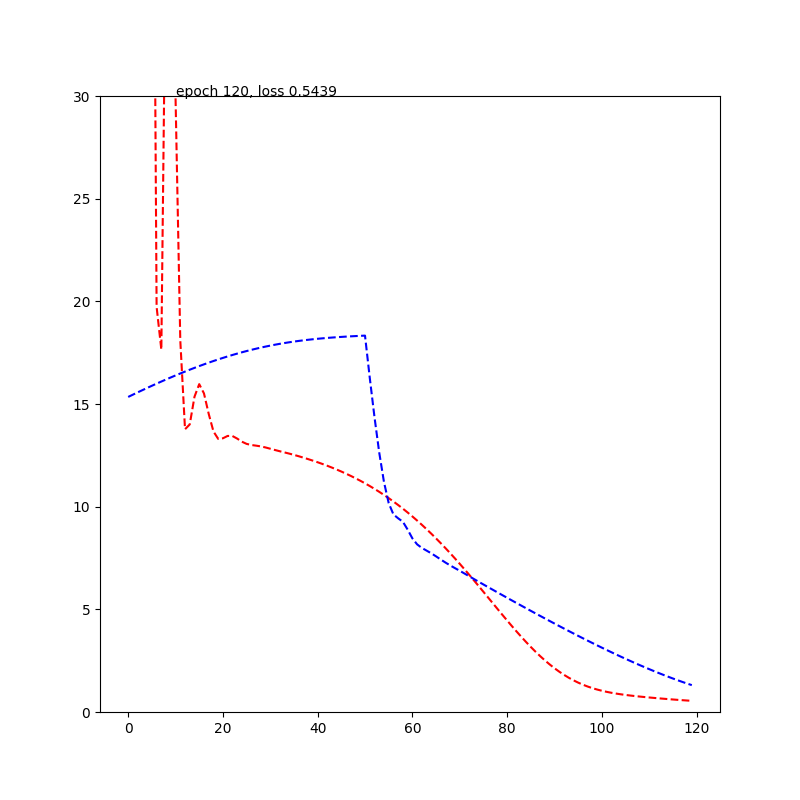

stop with loss: 0.4915469288825989
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


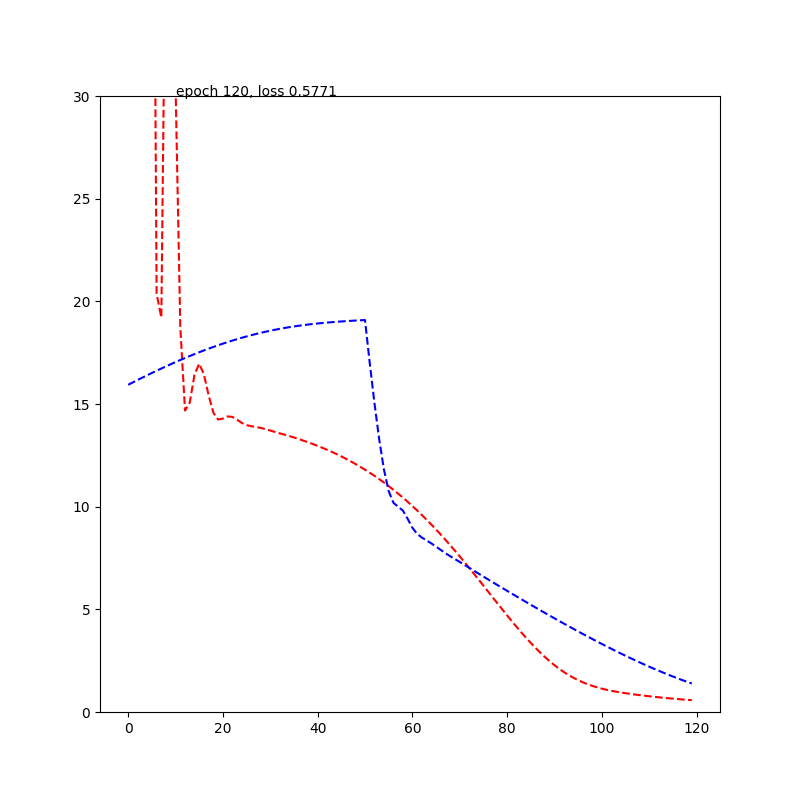

stop with loss: 0.4931299090385437
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


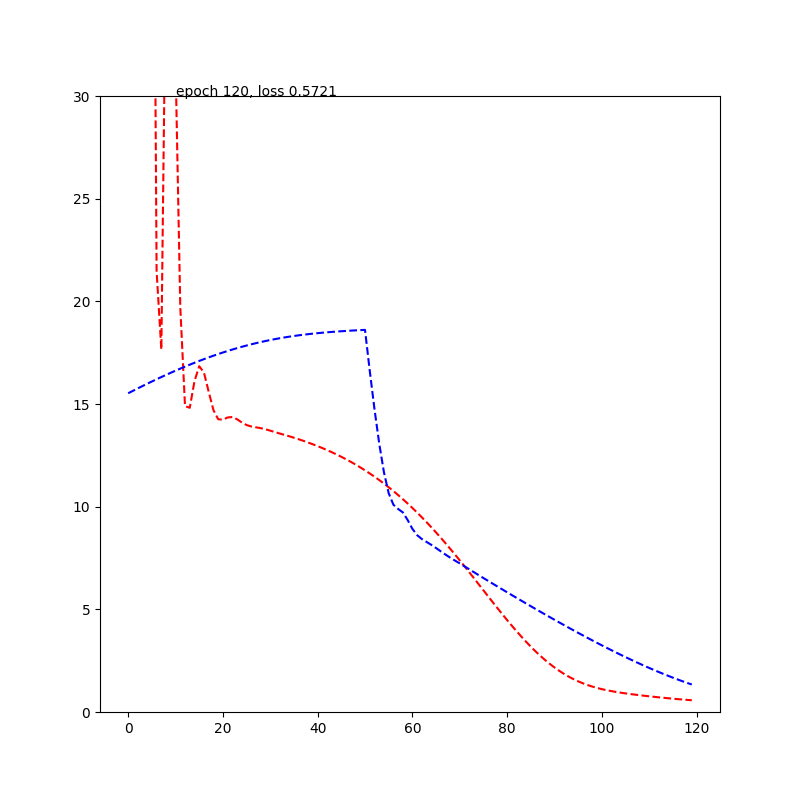

stop with loss: 0.4970889091491699
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


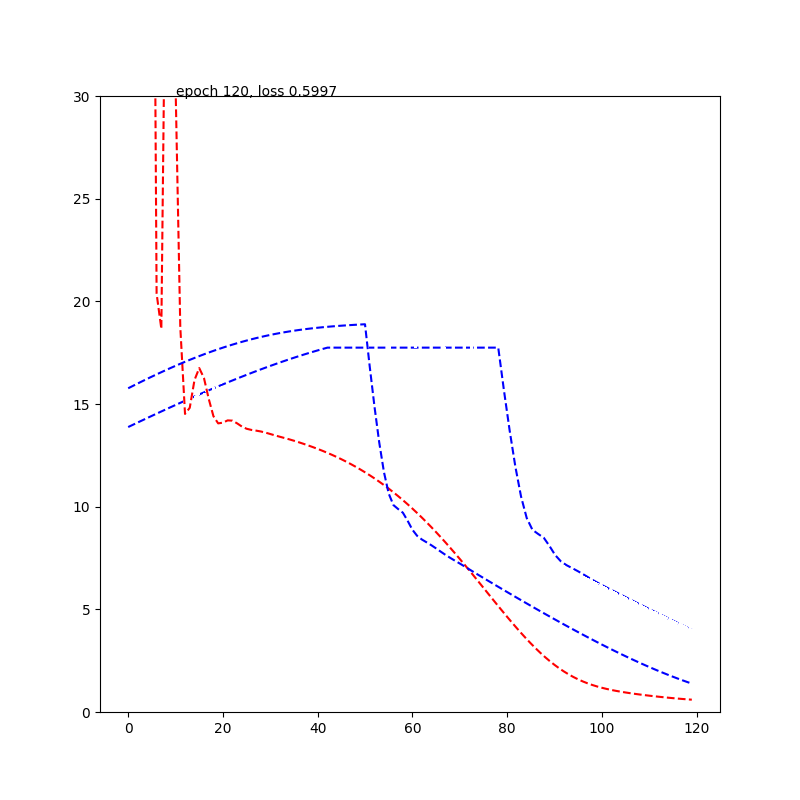

stop with loss: 0.49936002492904663
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


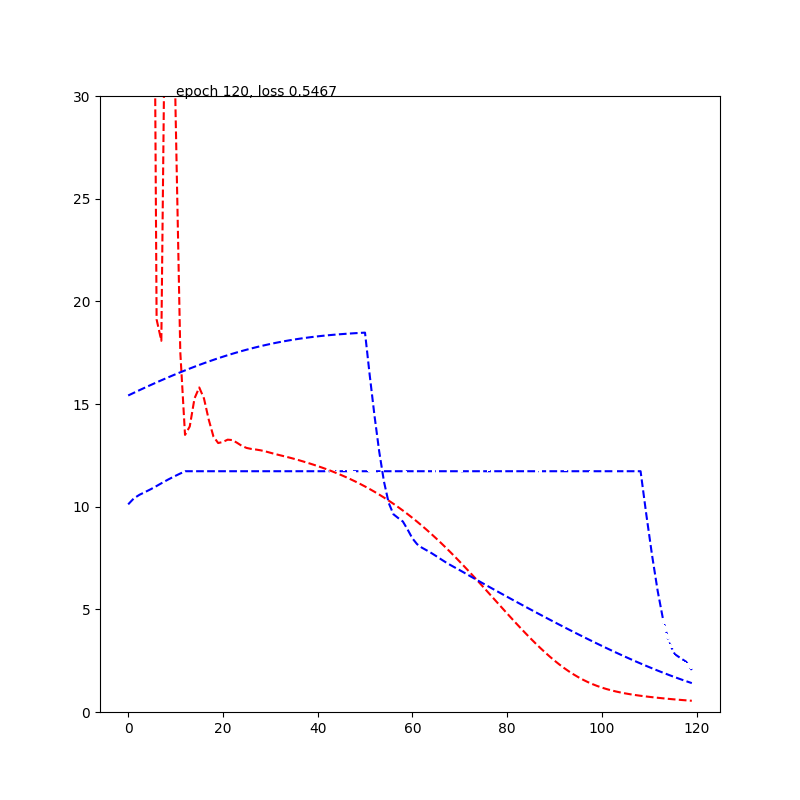

stop with loss: 0.48933738470077515
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


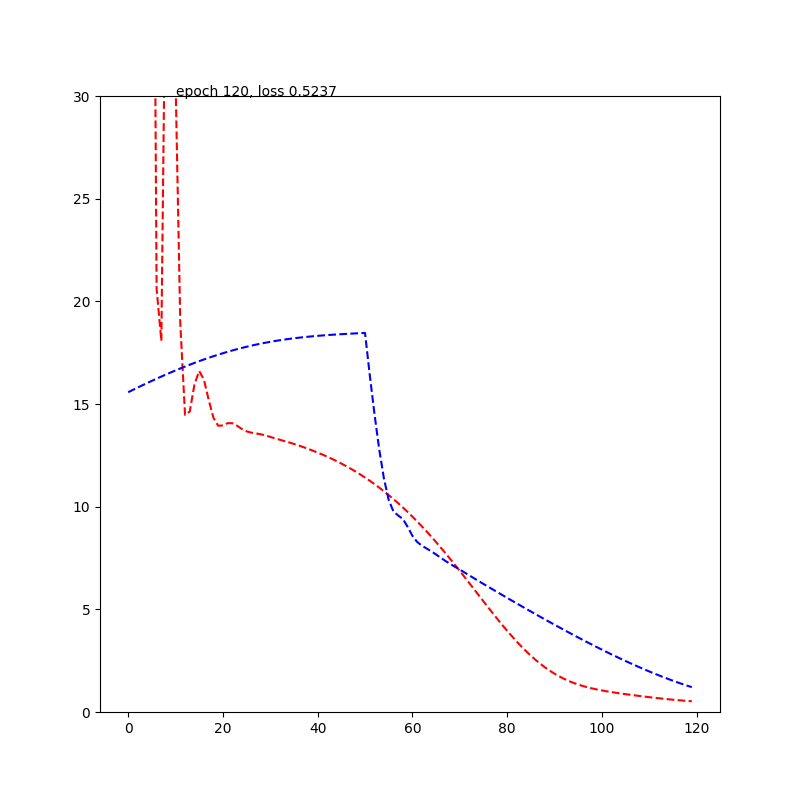

stop with loss: 0.4940865635871887
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=632, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


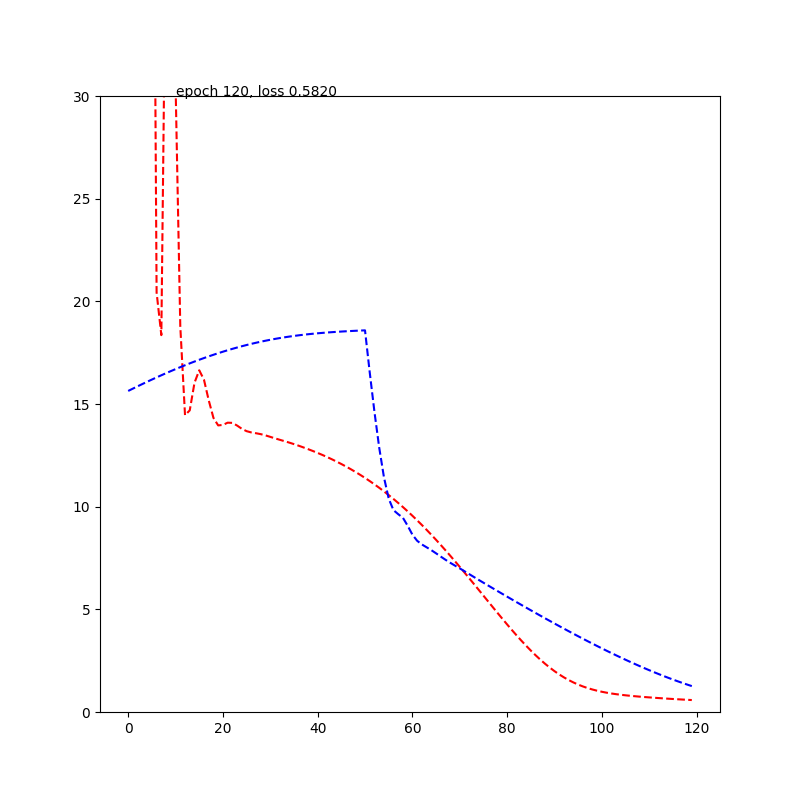

stop with loss: 0.49171680212020874
processing on: %s -------------------------- Multi-modal
run_model on CV: 1
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


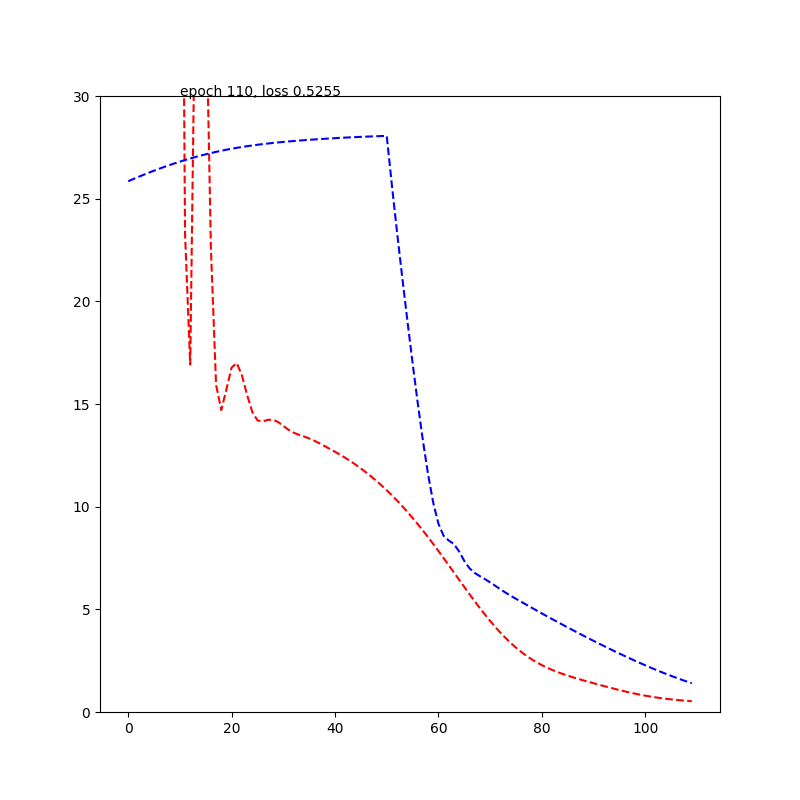

stop with loss: 0.49141547083854675
run_model on CV: 2
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


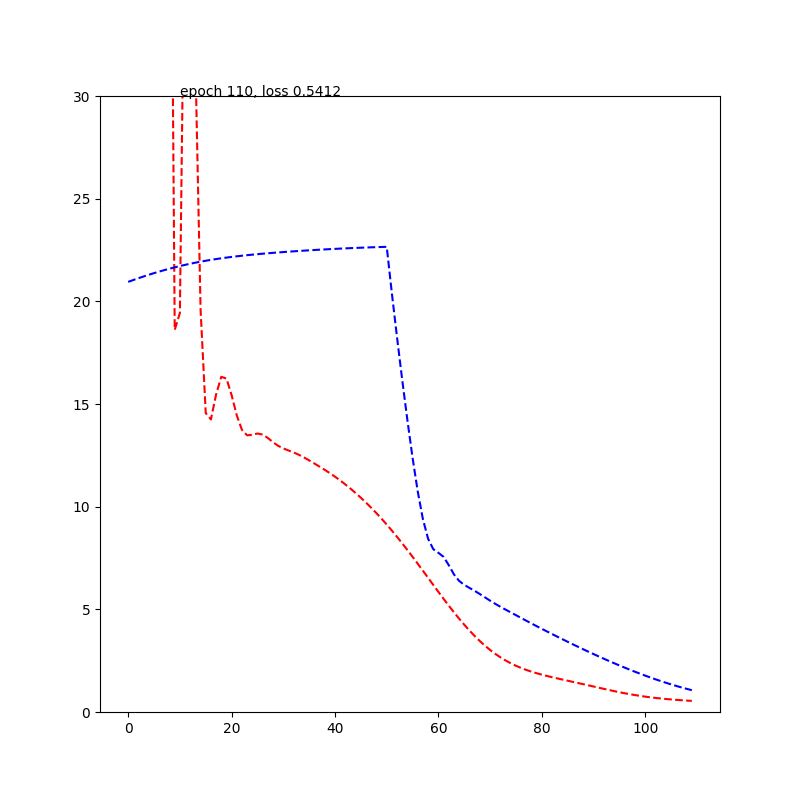

stop with loss: 0.4905332326889038
run_model on CV: 3
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


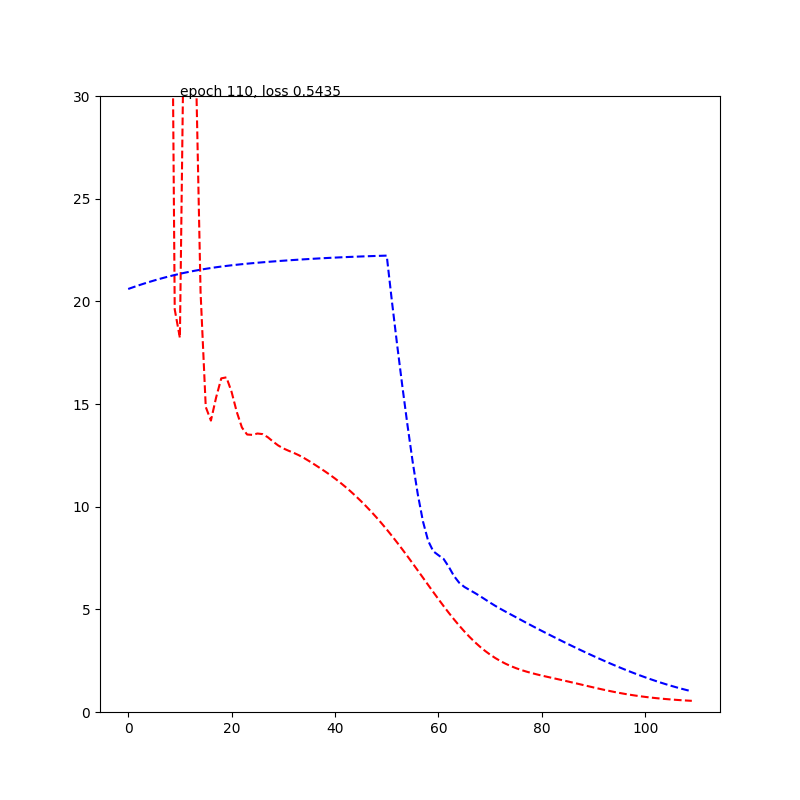

stop with loss: 0.4957028031349182
run_model on CV: 4
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


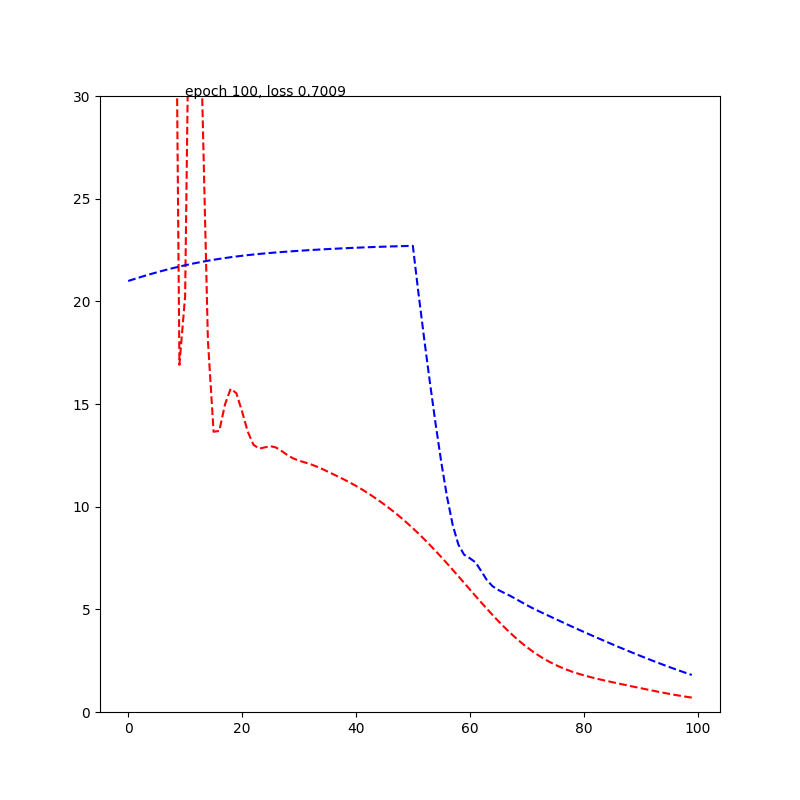

stop with loss: 0.49672117829322815
run_model on CV: 5
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


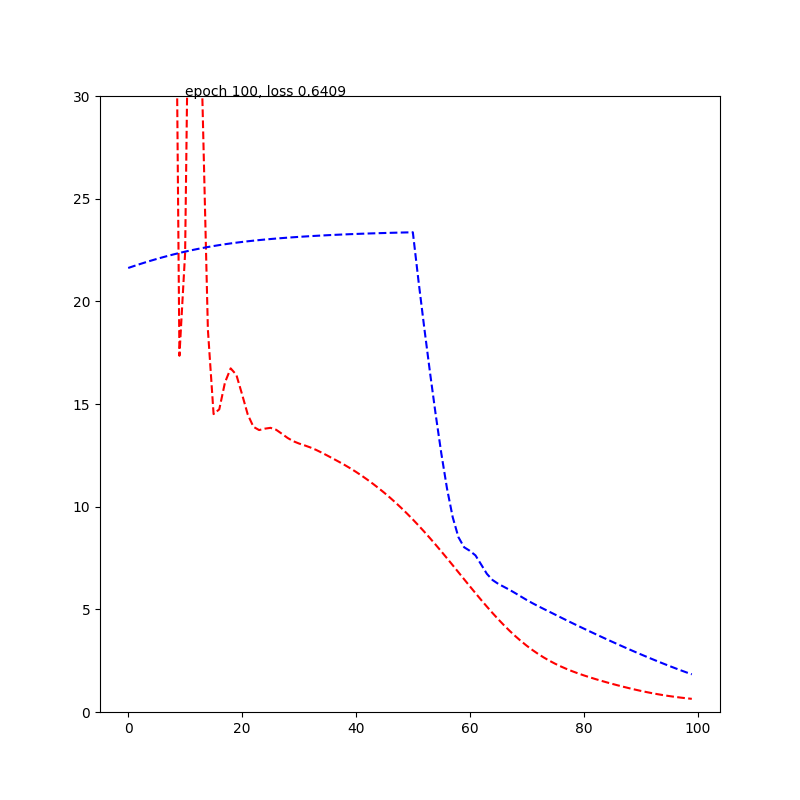

stop with loss: 0.48787495493888855
run_model on CV: 6
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


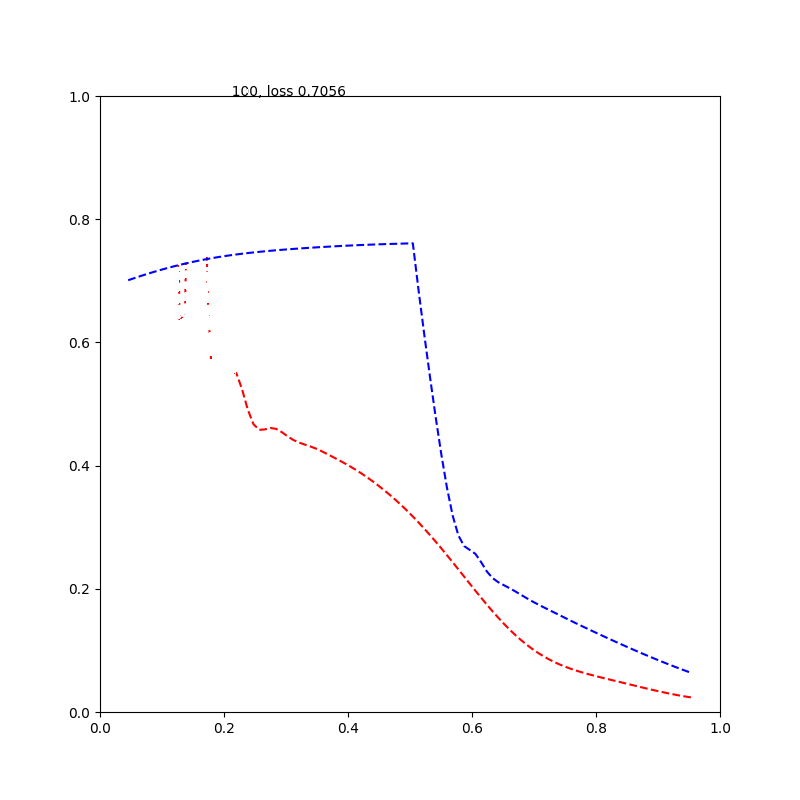

stop with loss: 0.4910808503627777
run_model on CV: 7
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


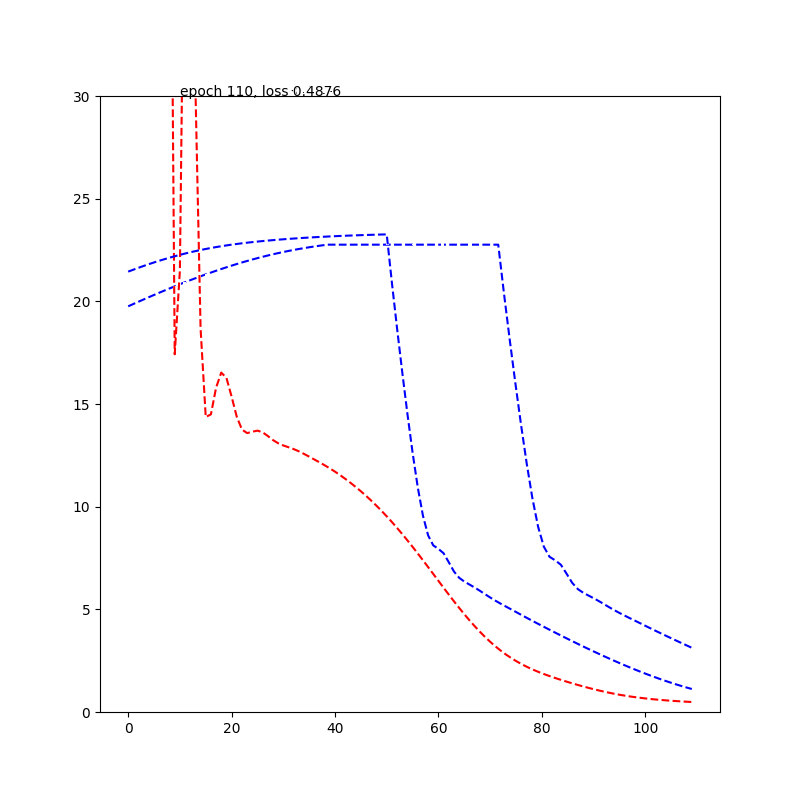

stop with loss: 0.4876462519168854
run_model on CV: 8
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


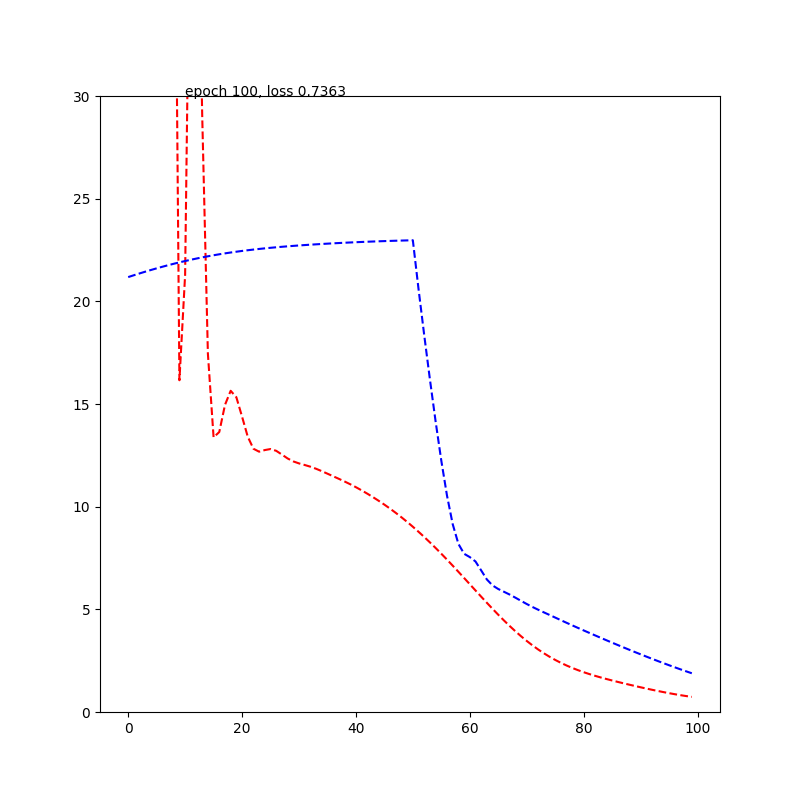

stop with loss: 0.49406710267066956
run_model on CV: 9
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


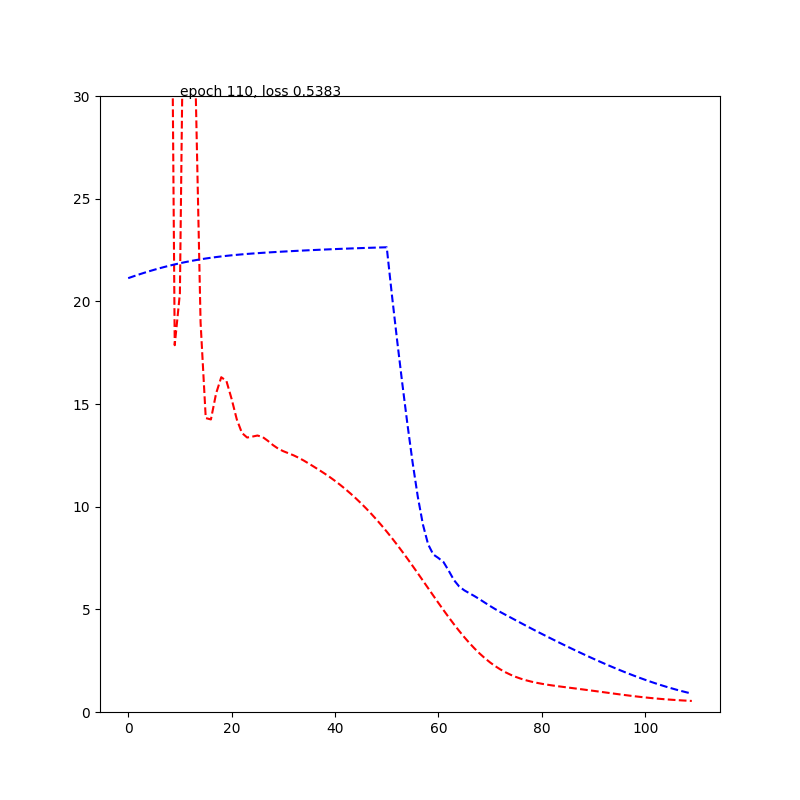

stop with loss: 0.49471065402030945
run_model on CV: 10
build layer:
Model(
  (sigmoid): Sigmoid()
  (layers): Sequential(
    (0): Linear(in_features=772, out_features=400, bias=True)
    (1): Linear(in_features=400, out_features=150, bias=True)
    (2): Linear(in_features=150, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=30, bias=True)
    (4): Linear(in_features=30, out_features=5, bias=True)
    (5): Linear(in_features=5, out_features=1, bias=True)
  )
  (criterion): MSELoss()
)
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
initialize weight...
training with all training data:


<IPython.core.display.Javascript object>


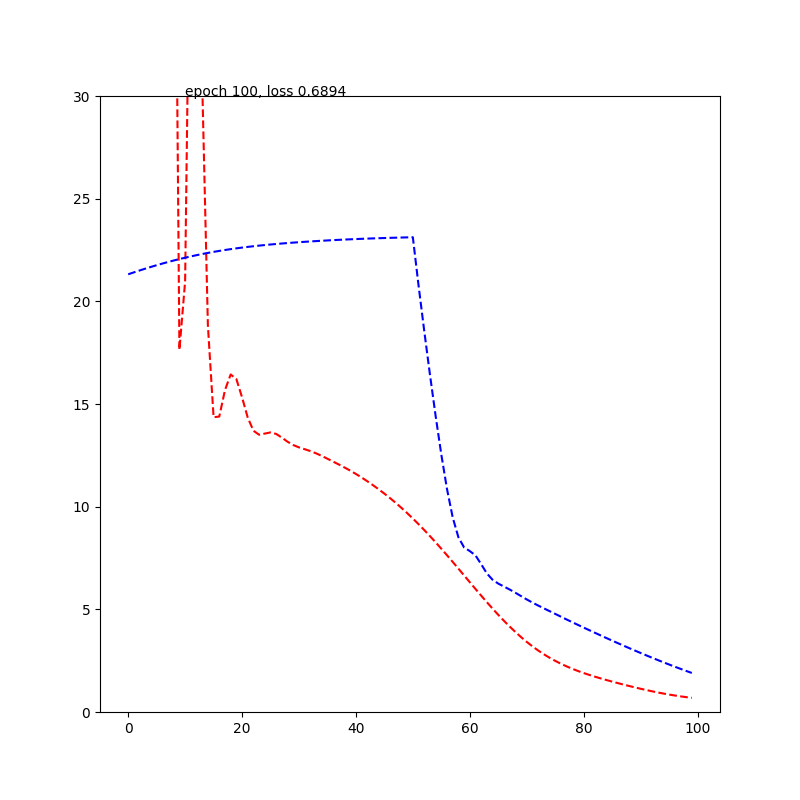

stop with loss: 0.4993508458137512


In [5]:

%matplotlib notebook
# brain_feature_list2 = [brain_feature_list[5]]
# run DNN with default parameter:
result_table_dnn, scatter_data_dnn = run_model(Model(), subject_info_hc, brain_feature_list, kf, fit_method = 0)


In [6]:
result_table_dnn.to_csv(result_dir + "result_table_dnn.csv", sep = ",")
scatter_data_dnn.to_csv(result_dir + "scatter_data_dnn.csv", sep = ",")

result_summary_dnn, result_plot_dnn = summary_result(result_table_dnn)
#print(plot_data)

summary_result:
            Pearson r            R square                 MAE            \
                 mean       std      mean       std      mean       std   
GMV          0.759097  0.187116  0.607739  0.257899  1.781092  0.704057   
ReHo         0.622198  0.211619  0.427434  0.263046  2.674296  0.642972   
ALFF         0.623037  0.278744  0.458103  0.284107  2.493221  0.846122   
FA           0.635215  0.215336  0.445231  0.290262  2.590520  1.194253   
MD           0.663093  0.343113  0.545646  0.300489  2.364783  0.851363   
GMV&DTI      0.752715  0.356313  0.680843  0.273273  1.722255  0.776887   
GMV&rsfMRI   0.753846  0.235128  0.618040  0.285625  2.156051  0.898346   
DTI&rsfMRI   0.801580  0.181616  0.672216  0.230077  1.974635  0.810754   
Multi-modal  0.844058  0.173012  0.739374  0.239406  1.694896  0.748645   

                 rmse            
                 mean       std  
GMV          2.212872  0.712813  
ReHo         3.063854  0.782271  
ALFF         3.039113 

<Figure size 1080x1080 with 0 Axes>

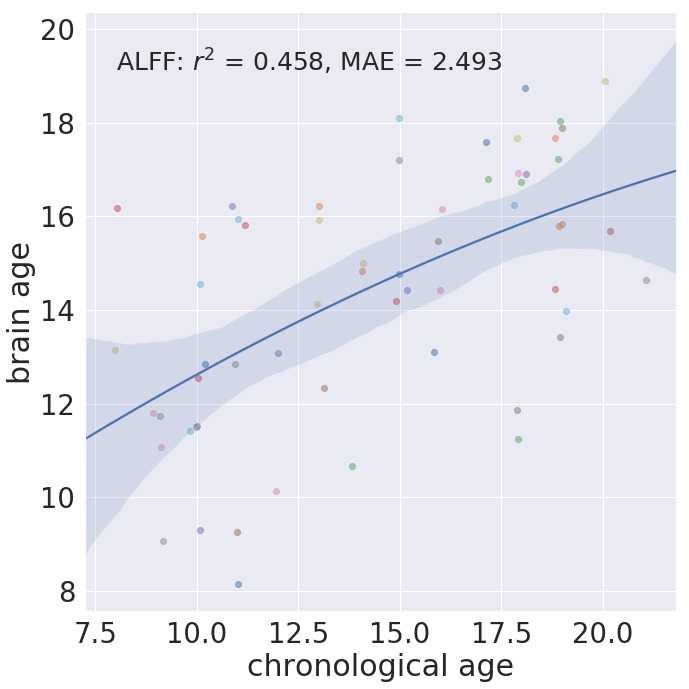

<Figure size 1080x1080 with 0 Axes>

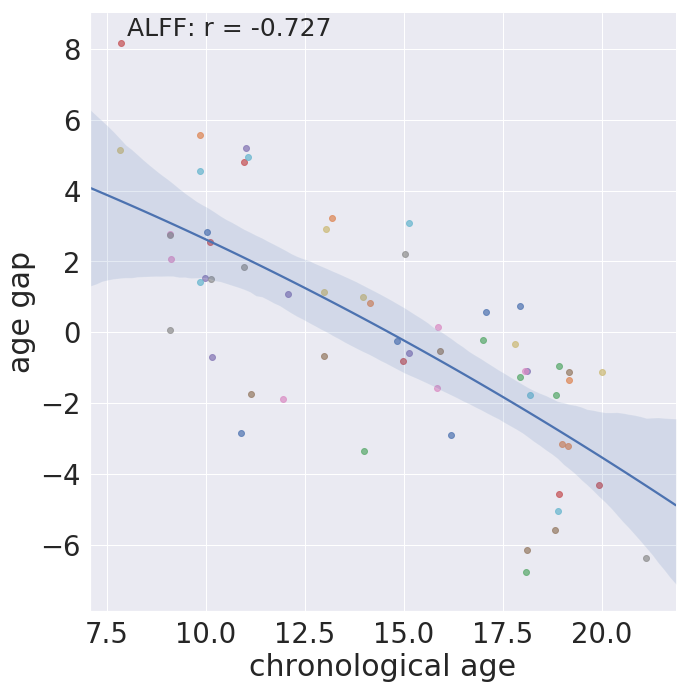

<Figure size 1080x1080 with 0 Axes>

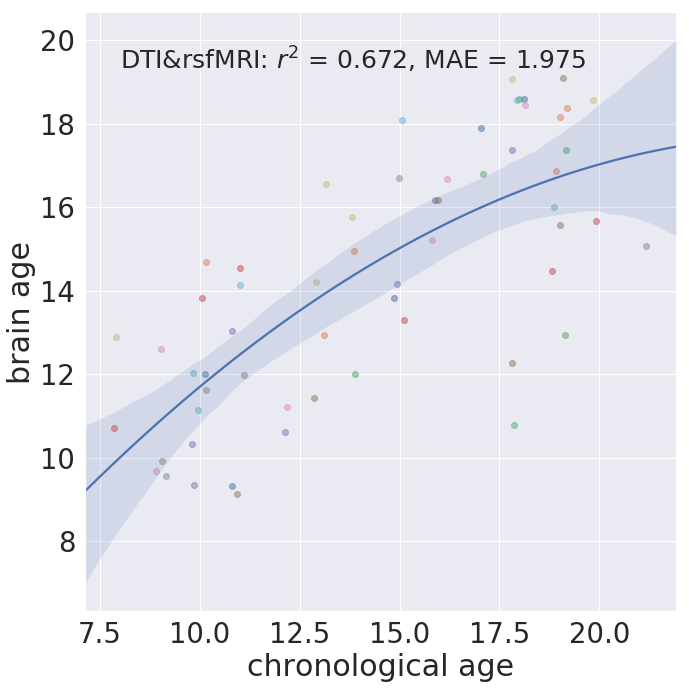

<Figure size 1080x1080 with 0 Axes>

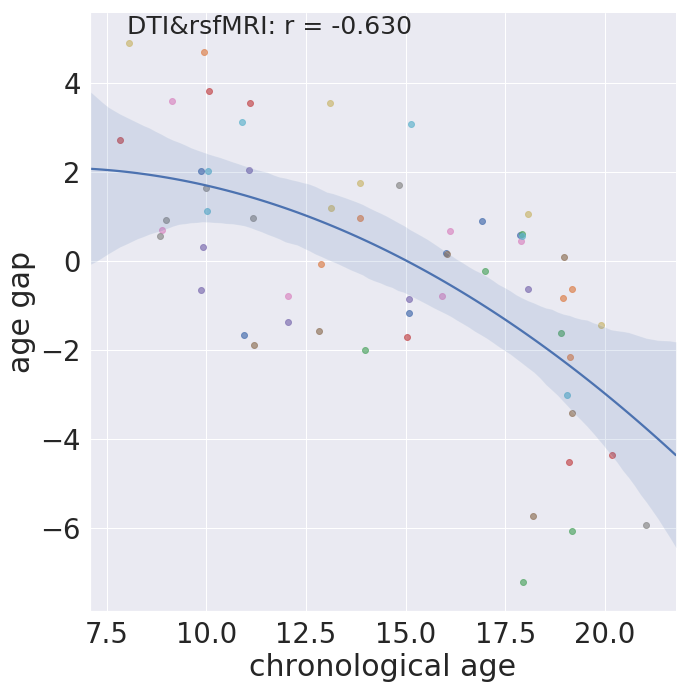

<Figure size 1080x1080 with 0 Axes>

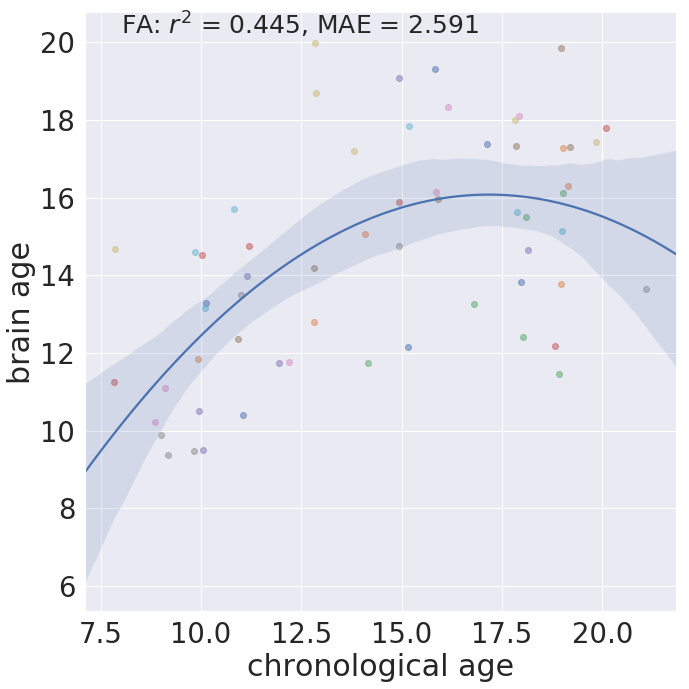

<Figure size 1080x1080 with 0 Axes>

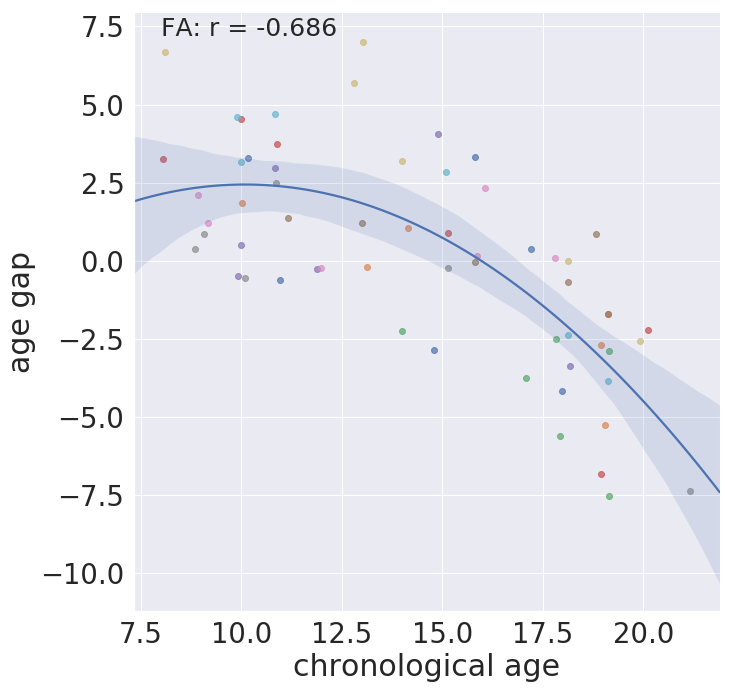

<Figure size 1080x1080 with 0 Axes>

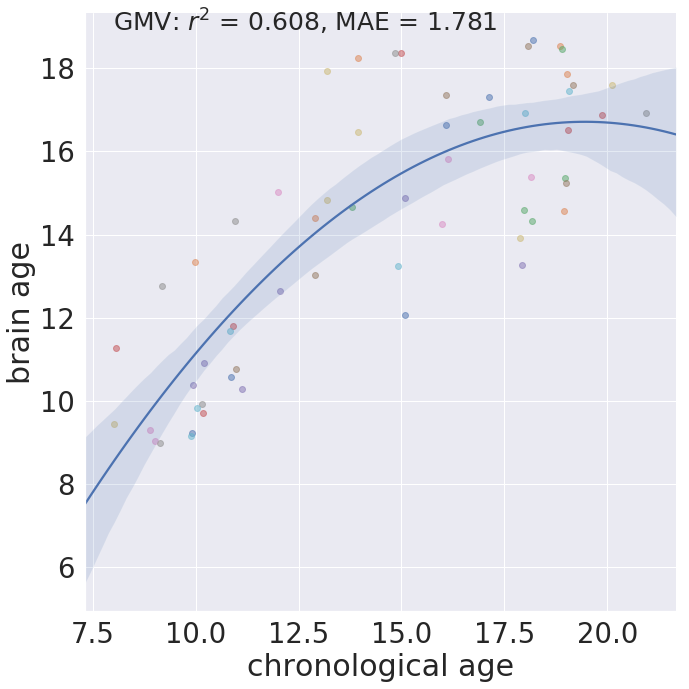

<Figure size 1080x1080 with 0 Axes>

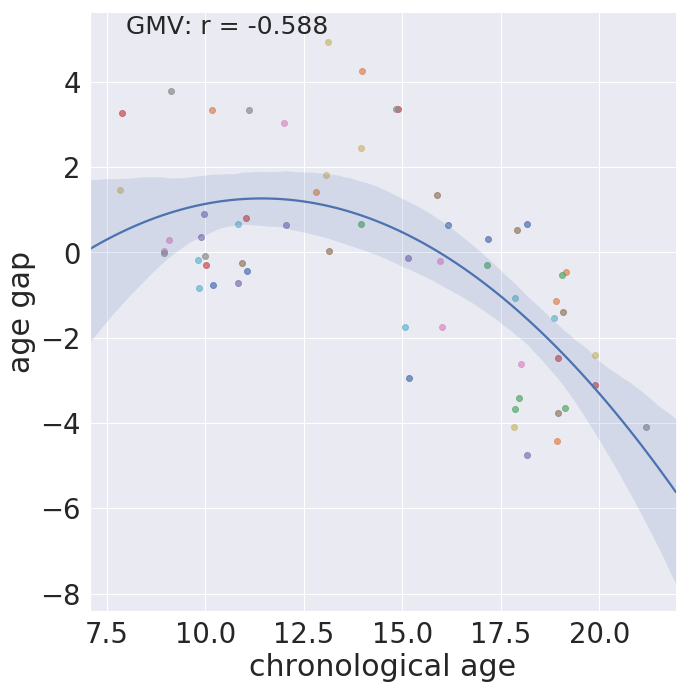

<Figure size 1080x1080 with 0 Axes>

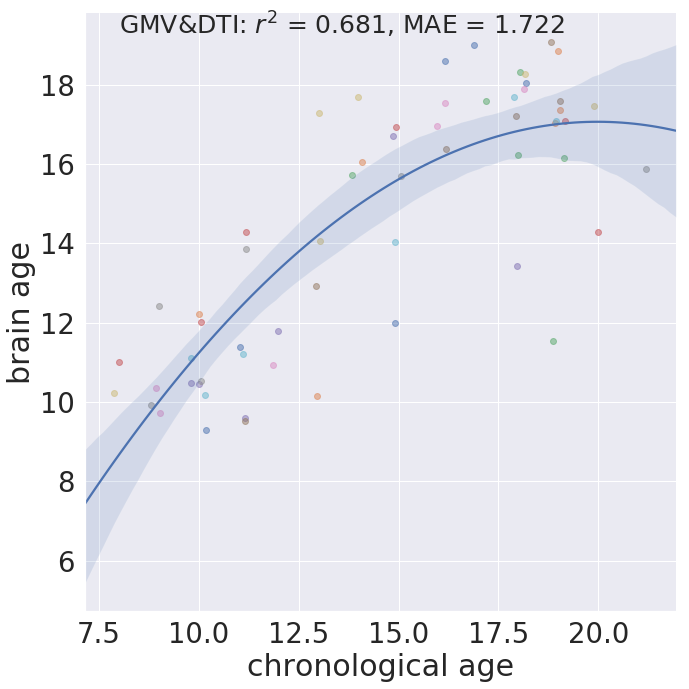

<Figure size 1080x1080 with 0 Axes>

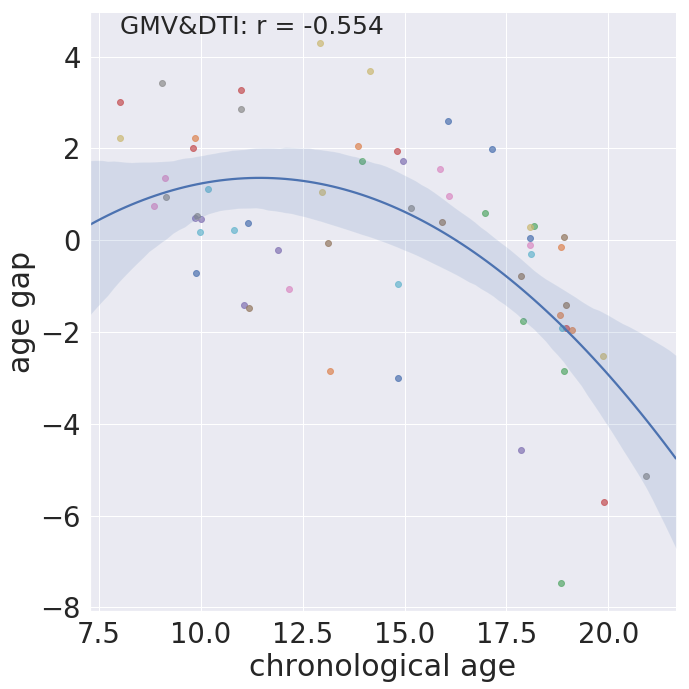

<Figure size 1080x1080 with 0 Axes>

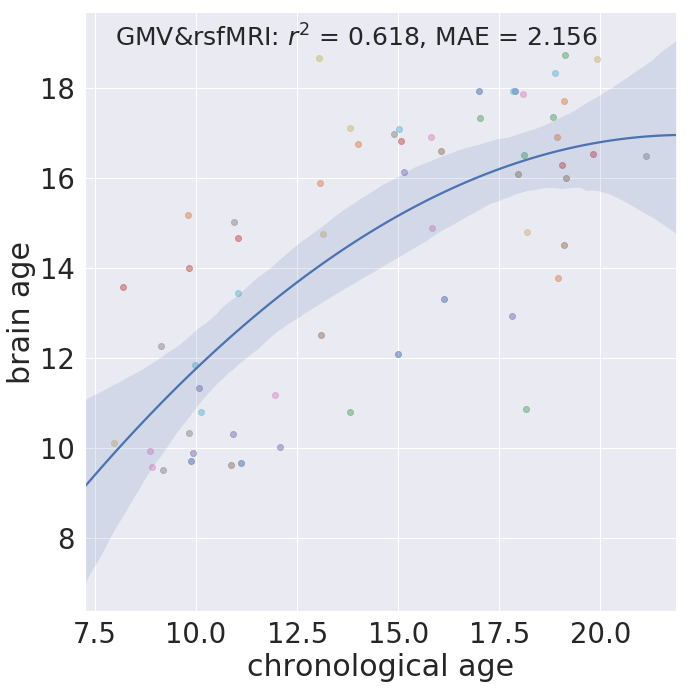

<Figure size 1080x1080 with 0 Axes>

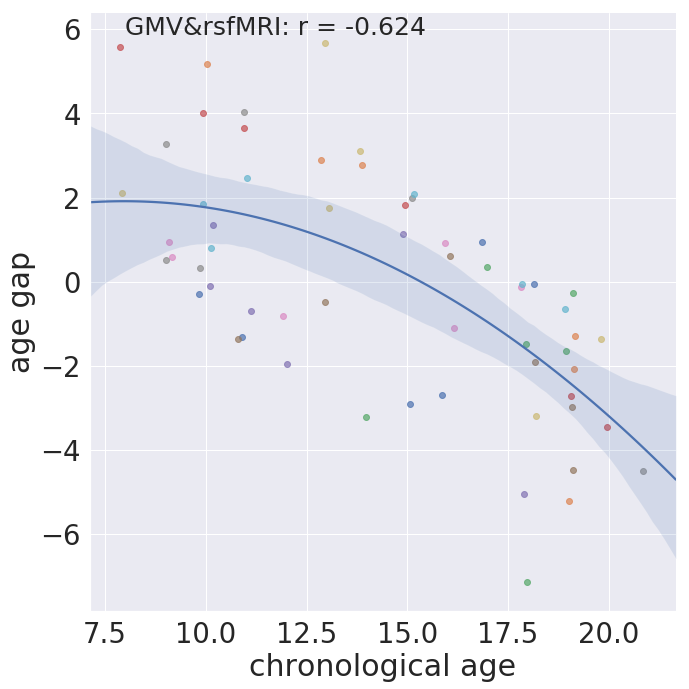

<Figure size 1080x1080 with 0 Axes>

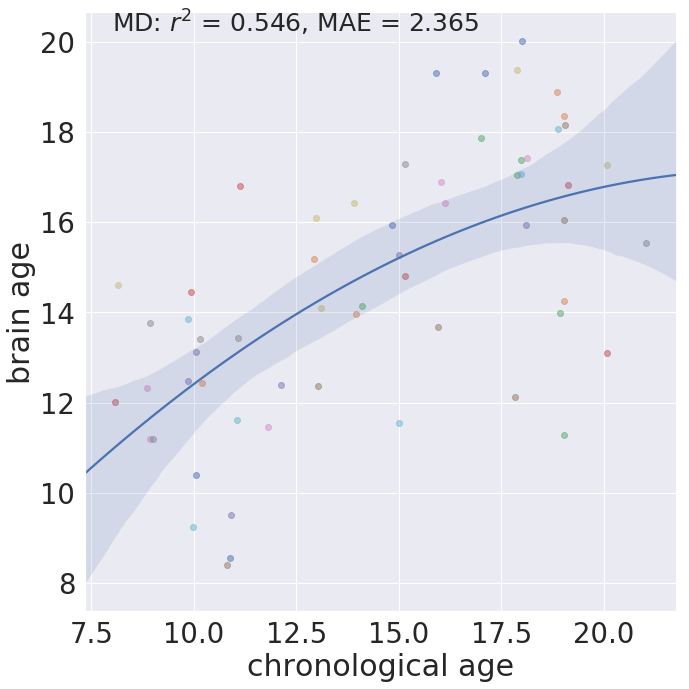

<Figure size 1080x1080 with 0 Axes>

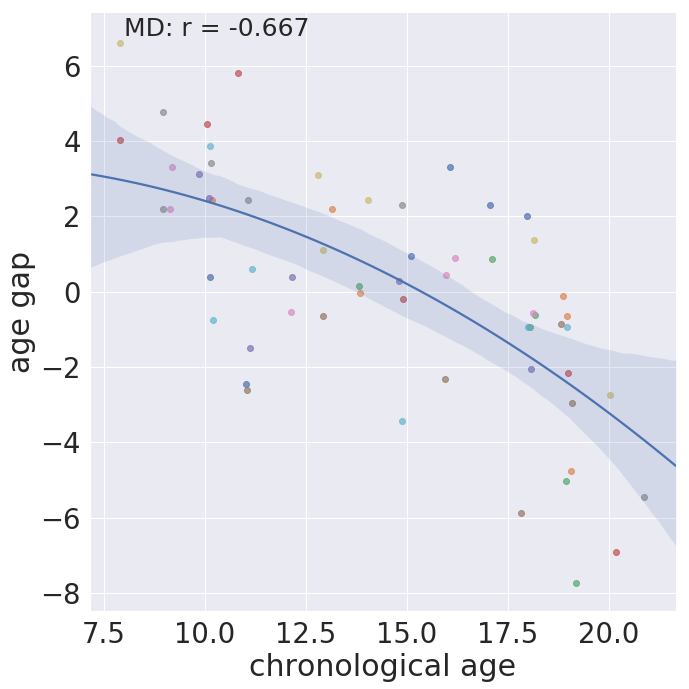

<Figure size 1080x1080 with 0 Axes>

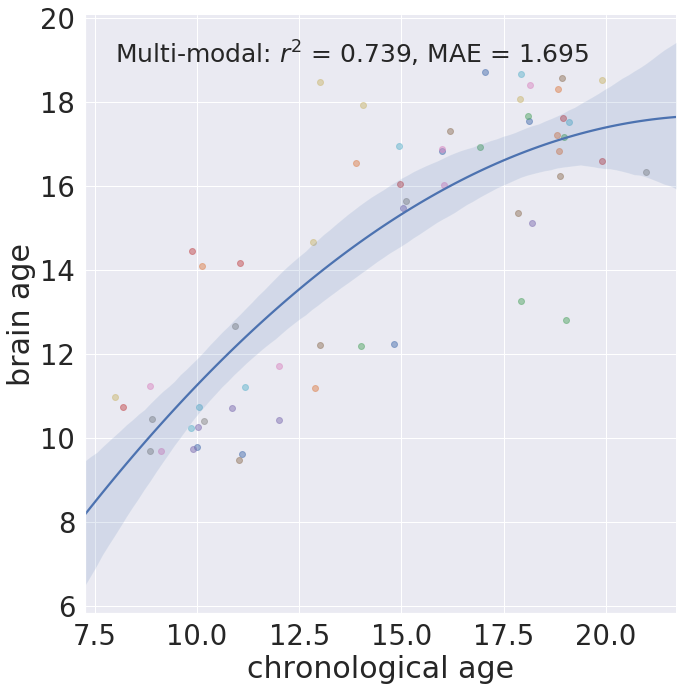

<Figure size 1080x1080 with 0 Axes>

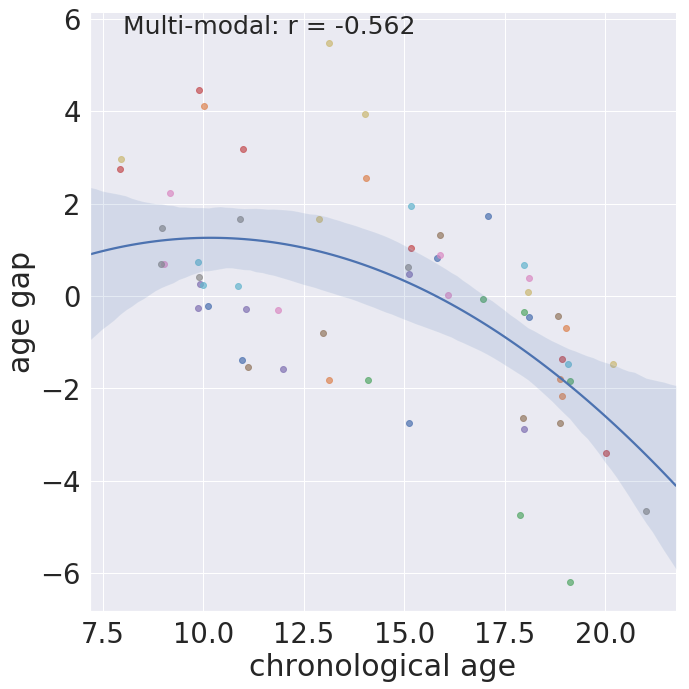

<Figure size 1080x1080 with 0 Axes>

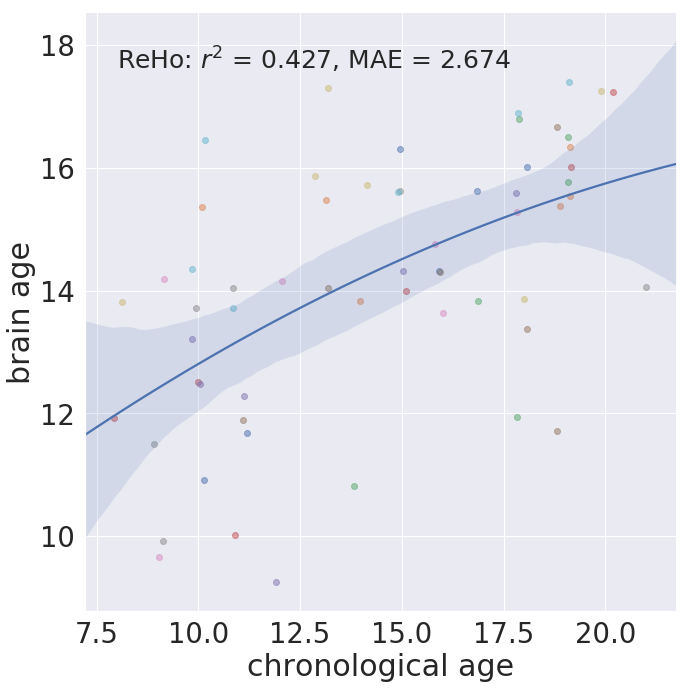

<Figure size 1080x1080 with 0 Axes>

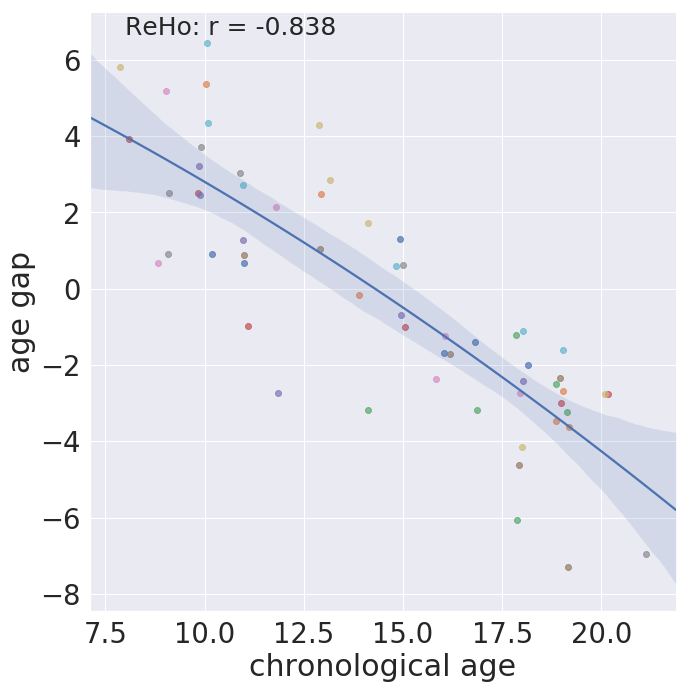

In [7]:
# plot dnn regression results:
import pandas as pd
from my_fun import plot_result_mergecv


# to make the plot show up if codes are called in a function.
%matplotlib inline
scatter_data = pd.read_csv(result_dir + "scatter_data_dnn.csv", sep = ",", header = 0, )
plot_result_mergecv(result_summary_dnn, scatter_data)

/home/xin/environments/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


Text(0.5,1,'DNN')

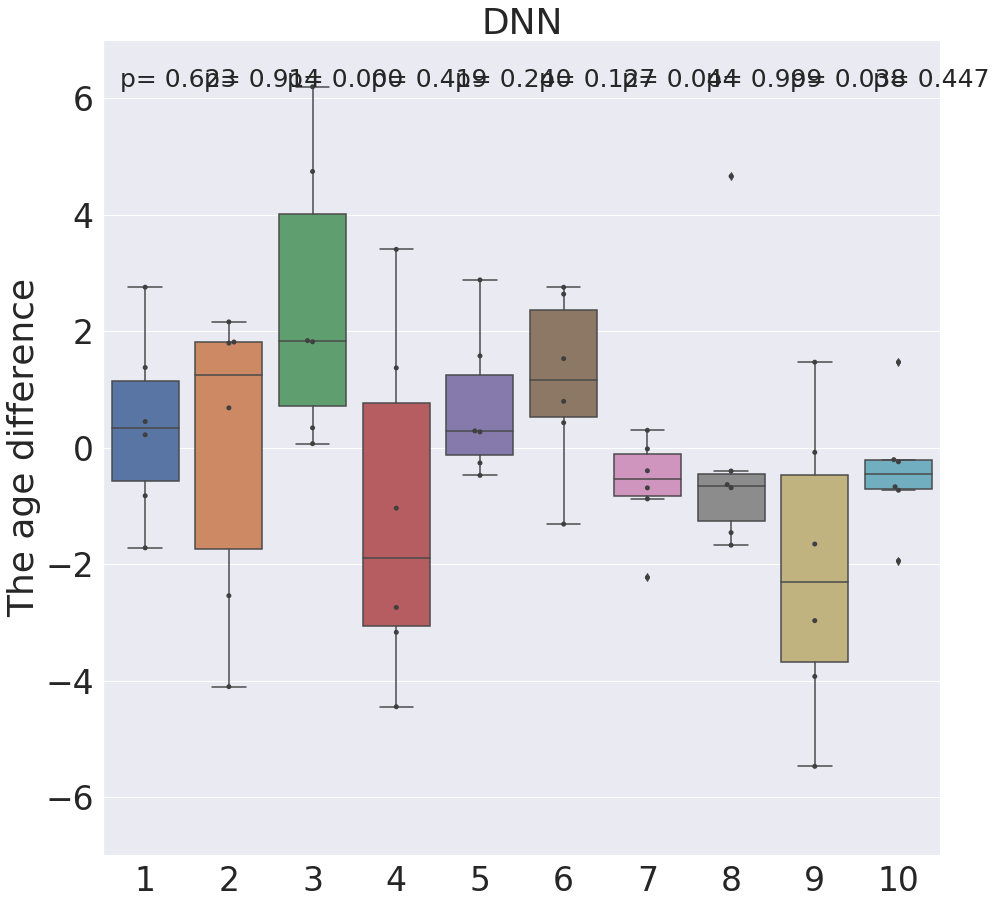

In [8]:
# test residuals from 0 for each CV:
# plot_data_multimodal = plot_data_mi.loc['vbm_dti_alff_reho']
plot_data = scatter_data

plot_data_mi = plot_data.set_index(['feature','CV']).sort_index()
plot_data_multimodal = plot_data_mi.loc['Multi-modal']
# plot_data_multimodal.loc[:,'residual'] = plot_data_multimodal.loc[:,'chronological age'] - \
#                                     plot_data_multimodal.loc[:,'brain age']
plot_data_multimodal['residual'] = plot_data_multimodal.loc[:,'chronological age'] - \
                                    plot_data_multimodal.loc[:,'brain age']

plot_data_multimodal2 = plot_data_multimodal.reset_index(level = 0)
#print(plot_data_multimodal)
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure()
sns.set(rc={'figure.figsize':(30, 15)}, font_scale = 3)

ax = sns.boxplot(y = "residual", x = "CV", data = plot_data_multimodal2)
ax = sns.swarmplot(y = "residual", x = "CV", data=plot_data_multimodal2, color=".25")
ax.set_ylim(-7,7)

from mlxtend.evaluate import permutation_test


for i in range(nfold):
    residual = plot_data_multimodal.loc[i+1, 'residual']
    p = permutation_test(residual, np.zeros(residual.shape[0]), method='approximate',num_rounds=1000,seed=0)
    
    txt = "p= %.3f" % p 
    ax.text(i-.3, 6.2, txt, fontsize = 25)

ax.set(ylabel="The age difference", xlabel="")
plt.title("DNN")